In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/mmseg

/content/drive/MyDrive/mmseg


In [ ]:
!pip3 install openmim
!mim install mmcv-full

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for openmim: filename=openmim-0.1.5-py2.py3-none-any.whl size=42503 sha256=782fdb5d650124a31e4754c3f475f7c2d514908471338419981407800f13c9df
  Stored in directory: /root/.cache/pip/wheels/16/8b/e1/bdebbbc687aa50224a5ce46fe97a040a0c59f92b34bfc750b6
Successfully built openmim
installing mmcv-full from wheel.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.11.0/index.html
     |████████████████████████████████| 37.5 MB 225 kB/s 
     |████████████████████████████████| 190 kB 9.6 MB/s 


In [ ]:
!rm -rf mmsegmentation
!git clone https://github.com/open-mmlab/mmsegmentation.git
%cd mmsegmentation
!pip install -e

Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7248, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 7248 (delta 0), reused 0 (delta 0), pack-reused 7242
Receiving objects: 100% (7248/7248), 13.35 MiB | 16.96 MiB/s, done.
Resolving deltas: 100% (5389/5389), done.
Checking out files: 100% (1212/1212), done.
/content/drive/MyDrive/mmseg/mmsegmentation

Usage:   
  pip3 install [options] <requirement specifier> [package-index-options] ...
  pip3 install [options] -r <requirements file> [package-index-options] ...
  pip3 install [options] [-e] <vcs project url> ...
  pip3 install [options] [-e] <local project path> ...
  pip3 install [options] <archive url/path> ...

-e option requires 1 argument


In [ ]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette

In [ ]:
import os.path as osp
import numpy as np
from PIL import Image
# Set up paths
data_root = 'data'
img_dir = 'images'
ann_dir = 'labels'
# define class and plaette for better visualization
classes = ('error', 'background')
palette = [[128, 128, 128], [241, 134, 51]]

In [ ]:
import mmseg
import mmcv

In [ ]:
# split train/val set randomly
split_dir = 'splits'
mmcv.mkdir_or_exist(osp.join(data_root, split_dir))
filename_list = [osp.splitext(filename)[0] for filename in mmcv.scandir(
    osp.join(data_root, ann_dir), suffix='.png')]
with open(osp.join(data_root, split_dir, 'train.txt'), 'w') as f:
  # select first 4/5 as train set
  train_length = int(len(filename_list)*4/5)
  f.writelines(line + '\n' for line in filename_list[:train_length])
with open(osp.join(data_root, split_dir, 'val.txt'), 'w') as f:
  # select last 1/5 as val set
  f.writelines(line + '\n' for line in filename_list[train_length:])

In [ ]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

@DATASETS.register_module()
class PotatoDataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.jpg', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

KeyError: ignored

In [ ]:
%cd /content/drive/MyDrive/mmseg/mmsegmentation

/content/drive/MyDrive/mmseg/mmsegmentation


In [ ]:
import torch
def get_device():

  is_device_available = {'cuda': torch.cuda.is_available()}
  device_list = [k for k, v in is_device_available.items() if v]
  return device_list[0] if len(device_list) == 1 else 'cpu'

from mmcv import Config
cfg = Config.fromfile('configs/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes.py')
cfg["device"] = get_device()

In [ ]:
!mkdir checkpoints

In [ ]:
%cd /content/drive/MyDrive/mmseg/mmsegmentation/checkpoints

/content/drive/MyDrive/mmseg/mmsegmentation/checkpoints


In [ ]:
!wget https://download.openmmlab.com/mmsegmentation/v0.5/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth

--2022-06-09 02:39:23--  https://download.openmmlab.com/mmsegmentation/v0.5/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 196205945 (187M) [application/octet-stream]
Saving to: ‘pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth’

pspnet_r50-d8_512x1 100%[===================>] 187.12M  10.3MB/s    in 18s     

2022-06-09 02:39:42 (10.3 MB/s) - ‘pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth’ saved [196205945/196205945]



In [ ]:
from mmseg.apis import set_random_seed
cfg.checkpoint_config.meta = dict(
    CLASSES=classes,
    PALETTE=palette)

# Since we use ony one GPU, BN is used instead of SyncBN
cfg.norm_cfg = dict(type='BN', requires_grad=True)
cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg
cfg.model.auxiliary_head.norm_cfg = cfg.norm_cfg
# modify num classes of the model in decode/auxiliary head
cfg.model.decode_head.num_classes = 8
cfg.model.auxiliary_head.num_classes = 8

# Modify dataset type and path
cfg.dataset_type = 'PotatoDataset'
cfg.data_root = data_root

cfg.data.samples_per_gpu = 8
cfg.data.workers_per_gpu=8

cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (256, 256)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(320, 240), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(320, 240),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]


cfg.data.train.type = cfg.dataset_type
cfg.data.train.data_root = cfg.data_root
cfg.data.train.img_dir = img_dir
cfg.data.train.ann_dir = ann_dir
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = 'splits/train.txt'

cfg.data.val.type = cfg.dataset_type
cfg.data.val.data_root = cfg.data_root
cfg.data.val.img_dir = img_dir
cfg.data.val.ann_dir = ann_dir
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = 'splits/val.txt'

cfg.data.test.type = cfg.dataset_type
cfg.data.test.data_root = cfg.data_root
cfg.data.test.img_dir = img_dir
cfg.data.test.ann_dir = ann_dir
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = 'splits/val.txt'

# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch
cfg.load_from = 'checkpoints/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './work_dirs/tutorial'

cfg.total_iters = 200
cfg.log_config.interval = 10
cfg.evaluation.interval = 200
cfg.checkpoint_config.interval = 200

# Set seed to facitate reproducing the result
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='ResNetV1c',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        dilations=(1, 1, 2, 4),
        strides=(1, 2, 1, 1),
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        style='pytorch',
        contract_dilation=True,
        pretrained=None),
    decode_head=dict(
        type='PSPHead',
        in_channels=2048,
        in_index=3,
        channels=512,
        pool_scales=(1, 2, 3, 6),
        dropout_ratio=0.1,
        num_classes=8,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    auxiliary_head=dict(
        type='FCNHead',
        in_channels=1024,
        in_index=2,
        channels=256,
        num_convs=1,
        concat_input

In [ ]:
%cd /content/drive/MyDrive/mmseg/mmsegmentation

/content/drive/MyDrive/mmseg/mmsegmentation


In [ ]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor


# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES
# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True, 
                meta=dict())

2022-06-09 02:40:04,944 - mmseg - INFO - Loaded 252 images
/content/drive/MyDrive/mmseg/mmsegmentation/mmseg/models/backbones/resnet.py:431: UserWarning: DeprecationWarning: pretrained is a deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is a deprecated, '
/content/drive/MyDrive/mmseg/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get Da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 2.6 task/s, elapsed: 24s, ETA:     0s

2022-06-09 02:42:04,092 - mmseg - INFO - per class results:
2022-06-09 02:42:04,094 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 98.56 | 99.28 |
| background | 85.46 | 92.07 |
+------------+-------+-------+
2022-06-09 02:42:04,096 - mmseg - INFO - Summary:
2022-06-09 02:42:04,098 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.67 | 92.01 | 95.68 |
+-------+-------+-------+
2022-06-09 02:42:04,100 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9867, mIoU: 0.9201, mAcc: 0.9568, IoU.error: 0.9856, IoU.background: 0.8546, Acc.error: 0.9928, Acc.background: 0.9207
2022-06-09 02:42:07,712 - mmseg - INFO - Iter [210/40000]	lr: 9.953e-03, eta: 6:23:27, time: 2.780, data_time: 2.424, memory: 5700, decode.loss_ce: 0.0397, decode.acc_seg: 98.2356, aux.loss_ce: 0.0194, aux.acc_seg: 98.1082, loss: 0.0591
2022-06-09 02:42:13,760 - mmseg - INFO - Iter [220/40000]	lr: 9.951e-0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:43:37,899 - mmseg - INFO - per class results:
2022-06-09 02:43:37,901 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  98.8 | 99.58 |
| background | 87.59 | 91.54 |
+------------+-------+-------+
2022-06-09 02:43:37,902 - mmseg - INFO - Summary:
2022-06-09 02:43:37,904 - mmseg - INFO - 
+------+------+-------+
| aAcc | mIoU |  mAcc |
+------+------+-------+
| 98.9 | 93.2 | 95.56 |
+------+------+-------+
2022-06-09 02:43:37,906 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9890, mIoU: 0.9320, mAcc: 0.9556, IoU.error: 0.9880, IoU.background: 0.8759, Acc.error: 0.9958, Acc.background: 0.9154
2022-06-09 02:43:44,110 - mmseg - INFO - Iter [410/40000]	lr: 9.909e-03, eta: 5:50:33, time: 0.998, data_time: 0.643, memory: 5700, decode.loss_ce: 0.0274, decode.acc_seg: 98.8218, aux.loss_ce: 0.0139, aux.acc_seg: 98.6608, loss: 0.0413
2022-06-09 02:43:47,725 - mmseg - INFO - Iter [420/40000]	lr: 9.907e-03, eta: 5:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:45:14,059 - mmseg - INFO - per class results:
2022-06-09 02:45:14,060 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 98.85 | 99.47 |
| background | 88.24 | 93.26 |
+------------+-------+-------+
2022-06-09 02:45:14,062 - mmseg - INFO - Summary:
2022-06-09 02:45:14,063 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.94 | 93.54 | 96.37 |
+-------+-------+-------+
2022-06-09 02:45:14,066 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9894, mIoU: 0.9354, mAcc: 0.9637, IoU.error: 0.9885, IoU.background: 0.8824, Acc.error: 0.9947, Acc.background: 0.9326
2022-06-09 02:45:17,684 - mmseg - INFO - Iter [610/40000]	lr: 9.864e-03, eta: 5:35:07, time: 0.729, data_time: 0.374, memory: 5700, decode.loss_ce: 0.0262, decode.acc_seg: 98.6524, aux.loss_ce: 0.0123, aux.acc_seg: 98.5375, loss: 0.0385
2022-06-09 02:45:21,295 - mmseg - INFO - Iter [620/40000]	lr: 9.862e-0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:46:47,210 - mmseg - INFO - per class results:
2022-06-09 02:46:47,212 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 98.95 | 99.52 |
| background | 89.22 | 93.84 |
+------------+-------+-------+
2022-06-09 02:46:47,215 - mmseg - INFO - Summary:
2022-06-09 02:46:47,216 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.04 | 94.09 | 96.68 |
+-------+-------+-------+
2022-06-09 02:46:47,221 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9904, mIoU: 0.9409, mAcc: 0.9668, IoU.error: 0.9895, IoU.background: 0.8922, Acc.error: 0.9952, Acc.background: 0.9384
2022-06-09 02:46:53,471 - mmseg - INFO - Iter [810/40000]	lr: 9.820e-03, eta: 5:28:20, time: 0.992, data_time: 0.642, memory: 5700, decode.loss_ce: 0.0294, decode.acc_seg: 98.5930, aux.loss_ce: 0.0144, aux.acc_seg: 98.4351, loss: 0.0439
2022-06-09 02:46:57,092 - mmseg - INFO - Iter [820/40000]	lr: 9.817e-0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:48:22,826 - mmseg - INFO - per class results:
2022-06-09 02:48:22,828 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 98.84 | 99.52 |
| background | 88.06 | 92.59 |
+------------+-------+-------+
2022-06-09 02:48:22,830 - mmseg - INFO - Summary:
2022-06-09 02:48:22,833 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.93 | 93.45 | 96.06 |
+-------+-------+-------+
2022-06-09 02:48:22,835 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9893, mIoU: 0.9345, mAcc: 0.9606, IoU.error: 0.9884, IoU.background: 0.8806, Acc.error: 0.9952, Acc.background: 0.9259
2022-06-09 02:48:26,456 - mmseg - INFO - Iter [1010/40000]	lr: 9.775e-03, eta: 5:21:48, time: 0.729, data_time: 0.374, memory: 5700, decode.loss_ce: 0.0262, decode.acc_seg: 98.7151, aux.loss_ce: 0.0122, aux.acc_seg: 98.5959, loss: 0.0384
2022-06-09 02:48:30,063 - mmseg - INFO - Iter [1020/40000]	lr: 9.773e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:49:56,347 - mmseg - INFO - per class results:
2022-06-09 02:49:56,348 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 98.94 | 99.36 |
| background | 89.29 | 95.41 |
+------------+-------+-------+
2022-06-09 02:49:56,350 - mmseg - INFO - Summary:
2022-06-09 02:49:56,351 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.03 | 94.11 | 97.39 |
+-------+-------+-------+
2022-06-09 02:49:56,355 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9903, mIoU: 0.9411, mAcc: 0.9739, IoU.error: 0.9894, IoU.background: 0.8929, Acc.error: 0.9936, Acc.background: 0.9541
2022-06-09 02:50:02,530 - mmseg - INFO - Iter [1210/40000]	lr: 9.730e-03, eta: 5:18:34, time: 0.991, data_time: 0.639, memory: 5700, decode.loss_ce: 0.0222, decode.acc_seg: 98.8573, aux.loss_ce: 0.0101, aux.acc_seg: 98.7991, loss: 0.0323
2022-06-09 02:50:06,190 - mmseg - INFO - Iter [1220/40000]	lr: 9.728e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:51:31,796 - mmseg - INFO - per class results:
2022-06-09 02:51:31,798 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.04 | 99.63 |
| background | 90.02 | 93.63 |
+------------+-------+-------+
2022-06-09 02:51:31,800 - mmseg - INFO - Summary:
2022-06-09 02:51:31,803 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.12 | 94.53 | 96.63 |
+-------+-------+-------+
2022-06-09 02:51:31,805 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9912, mIoU: 0.9453, mAcc: 0.9663, IoU.error: 0.9904, IoU.background: 0.9002, Acc.error: 0.9963, Acc.background: 0.9363
2022-06-09 02:51:35,427 - mmseg - INFO - Iter [1410/40000]	lr: 9.686e-03, eta: 5:14:20, time: 0.741, data_time: 0.386, memory: 5700, decode.loss_ce: 0.0235, decode.acc_seg: 98.7686, aux.loss_ce: 0.0102, aux.acc_seg: 98.7297, loss: 0.0336
2022-06-09 02:51:39,038 - mmseg - INFO - Iter [1420/40000]	lr: 9.683e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:53:05,235 - mmseg - INFO - per class results:
2022-06-09 02:53:05,237 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.09 | 99.62 |
| background | 90.49 | 94.22 |
+------------+-------+-------+
2022-06-09 02:53:05,238 - mmseg - INFO - Summary:
2022-06-09 02:53:05,242 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.16 | 94.79 | 96.92 |
+-------+-------+-------+
2022-06-09 02:53:05,243 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9916, mIoU: 0.9479, mAcc: 0.9692, IoU.error: 0.9909, IoU.background: 0.9049, Acc.error: 0.9962, Acc.background: 0.9422
2022-06-09 02:53:08,853 - mmseg - INFO - Iter [1610/40000]	lr: 9.641e-03, eta: 5:10:59, time: 0.745, data_time: 0.392, memory: 5700, decode.loss_ce: 0.0195, decode.acc_seg: 98.9539, aux.loss_ce: 0.0087, aux.acc_seg: 98.8957, loss: 0.0281
2022-06-09 02:53:15,204 - mmseg - INFO - Iter [1620/40000]	lr: 9.639e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:54:41,205 - mmseg - INFO - per class results:
2022-06-09 02:54:41,207 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.01 | 99.56 |
| background | 89.76 | 93.99 |
+------------+-------+-------+
2022-06-09 02:54:41,208 - mmseg - INFO - Summary:
2022-06-09 02:54:41,210 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.09 | 94.39 | 96.78 |
+-------+-------+-------+
2022-06-09 02:54:41,213 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9909, mIoU: 0.9439, mAcc: 0.9678, IoU.error: 0.9901, IoU.background: 0.8976, Acc.error: 0.9956, Acc.background: 0.9399
2022-06-09 02:54:44,826 - mmseg - INFO - Iter [1810/40000]	lr: 9.596e-03, eta: 5:08:56, time: 0.735, data_time: 0.381, memory: 5700, decode.loss_ce: 0.0186, decode.acc_seg: 99.0573, aux.loss_ce: 0.0084, aux.acc_seg: 98.9951, loss: 0.0269
2022-06-09 02:54:48,432 - mmseg - INFO - Iter [1820/40000]	lr: 9.594e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:56:14,198 - mmseg - INFO - per class results:
2022-06-09 02:56:14,200 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.05 | 99.64 |
| background | 90.06 | 93.59 |
+------------+-------+-------+
2022-06-09 02:56:14,203 - mmseg - INFO - Summary:
2022-06-09 02:56:14,205 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.12 | 94.55 | 96.61 |
+-------+-------+-------+
2022-06-09 02:56:14,207 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9912, mIoU: 0.9455, mAcc: 0.9661, IoU.error: 0.9905, IoU.background: 0.9006, Acc.error: 0.9964, Acc.background: 0.9359
2022-06-09 02:56:17,818 - mmseg - INFO - Iter [2010/40000]	lr: 9.551e-03, eta: 5:06:02, time: 0.737, data_time: 0.384, memory: 5700, decode.loss_ce: 0.0175, decode.acc_seg: 99.0808, aux.loss_ce: 0.0082, aux.acc_seg: 99.0024, loss: 0.0257
2022-06-09 02:56:23,966 - mmseg - INFO - Iter [2020/40000]	lr: 9.549e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.2 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:57:47,581 - mmseg - INFO - per class results:
2022-06-09 02:57:47,583 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.1 | 99.59 |
| background | 90.69 | 94.64 |
+------------+-------+-------+
2022-06-09 02:57:47,584 - mmseg - INFO - Summary:
2022-06-09 02:57:47,586 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.17 | 94.89 | 97.12 |
+-------+-------+-------+
2022-06-09 02:57:47,591 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9917, mIoU: 0.9489, mAcc: 0.9712, IoU.error: 0.9910, IoU.background: 0.9069, Acc.error: 0.9959, Acc.background: 0.9464
2022-06-09 02:57:53,853 - mmseg - INFO - Iter [2210/40000]	lr: 9.507e-03, eta: 5:04:14, time: 0.996, data_time: 0.640, memory: 5700, decode.loss_ce: 0.0202, decode.acc_seg: 98.9860, aux.loss_ce: 0.0092, aux.acc_seg: 98.9208, loss: 0.0294
2022-06-09 02:57:57,460 - mmseg - INFO - Iter [2220/40000]	lr: 9.504e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 02:59:23,750 - mmseg - INFO - per class results:
2022-06-09 02:59:23,754 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.07 | 99.62 |
| background | 90.33 | 93.98 |
+------------+-------+-------+
2022-06-09 02:59:23,755 - mmseg - INFO - Summary:
2022-06-09 02:59:23,759 - mmseg - INFO - 
+-------+------+------+
|  aAcc | mIoU | mAcc |
+-------+------+------+
| 99.15 | 94.7 | 96.8 |
+-------+------+------+
2022-06-09 02:59:23,762 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9915, mIoU: 0.9470, mAcc: 0.9680, IoU.error: 0.9907, IoU.background: 0.9033, Acc.error: 0.9962, Acc.background: 0.9398
2022-06-09 02:59:27,386 - mmseg - INFO - Iter [2410/40000]	lr: 9.462e-03, eta: 5:01:50, time: 0.744, data_time: 0.388, memory: 5700, decode.loss_ce: 0.0175, decode.acc_seg: 99.1662, aux.loss_ce: 0.0081, aux.acc_seg: 99.0828, loss: 0.0256
2022-06-09 02:59:33,517 - mmseg - INFO - Iter [2420/40000]	lr: 9.460e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:00:57,261 - mmseg - INFO - per class results:
2022-06-09 03:00:57,263 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.04 |  99.6 |
| background | 90.06 | 93.97 |
+------------+-------+-------+
2022-06-09 03:00:57,264 - mmseg - INFO - Summary:
2022-06-09 03:00:57,267 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.12 | 94.55 | 96.78 |
+-------+-------+-------+
2022-06-09 03:00:57,269 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9912, mIoU: 0.9455, mAcc: 0.9678, IoU.error: 0.9904, IoU.background: 0.9006, Acc.error: 0.9960, Acc.background: 0.9397
2022-06-09 03:01:03,488 - mmseg - INFO - Iter [2610/40000]	lr: 9.417e-03, eta: 5:00:10, time: 0.997, data_time: 0.640, memory: 5700, decode.loss_ce: 0.0161, decode.acc_seg: 99.0552, aux.loss_ce: 0.0072, aux.acc_seg: 98.9937, loss: 0.0233
2022-06-09 03:01:07,096 - mmseg - INFO - Iter [2620/40000]	lr: 9.415e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.2 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:02:33,479 - mmseg - INFO - per class results:
2022-06-09 03:02:33,481 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 98.82 | 99.36 |
| background | 88.02 | 94.08 |
+------------+-------+-------+
2022-06-09 03:02:33,483 - mmseg - INFO - Summary:
2022-06-09 03:02:33,484 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.91 | 93.42 | 96.72 |
+-------+-------+-------+
2022-06-09 03:02:33,489 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9891, mIoU: 0.9342, mAcc: 0.9672, IoU.error: 0.9882, IoU.background: 0.8802, Acc.error: 0.9936, Acc.background: 0.9408
2022-06-09 03:02:37,086 - mmseg - INFO - Iter [2810/40000]	lr: 9.372e-03, eta: 4:57:57, time: 0.731, data_time: 0.378, memory: 5700, decode.loss_ce: 0.0569, decode.acc_seg: 97.9359, aux.loss_ce: 0.0214, aux.acc_seg: 97.8794, loss: 0.0782
2022-06-09 03:02:40,694 - mmseg - INFO - Iter [2820/40000]	lr: 9.370e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:04:06,827 - mmseg - INFO - per class results:
2022-06-09 03:04:06,829 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.07 | 99.57 |
| background | 90.34 | 94.52 |
+------------+-------+-------+
2022-06-09 03:04:06,830 - mmseg - INFO - Summary:
2022-06-09 03:04:06,831 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.14 | 94.7 | 97.04 |
+-------+------+-------+
2022-06-09 03:04:06,835 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9914, mIoU: 0.9470, mAcc: 0.9704, IoU.error: 0.9907, IoU.background: 0.9034, Acc.error: 0.9957, Acc.background: 0.9452
2022-06-09 03:04:13,227 - mmseg - INFO - Iter [3010/40000]	lr: 9.327e-03, eta: 4:56:21, time: 1.021, data_time: 0.664, memory: 5700, decode.loss_ce: 0.0248, decode.acc_seg: 98.7482, aux.loss_ce: 0.0126, aux.acc_seg: 98.5946, loss: 0.0374
2022-06-09 03:04:16,852 - mmseg - INFO - Iter [3020/40000]	lr: 9.325e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 14.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:05:45,209 - mmseg - INFO - per class results:
2022-06-09 03:05:45,212 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 98.99 | 99.64 |
| background | 89.45 | 92.91 |
+------------+-------+-------+
2022-06-09 03:05:45,214 - mmseg - INFO - Summary:
2022-06-09 03:05:45,217 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.07 | 94.22 | 96.27 |
+-------+-------+-------+
2022-06-09 03:05:45,219 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9907, mIoU: 0.9422, mAcc: 0.9627, IoU.error: 0.9899, IoU.background: 0.8945, Acc.error: 0.9964, Acc.background: 0.9291
2022-06-09 03:05:48,830 - mmseg - INFO - Iter [3210/40000]	lr: 9.282e-03, eta: 4:54:38, time: 0.799, data_time: 0.445, memory: 5700, decode.loss_ce: 0.0238, decode.acc_seg: 98.8269, aux.loss_ce: 0.0099, aux.acc_seg: 98.8081, loss: 0.0337
2022-06-09 03:05:52,436 - mmseg - INFO - Iter [3220/40000]	lr: 9.280e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:07:18,368 - mmseg - INFO - per class results:
2022-06-09 03:07:18,371 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 98.98 | 99.47 |
| background | 89.53 | 94.61 |
+------------+-------+-------+
2022-06-09 03:07:18,373 - mmseg - INFO - Summary:
2022-06-09 03:07:18,379 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.06 | 94.25 | 97.04 |
+-------+-------+-------+
2022-06-09 03:07:18,381 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9906, mIoU: 0.9425, mAcc: 0.9704, IoU.error: 0.9898, IoU.background: 0.8953, Acc.error: 0.9947, Acc.background: 0.9461
2022-06-09 03:07:22,006 - mmseg - INFO - Iter [3410/40000]	lr: 9.237e-03, eta: 4:52:31, time: 0.742, data_time: 0.386, memory: 5700, decode.loss_ce: 0.0182, decode.acc_seg: 99.0493, aux.loss_ce: 0.0084, aux.acc_seg: 98.9789, loss: 0.0265
2022-06-09 03:07:28,245 - mmseg - INFO - Iter [3420/40000]	lr: 9.235e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:08:54,194 - mmseg - INFO - per class results:
2022-06-09 03:08:54,196 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.08 | 99.55 |
| background | 90.46 | 94.81 |
+------------+-------+-------+
2022-06-09 03:08:54,197 - mmseg - INFO - Summary:
2022-06-09 03:08:54,198 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.15 | 94.77 | 97.18 |
+-------+-------+-------+
2022-06-09 03:08:54,200 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9915, mIoU: 0.9477, mAcc: 0.9718, IoU.error: 0.9908, IoU.background: 0.9046, Acc.error: 0.9955, Acc.background: 0.9481
2022-06-09 03:08:57,811 - mmseg - INFO - Iter [3610/40000]	lr: 9.192e-03, eta: 4:50:54, time: 0.734, data_time: 0.380, memory: 5700, decode.loss_ce: 0.0179, decode.acc_seg: 99.0759, aux.loss_ce: 0.0076, aux.acc_seg: 99.0163, loss: 0.0255
2022-06-09 03:09:01,422 - mmseg - INFO - Iter [3620/40000]	lr: 9.190e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:10:27,455 - mmseg - INFO - per class results:
2022-06-09 03:10:27,457 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.11 | 99.66 |
| background |  90.7 | 94.02 |
+------------+-------+-------+
2022-06-09 03:10:27,459 - mmseg - INFO - Summary:
2022-06-09 03:10:27,460 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.18 | 94.91 | 96.84 |
+-------+-------+-------+
2022-06-09 03:10:27,462 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9918, mIoU: 0.9491, mAcc: 0.9684, IoU.error: 0.9911, IoU.background: 0.9070, Acc.error: 0.9966, Acc.background: 0.9402
2022-06-09 03:10:31,073 - mmseg - INFO - Iter [3810/40000]	lr: 9.147e-03, eta: 4:48:52, time: 0.742, data_time: 0.388, memory: 5700, decode.loss_ce: 0.0166, decode.acc_seg: 99.1066, aux.loss_ce: 0.0076, aux.acc_seg: 99.0222, loss: 0.0243
2022-06-09 03:10:37,265 - mmseg - INFO - Iter [3820/40000]	lr: 9.145e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:12:03,691 - mmseg - INFO - per class results:
2022-06-09 03:12:03,693 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.07 | 99.63 |
| background | 90.34 | 93.95 |
+------------+-------+-------+
2022-06-09 03:12:03,694 - mmseg - INFO - Summary:
2022-06-09 03:12:03,696 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.15 | 94.71 | 96.79 |
+-------+-------+-------+
2022-06-09 03:12:03,700 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9915, mIoU: 0.9471, mAcc: 0.9679, IoU.error: 0.9907, IoU.background: 0.9034, Acc.error: 0.9963, Acc.background: 0.9395
2022-06-09 03:12:07,328 - mmseg - INFO - Iter [4010/40000]	lr: 9.102e-03, eta: 4:47:21, time: 0.740, data_time: 0.384, memory: 5700, decode.loss_ce: 0.0180, decode.acc_seg: 99.1368, aux.loss_ce: 0.0083, aux.acc_seg: 99.0792, loss: 0.0263
2022-06-09 03:12:10,942 - mmseg - INFO - Iter [4020/40000]	lr: 9.100e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:13:37,010 - mmseg - INFO - per class results:
2022-06-09 03:13:37,014 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.12 | 99.53 |
| background | 90.93 | 95.48 |
+------------+-------+-------+
2022-06-09 03:13:37,016 - mmseg - INFO - Summary:
2022-06-09 03:13:37,021 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.19 | 95.02 | 97.51 |
+-------+-------+-------+
2022-06-09 03:13:37,022 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9919, mIoU: 0.9502, mAcc: 0.9751, IoU.error: 0.9912, IoU.background: 0.9093, Acc.error: 0.9953, Acc.background: 0.9548
2022-06-09 03:13:40,625 - mmseg - INFO - Iter [4210/40000]	lr: 9.057e-03, eta: 4:45:24, time: 0.728, data_time: 0.374, memory: 5700, decode.loss_ce: 0.0155, decode.acc_seg: 99.1883, aux.loss_ce: 0.0070, aux.acc_seg: 99.1352, loss: 0.0225
2022-06-09 03:13:46,856 - mmseg - INFO - Iter [4220/40000]	lr: 9.055e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:15:10,008 - mmseg - INFO - per class results:
2022-06-09 03:15:10,011 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.12 | 99.56 |
| background | 90.89 |  95.2 |
+------------+-------+-------+
2022-06-09 03:15:10,013 - mmseg - INFO - Summary:
2022-06-09 03:15:10,016 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.19 | 95.0 | 97.38 |
+-------+------+-------+
2022-06-09 03:15:10,023 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9919, mIoU: 0.9500, mAcc: 0.9738, IoU.error: 0.9912, IoU.background: 0.9089, Acc.error: 0.9956, Acc.background: 0.9520
2022-06-09 03:15:16,168 - mmseg - INFO - Iter [4410/40000]	lr: 9.012e-03, eta: 4:43:47, time: 0.993, data_time: 0.636, memory: 5700, decode.loss_ce: 0.0175, decode.acc_seg: 99.0963, aux.loss_ce: 0.0079, aux.acc_seg: 99.0242, loss: 0.0254
2022-06-09 03:15:19,776 - mmseg - INFO - Iter [4420/40000]	lr: 9.010e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:16:47,031 - mmseg - INFO - per class results:
2022-06-09 03:16:47,034 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.63 |
| background |  91.1 | 94.76 |
+------------+-------+-------+
2022-06-09 03:16:47,035 - mmseg - INFO - Summary:
2022-06-09 03:16:47,036 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.21 | 95.12 | 97.2 |
+-------+-------+------+
2022-06-09 03:16:47,043 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9512, mAcc: 0.9720, IoU.error: 0.9914, IoU.background: 0.9110, Acc.error: 0.9963, Acc.background: 0.9476
2022-06-09 03:16:50,660 - mmseg - INFO - Iter [4610/40000]	lr: 8.967e-03, eta: 4:42:02, time: 0.739, data_time: 0.385, memory: 5700, decode.loss_ce: 0.0190, decode.acc_seg: 99.0608, aux.loss_ce: 0.0087, aux.acc_seg: 98.9920, loss: 0.0278
2022-06-09 03:16:56,837 - mmseg - INFO - Iter [4620/40000]	lr: 8.965e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:18:20,221 - mmseg - INFO - per class results:
2022-06-09 03:18:20,223 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.1 | 99.62 |
| background | 90.59 | 94.24 |
+------------+-------+-------+
2022-06-09 03:18:20,224 - mmseg - INFO - Summary:
2022-06-09 03:18:20,226 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.17 | 94.84 | 96.93 |
+-------+-------+-------+
2022-06-09 03:18:20,230 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9917, mIoU: 0.9484, mAcc: 0.9693, IoU.error: 0.9910, IoU.background: 0.9059, Acc.error: 0.9962, Acc.background: 0.9424
2022-06-09 03:18:26,542 - mmseg - INFO - Iter [4810/40000]	lr: 8.922e-03, eta: 4:40:28, time: 1.006, data_time: 0.652, memory: 5700, decode.loss_ce: 0.0215, decode.acc_seg: 98.9834, aux.loss_ce: 0.0093, aux.acc_seg: 98.9656, loss: 0.0308
2022-06-09 03:18:30,152 - mmseg - INFO - Iter [4820/40000]	lr: 8.920e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:19:55,942 - mmseg - INFO - per class results:
2022-06-09 03:19:55,945 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.55 |
| background | 91.41 | 95.86 |
+------------+-------+-------+
2022-06-09 03:19:55,946 - mmseg - INFO - Summary:
2022-06-09 03:19:55,948 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.23 | 95.29 | 97.7 |
+-------+-------+------+
2022-06-09 03:19:55,953 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9529, mAcc: 0.9770, IoU.error: 0.9917, IoU.background: 0.9141, Acc.error: 0.9955, Acc.background: 0.9586
2022-06-09 03:19:59,551 - mmseg - INFO - Iter [5010/40000]	lr: 8.877e-03, eta: 4:38:34, time: 0.724, data_time: 0.371, memory: 5700, decode.loss_ce: 0.0154, decode.acc_seg: 99.2179, aux.loss_ce: 0.0069, aux.acc_seg: 99.1766, loss: 0.0223
2022-06-09 03:20:03,168 - mmseg - INFO - Iter [5020/40000]	lr: 8.875e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.2 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:21:28,966 - mmseg - INFO - per class results:
2022-06-09 03:21:28,969 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.58 |
| background | 91.25 | 95.37 |
+------------+-------+-------+
2022-06-09 03:21:28,970 - mmseg - INFO - Summary:
2022-06-09 03:21:28,972 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.22 | 95.2 | 97.48 |
+-------+------+-------+
2022-06-09 03:21:28,977 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9520, mAcc: 0.9748, IoU.error: 0.9915, IoU.background: 0.9125, Acc.error: 0.9958, Acc.background: 0.9537
2022-06-09 03:21:35,160 - mmseg - INFO - Iter [5210/40000]	lr: 8.832e-03, eta: 4:36:59, time: 0.988, data_time: 0.635, memory: 5700, decode.loss_ce: 0.0168, decode.acc_seg: 99.1888, aux.loss_ce: 0.0077, aux.acc_seg: 99.1048, loss: 0.0245
2022-06-09 03:21:38,788 - mmseg - INFO - Iter [5220/40000]	lr: 8.829e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:23:04,709 - mmseg - INFO - per class results:
2022-06-09 03:23:04,711 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.65 |
| background | 91.38 |  94.8 |
+------------+-------+-------+
2022-06-09 03:23:04,714 - mmseg - INFO - Summary:
2022-06-09 03:23:04,716 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.28 | 97.23 |
+-------+-------+-------+
2022-06-09 03:23:04,717 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9528, mAcc: 0.9723, IoU.error: 0.9917, IoU.background: 0.9138, Acc.error: 0.9965, Acc.background: 0.9480
2022-06-09 03:23:08,334 - mmseg - INFO - Iter [5410/40000]	lr: 8.787e-03, eta: 4:35:08, time: 0.737, data_time: 0.383, memory: 5700, decode.loss_ce: 0.0168, decode.acc_seg: 99.1916, aux.loss_ce: 0.0076, aux.acc_seg: 99.1569, loss: 0.0243
2022-06-09 03:23:11,941 - mmseg - INFO - Iter [5420/40000]	lr: 8.784e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:24:37,820 - mmseg - INFO - per class results:
2022-06-09 03:24:37,822 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 |  99.6 |
| background | 91.66 | 95.57 |
+------------+-------+-------+
2022-06-09 03:24:37,825 - mmseg - INFO - Summary:
2022-06-09 03:24:37,829 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.43 | 97.59 |
+-------+-------+-------+
2022-06-09 03:24:37,832 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9543, mAcc: 0.9759, IoU.error: 0.9920, IoU.background: 0.9166, Acc.error: 0.9960, Acc.background: 0.9557
2022-06-09 03:24:41,455 - mmseg - INFO - Iter [5610/40000]	lr: 8.741e-03, eta: 4:33:18, time: 0.742, data_time: 0.387, memory: 5700, decode.loss_ce: 0.0158, decode.acc_seg: 99.1630, aux.loss_ce: 0.0072, aux.acc_seg: 99.1060, loss: 0.0230
2022-06-09 03:24:47,673 - mmseg - INFO - Iter [5620/40000]	lr: 8.739e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:26:13,418 - mmseg - INFO - per class results:
2022-06-09 03:26:13,419 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.65 |
| background | 91.29 | 94.75 |
+------------+-------+-------+
2022-06-09 03:26:13,421 - mmseg - INFO - Summary:
2022-06-09 03:26:13,422 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.23 | 95.22 | 97.2 |
+-------+-------+------+
2022-06-09 03:26:13,423 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9522, mAcc: 0.9720, IoU.error: 0.9916, IoU.background: 0.9129, Acc.error: 0.9965, Acc.background: 0.9475
2022-06-09 03:26:17,048 - mmseg - INFO - Iter [5810/40000]	lr: 8.696e-03, eta: 4:31:44, time: 0.735, data_time: 0.380, memory: 5700, decode.loss_ce: 0.0170, decode.acc_seg: 99.1023, aux.loss_ce: 0.0075, aux.acc_seg: 99.0455, loss: 0.0245
2022-06-09 03:26:20,645 - mmseg - INFO - Iter [5820/40000]	lr: 8.694e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:27:46,599 - mmseg - INFO - per class results:
2022-06-09 03:27:46,601 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 |  99.7 |
| background | 90.99 | 93.96 |
+------------+-------+-------+
2022-06-09 03:27:46,602 - mmseg - INFO - Summary:
2022-06-09 03:27:46,604 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.07 | 96.83 |
+-------+-------+-------+
2022-06-09 03:27:46,607 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9507, mAcc: 0.9683, IoU.error: 0.9914, IoU.background: 0.9099, Acc.error: 0.9970, Acc.background: 0.9396
2022-06-09 03:27:50,222 - mmseg - INFO - Iter [6010/40000]	lr: 8.651e-03, eta: 4:29:56, time: 0.739, data_time: 0.385, memory: 5700, decode.loss_ce: 0.0148, decode.acc_seg: 99.2218, aux.loss_ce: 0.0068, aux.acc_seg: 99.1702, loss: 0.0216
2022-06-09 03:27:56,413 - mmseg - INFO - Iter [6020/40000]	lr: 8.649e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:29:19,859 - mmseg - INFO - per class results:
2022-06-09 03:29:19,862 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.11 | 99.64 |
| background | 90.67 | 94.15 |
+------------+-------+-------+
2022-06-09 03:29:19,864 - mmseg - INFO - Summary:
2022-06-09 03:29:19,869 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.18 | 94.89 | 96.9 |
+-------+-------+------+
2022-06-09 03:29:19,871 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9918, mIoU: 0.9489, mAcc: 0.9690, IoU.error: 0.9911, IoU.background: 0.9067, Acc.error: 0.9964, Acc.background: 0.9415
2022-06-09 03:29:26,246 - mmseg - INFO - Iter [6210/40000]	lr: 8.606e-03, eta: 4:28:25, time: 1.006, data_time: 0.649, memory: 5700, decode.loss_ce: 0.0181, decode.acc_seg: 99.1145, aux.loss_ce: 0.0080, aux.acc_seg: 99.0669, loss: 0.0261
2022-06-09 03:29:29,850 - mmseg - INFO - Iter [6220/40000]	lr: 8.603e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:30:55,586 - mmseg - INFO - per class results:
2022-06-09 03:30:55,588 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.13 | 99.72 |
| background | 90.88 | 93.61 |
+------------+-------+-------+
2022-06-09 03:30:55,590 - mmseg - INFO - Summary:
2022-06-09 03:30:55,592 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 99.2 | 95.01 | 96.67 |
+------+-------+-------+
2022-06-09 03:30:55,597 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9920, mIoU: 0.9501, mAcc: 0.9667, IoU.error: 0.9913, IoU.background: 0.9088, Acc.error: 0.9972, Acc.background: 0.9361
2022-06-09 03:30:59,218 - mmseg - INFO - Iter [6410/40000]	lr: 8.560e-03, eta: 4:26:37, time: 0.740, data_time: 0.385, memory: 5700, decode.loss_ce: 0.0207, decode.acc_seg: 98.9024, aux.loss_ce: 0.0093, aux.acc_seg: 98.8504, loss: 0.0300
2022-06-09 03:31:05,440 - mmseg - INFO - Iter [6420/40000]	lr: 8.558e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:32:28,690 - mmseg - INFO - per class results:
2022-06-09 03:32:28,692 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.07 |  99.7 |
| background | 90.25 | 93.12 |
+------------+-------+-------+
2022-06-09 03:32:28,696 - mmseg - INFO - Summary:
2022-06-09 03:32:28,697 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.14 | 94.66 | 96.41 |
+-------+-------+-------+
2022-06-09 03:32:28,701 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9914, mIoU: 0.9466, mAcc: 0.9641, IoU.error: 0.9907, IoU.background: 0.9025, Acc.error: 0.9970, Acc.background: 0.9312
2022-06-09 03:32:34,977 - mmseg - INFO - Iter [6610/40000]	lr: 8.515e-03, eta: 4:25:05, time: 0.995, data_time: 0.640, memory: 5700, decode.loss_ce: 0.0162, decode.acc_seg: 99.1924, aux.loss_ce: 0.0076, aux.acc_seg: 99.1092, loss: 0.0239
2022-06-09 03:32:38,581 - mmseg - INFO - Iter [6620/40000]	lr: 8.513e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:34:04,678 - mmseg - INFO - per class results:
2022-06-09 03:34:04,680 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.66 |
| background | 91.03 | 94.38 |
+------------+-------+-------+
2022-06-09 03:34:04,682 - mmseg - INFO - Summary:
2022-06-09 03:34:04,683 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.09 | 97.02 |
+-------+-------+-------+
2022-06-09 03:34:04,685 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9509, mAcc: 0.9702, IoU.error: 0.9914, IoU.background: 0.9103, Acc.error: 0.9966, Acc.background: 0.9438
2022-06-09 03:34:08,300 - mmseg - INFO - Iter [6810/40000]	lr: 8.469e-03, eta: 4:23:20, time: 0.737, data_time: 0.383, memory: 5700, decode.loss_ce: 0.0168, decode.acc_seg: 99.1567, aux.loss_ce: 0.0077, aux.acc_seg: 99.1121, loss: 0.0245
2022-06-09 03:34:11,907 - mmseg - INFO - Iter [6820/40000]	lr: 8.467e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 15.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:35:39,189 - mmseg - INFO - per class results:
2022-06-09 03:35:39,192 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.62 |
| background | 91.16 | 94.92 |
+------------+-------+-------+
2022-06-09 03:35:39,193 - mmseg - INFO - Summary:
2022-06-09 03:35:39,195 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.22 | 95.16 | 97.27 |
+-------+-------+-------+
2022-06-09 03:35:39,197 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9516, mAcc: 0.9727, IoU.error: 0.9915, IoU.background: 0.9116, Acc.error: 0.9962, Acc.background: 0.9492
2022-06-09 03:35:45,507 - mmseg - INFO - Iter [7010/40000]	lr: 8.424e-03, eta: 4:21:54, time: 1.122, data_time: 0.770, memory: 5700, decode.loss_ce: 0.0177, decode.acc_seg: 99.1274, aux.loss_ce: 0.0081, aux.acc_seg: 99.0470, loss: 0.0258
2022-06-09 03:35:49,117 - mmseg - INFO - Iter [7020/40000]	lr: 8.422e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:37:15,349 - mmseg - INFO - per class results:
2022-06-09 03:37:15,351 - mmseg - INFO - 
+------------+-------+------+
|   Class    |  IoU  | Acc  |
+------------+-------+------+
|   error    | 99.18 | 99.6 |
| background | 91.54 | 95.5 |
+------------+-------+------+
2022-06-09 03:37:15,352 - mmseg - INFO - Summary:
2022-06-09 03:37:15,354 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.36 | 97.55 |
+-------+-------+-------+
2022-06-09 03:37:15,360 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9536, mAcc: 0.9755, IoU.error: 0.9918, IoU.background: 0.9154, Acc.error: 0.9960, Acc.background: 0.9550
2022-06-09 03:37:18,965 - mmseg - INFO - Iter [7210/40000]	lr: 8.379e-03, eta: 4:20:11, time: 0.742, data_time: 0.388, memory: 5700, decode.loss_ce: 0.0158, decode.acc_seg: 99.1948, aux.loss_ce: 0.0072, aux.acc_seg: 99.1325, loss: 0.0231
2022-06-09 03:37:22,574 - mmseg - INFO - Iter [7220/40000]	lr: 8.376e-03, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:38:48,865 - mmseg - INFO - per class results:
2022-06-09 03:38:48,869 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.68 |
| background | 91.25 | 94.43 |
+------------+-------+-------+
2022-06-09 03:38:48,871 - mmseg - INFO - Summary:
2022-06-09 03:38:48,872 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.21 | 97.05 |
+-------+-------+-------+
2022-06-09 03:38:48,874 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9521, mAcc: 0.9705, IoU.error: 0.9916, IoU.background: 0.9125, Acc.error: 0.9968, Acc.background: 0.9443
2022-06-09 03:38:55,267 - mmseg - INFO - Iter [7410/40000]	lr: 8.333e-03, eta: 4:18:40, time: 1.017, data_time: 0.664, memory: 5700, decode.loss_ce: 0.0163, decode.acc_seg: 99.1903, aux.loss_ce: 0.0072, aux.acc_seg: 99.1474, loss: 0.0235
2022-06-09 03:38:58,915 - mmseg - INFO - Iter [7420/40000]	lr: 8.331e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:40:25,095 - mmseg - INFO - per class results:
2022-06-09 03:40:25,098 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.65 |
| background | 91.61 | 95.09 |
+------------+-------+-------+
2022-06-09 03:40:25,101 - mmseg - INFO - Summary:
2022-06-09 03:40:25,106 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.26 | 95.4 | 97.37 |
+-------+------+-------+
2022-06-09 03:40:25,108 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9540, mAcc: 0.9737, IoU.error: 0.9919, IoU.background: 0.9161, Acc.error: 0.9965, Acc.background: 0.9509
2022-06-09 03:40:28,705 - mmseg - INFO - Iter [7610/40000]	lr: 8.288e-03, eta: 4:16:57, time: 0.736, data_time: 0.384, memory: 5700, decode.loss_ce: 0.0155, decode.acc_seg: 99.2102, aux.loss_ce: 0.0071, aux.acc_seg: 99.1491, loss: 0.0227
2022-06-09 03:40:32,310 - mmseg - INFO - Iter [7620/40000]	lr: 8.285e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:41:58,931 - mmseg - INFO - per class results:
2022-06-09 03:41:58,933 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 |  99.7 |
| background | 91.32 | 94.26 |
+------------+-------+-------+
2022-06-09 03:41:58,937 - mmseg - INFO - Summary:
2022-06-09 03:41:58,939 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.25 | 96.98 |
+-------+-------+-------+
2022-06-09 03:41:58,942 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9525, mAcc: 0.9698, IoU.error: 0.9917, IoU.background: 0.9132, Acc.error: 0.9970, Acc.background: 0.9426
2022-06-09 03:42:02,545 - mmseg - INFO - Iter [7810/40000]	lr: 8.242e-03, eta: 4:15:16, time: 0.745, data_time: 0.392, memory: 5700, decode.loss_ce: 0.0167, decode.acc_seg: 99.1320, aux.loss_ce: 0.0075, aux.acc_seg: 99.0832, loss: 0.0243
2022-06-09 03:42:08,803 - mmseg - INFO - Iter [7820/40000]	lr: 8.240e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:43:35,014 - mmseg - INFO - per class results:
2022-06-09 03:43:35,018 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.01 | 99.61 |
| background | 89.65 | 93.38 |
+------------+-------+-------+
2022-06-09 03:43:35,019 - mmseg - INFO - Summary:
2022-06-09 03:43:35,021 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.08 | 94.33 | 96.5 |
+-------+-------+------+
2022-06-09 03:43:35,023 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9908, mIoU: 0.9433, mAcc: 0.9650, IoU.error: 0.9901, IoU.background: 0.8965, Acc.error: 0.9961, Acc.background: 0.9338
2022-06-09 03:43:38,644 - mmseg - INFO - Iter [8010/40000]	lr: 8.197e-03, eta: 4:13:45, time: 0.751, data_time: 0.396, memory: 5700, decode.loss_ce: 0.0198, decode.acc_seg: 99.0362, aux.loss_ce: 0.0095, aux.acc_seg: 98.9446, loss: 0.0293
2022-06-09 03:43:42,251 - mmseg - INFO - Iter [8020/40000]	lr: 8.194e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:45:08,379 - mmseg - INFO - per class results:
2022-06-09 03:45:08,380 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.67 |
| background | 91.43 | 94.66 |
+------------+-------+-------+
2022-06-09 03:45:08,384 - mmseg - INFO - Summary:
2022-06-09 03:45:08,386 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.31 | 97.17 |
+-------+-------+-------+
2022-06-09 03:45:08,389 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9531, mAcc: 0.9717, IoU.error: 0.9918, IoU.background: 0.9143, Acc.error: 0.9967, Acc.background: 0.9466
2022-06-09 03:45:12,005 - mmseg - INFO - Iter [8210/40000]	lr: 8.151e-03, eta: 4:12:03, time: 0.743, data_time: 0.389, memory: 5700, decode.loss_ce: 0.0179, decode.acc_seg: 99.1152, aux.loss_ce: 0.0082, aux.acc_seg: 99.0428, loss: 0.0261
2022-06-09 03:45:18,218 - mmseg - INFO - Iter [8220/40000]	lr: 8.149e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:46:41,596 - mmseg - INFO - per class results:
2022-06-09 03:46:41,598 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.08 | 99.61 |
| background | 90.45 | 94.22 |
+------------+-------+-------+
2022-06-09 03:46:41,601 - mmseg - INFO - Summary:
2022-06-09 03:46:41,602 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.16 | 94.77 | 96.92 |
+-------+-------+-------+
2022-06-09 03:46:41,607 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9916, mIoU: 0.9477, mAcc: 0.9692, IoU.error: 0.9908, IoU.background: 0.9045, Acc.error: 0.9961, Acc.background: 0.9422
2022-06-09 03:46:47,781 - mmseg - INFO - Iter [8410/40000]	lr: 8.105e-03, eta: 4:10:30, time: 1.002, data_time: 0.647, memory: 5700, decode.loss_ce: 0.0292, decode.acc_seg: 98.7539, aux.loss_ce: 0.0129, aux.acc_seg: 98.7272, loss: 0.0421
2022-06-09 03:46:51,399 - mmseg - INFO - Iter [8420/40000]	lr: 8.103e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:48:17,368 - mmseg - INFO - per class results:
2022-06-09 03:48:17,370 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.57 |
| background | 91.51 | 95.75 |
+------------+-------+-------+
2022-06-09 03:48:17,376 - mmseg - INFO - Summary:
2022-06-09 03:48:17,377 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.34 | 97.66 |
+-------+-------+-------+
2022-06-09 03:48:17,379 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9534, mAcc: 0.9766, IoU.error: 0.9918, IoU.background: 0.9151, Acc.error: 0.9957, Acc.background: 0.9575
2022-06-09 03:48:20,992 - mmseg - INFO - Iter [8610/40000]	lr: 8.060e-03, eta: 4:08:48, time: 0.741, data_time: 0.387, memory: 5700, decode.loss_ce: 0.0158, decode.acc_seg: 99.2007, aux.loss_ce: 0.0072, aux.acc_seg: 99.1462, loss: 0.0230
2022-06-09 03:48:27,022 - mmseg - INFO - Iter [8620/40000]	lr: 8.058e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:49:50,763 - mmseg - INFO - per class results:
2022-06-09 03:49:50,767 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.65 |
| background | 91.54 | 95.01 |
+------------+-------+-------+
2022-06-09 03:49:50,768 - mmseg - INFO - Summary:
2022-06-09 03:49:50,772 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.36 | 97.33 |
+-------+-------+-------+
2022-06-09 03:49:50,773 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9536, mAcc: 0.9733, IoU.error: 0.9919, IoU.background: 0.9154, Acc.error: 0.9965, Acc.background: 0.9501
2022-06-09 03:49:56,861 - mmseg - INFO - Iter [8810/40000]	lr: 8.014e-03, eta: 4:07:15, time: 0.993, data_time: 0.640, memory: 5700, decode.loss_ce: 0.0137, decode.acc_seg: 99.3047, aux.loss_ce: 0.0061, aux.acc_seg: 99.2711, loss: 0.0198
2022-06-09 03:50:00,483 - mmseg - INFO - Iter [8820/40000]	lr: 8.012e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:51:26,752 - mmseg - INFO - per class results:
2022-06-09 03:51:26,754 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.64 |
| background | 91.53 | 95.08 |
+------------+-------+-------+
2022-06-09 03:51:26,757 - mmseg - INFO - Summary:
2022-06-09 03:51:26,759 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.36 | 97.36 |
+-------+-------+-------+
2022-06-09 03:51:26,763 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9536, mAcc: 0.9736, IoU.error: 0.9919, IoU.background: 0.9153, Acc.error: 0.9964, Acc.background: 0.9508
2022-06-09 03:51:30,388 - mmseg - INFO - Iter [9010/40000]	lr: 7.969e-03, eta: 4:05:35, time: 0.740, data_time: 0.386, memory: 5700, decode.loss_ce: 0.0159, decode.acc_seg: 99.1101, aux.loss_ce: 0.0071, aux.acc_seg: 99.0458, loss: 0.0230
2022-06-09 03:51:33,998 - mmseg - INFO - Iter [9020/40000]	lr: 7.966e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:53:00,202 - mmseg - INFO - per class results:
2022-06-09 03:53:00,205 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.59 |
| background | 91.77 | 95.85 |
+------------+-------+-------+
2022-06-09 03:53:00,207 - mmseg - INFO - Summary:
2022-06-09 03:53:00,208 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.49 | 97.72 |
+-------+-------+-------+
2022-06-09 03:53:00,214 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9549, mAcc: 0.9772, IoU.error: 0.9920, IoU.background: 0.9177, Acc.error: 0.9959, Acc.background: 0.9585
2022-06-09 03:53:06,452 - mmseg - INFO - Iter [9210/40000]	lr: 7.923e-03, eta: 4:04:03, time: 1.008, data_time: 0.654, memory: 5700, decode.loss_ce: 0.0157, decode.acc_seg: 99.1973, aux.loss_ce: 0.0071, aux.acc_seg: 99.1418, loss: 0.0228
2022-06-09 03:53:10,070 - mmseg - INFO - Iter [9220/40000]	lr: 7.921e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:54:36,315 - mmseg - INFO - per class results:
2022-06-09 03:54:36,317 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.64 |
| background | 91.32 | 94.83 |
+------------+-------+-------+
2022-06-09 03:54:36,321 - mmseg - INFO - Summary:
2022-06-09 03:54:36,323 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.25 | 97.23 |
+-------+-------+-------+
2022-06-09 03:54:36,326 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9525, mAcc: 0.9723, IoU.error: 0.9917, IoU.background: 0.9132, Acc.error: 0.9964, Acc.background: 0.9483
2022-06-09 03:54:39,936 - mmseg - INFO - Iter [9410/40000]	lr: 7.877e-03, eta: 4:02:22, time: 0.748, data_time: 0.394, memory: 5700, decode.loss_ce: 0.0134, decode.acc_seg: 99.3380, aux.loss_ce: 0.0061, aux.acc_seg: 99.2733, loss: 0.0196
2022-06-09 03:54:43,544 - mmseg - INFO - Iter [9420/40000]	lr: 7.875e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:56:09,545 - mmseg - INFO - per class results:
2022-06-09 03:56:09,547 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.22 | 99.67 |
| background | 91.89 | 95.18 |
+------------+-------+-------+
2022-06-09 03:56:09,550 - mmseg - INFO - Summary:
2022-06-09 03:56:09,553 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.29 | 95.56 | 97.43 |
+-------+-------+-------+
2022-06-09 03:56:09,555 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9929, mIoU: 0.9556, mAcc: 0.9743, IoU.error: 0.9922, IoU.background: 0.9189, Acc.error: 0.9967, Acc.background: 0.9518
2022-06-09 03:56:14,095 - mmseg - INFO - Iter [9610/40000]	lr: 7.831e-03, eta: 4:00:44, time: 0.849, data_time: 0.494, memory: 5700, decode.loss_ce: 0.0134, decode.acc_seg: 99.3173, aux.loss_ce: 0.0062, aux.acc_seg: 99.2667, loss: 0.0195
2022-06-09 03:56:20,452 - mmseg - INFO - Iter [9620/40000]	lr: 7.829e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:57:46,284 - mmseg - INFO - per class results:
2022-06-09 03:57:46,286 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.23 | 99.66 |
| background | 91.98 | 95.33 |
+------------+-------+-------+
2022-06-09 03:57:46,291 - mmseg - INFO - Summary:
2022-06-09 03:57:46,292 - mmseg - INFO - 
+-------+------+------+
|  aAcc | mIoU | mAcc |
+-------+------+------+
| 99.29 | 95.6 | 97.5 |
+-------+------+------+
2022-06-09 03:57:46,296 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9929, mIoU: 0.9560, mAcc: 0.9750, IoU.error: 0.9923, IoU.background: 0.9198, Acc.error: 0.9966, Acc.background: 0.9533
2022-06-09 03:57:49,913 - mmseg - INFO - Iter [9810/40000]	lr: 7.785e-03, eta: 3:59:11, time: 0.747, data_time: 0.392, memory: 5700, decode.loss_ce: 0.0148, decode.acc_seg: 99.2865, aux.loss_ce: 0.0068, aux.acc_seg: 99.2368, loss: 0.0216
2022-06-09 03:57:53,517 - mmseg - INFO - Iter [9820/40000]	lr: 7.783e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 03:59:19,463 - mmseg - INFO - per class results:
2022-06-09 03:59:19,464 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.67 |
| background | 91.04 | 94.25 |
+------------+-------+-------+
2022-06-09 03:59:19,474 - mmseg - INFO - Summary:
2022-06-09 03:59:19,475 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.09 | 96.96 |
+-------+-------+-------+
2022-06-09 03:59:19,482 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9509, mAcc: 0.9696, IoU.error: 0.9914, IoU.background: 0.9104, Acc.error: 0.9967, Acc.background: 0.9425
2022-06-09 03:59:23,100 - mmseg - INFO - Iter [10010/40000]	lr: 7.740e-03, eta: 3:57:31, time: 0.748, data_time: 0.394, memory: 5700, decode.loss_ce: 0.0133, decode.acc_seg: 99.3381, aux.loss_ce: 0.0062, aux.acc_seg: 99.2845, loss: 0.0195
2022-06-09 03:59:29,269 - mmseg - INFO - Iter [10020/40000]	lr: 7.73

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:00:55,362 - mmseg - INFO - per class results:
2022-06-09 04:00:55,365 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.04 | 99.72 |
| background | 89.92 | 92.64 |
+------------+-------+-------+
2022-06-09 04:00:55,367 - mmseg - INFO - Summary:
2022-06-09 04:00:55,368 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.12 | 94.48 | 96.18 |
+-------+-------+-------+
2022-06-09 04:00:55,370 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9912, mIoU: 0.9448, mAcc: 0.9618, IoU.error: 0.9904, IoU.background: 0.8992, Acc.error: 0.9972, Acc.background: 0.9264
2022-06-09 04:00:58,993 - mmseg - INFO - Iter [10210/40000]	lr: 7.694e-03, eta: 3:55:58, time: 0.750, data_time: 0.395, memory: 5700, decode.loss_ce: 0.0185, decode.acc_seg: 99.0184, aux.loss_ce: 0.0088, aux.acc_seg: 98.9404, loss: 0.0274
2022-06-09 04:01:02,599 - mmseg - INFO - Iter [10220/40000]	lr: 7.69

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:02:28,717 - mmseg - INFO - per class results:
2022-06-09 04:02:28,720 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.12 | 99.65 |
| background | 90.87 | 94.31 |
+------------+-------+-------+
2022-06-09 04:02:28,722 - mmseg - INFO - Summary:
2022-06-09 04:02:28,724 - mmseg - INFO - 
+------+------+-------+
| aAcc | mIoU |  mAcc |
+------+------+-------+
| 99.2 | 95.0 | 96.98 |
+------+------+-------+
2022-06-09 04:02:28,728 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9920, mIoU: 0.9500, mAcc: 0.9698, IoU.error: 0.9912, IoU.background: 0.9087, Acc.error: 0.9965, Acc.background: 0.9431
2022-06-09 04:02:32,339 - mmseg - INFO - Iter [10410/40000]	lr: 7.648e-03, eta: 3:54:18, time: 0.751, data_time: 0.397, memory: 5700, decode.loss_ce: 0.0145, decode.acc_seg: 99.2201, aux.loss_ce: 0.0065, aux.acc_seg: 99.1768, loss: 0.0211
2022-06-09 04:02:38,660 - mmseg - INFO - Iter [10420/40000]	lr: 7.646e-03, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:04:02,353 - mmseg - INFO - per class results:
2022-06-09 04:04:02,357 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.64 |
| background | 91.68 | 95.21 |
+------------+-------+-------+
2022-06-09 04:04:02,359 - mmseg - INFO - Summary:
2022-06-09 04:04:02,363 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.44 | 97.43 |
+-------+-------+-------+
2022-06-09 04:04:02,365 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9544, mAcc: 0.9743, IoU.error: 0.9920, IoU.background: 0.9168, Acc.error: 0.9964, Acc.background: 0.9521
2022-06-09 04:04:08,803 - mmseg - INFO - Iter [10610/40000]	lr: 7.602e-03, eta: 3:52:47, time: 1.036, data_time: 0.683, memory: 5700, decode.loss_ce: 0.0156, decode.acc_seg: 99.1576, aux.loss_ce: 0.0070, aux.acc_seg: 99.1063, loss: 0.0226
2022-06-09 04:04:12,407 - mmseg - INFO - Iter [10620/40000]	lr: 7.60

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.2 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:05:38,292 - mmseg - INFO - per class results:
2022-06-09 04:05:38,293 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.0 | 99.56 |
| background | 89.66 | 93.94 |
+------------+-------+-------+
2022-06-09 04:05:38,298 - mmseg - INFO - Summary:
2022-06-09 04:05:38,299 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.08 | 94.33 | 96.75 |
+-------+-------+-------+
2022-06-09 04:05:38,302 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9908, mIoU: 0.9433, mAcc: 0.9675, IoU.error: 0.9900, IoU.background: 0.8966, Acc.error: 0.9956, Acc.background: 0.9394
2022-06-09 04:05:41,913 - mmseg - INFO - Iter [10810/40000]	lr: 7.556e-03, eta: 3:51:07, time: 0.755, data_time: 0.401, memory: 5700, decode.loss_ce: 0.0166, decode.acc_seg: 99.1724, aux.loss_ce: 0.0078, aux.acc_seg: 99.0769, loss: 0.0245
2022-06-09 04:05:48,082 - mmseg - INFO - Iter [10820/40000]	lr: 7.55

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 15.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:07:12,675 - mmseg - INFO - per class results:
2022-06-09 04:07:12,679 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.64 |
| background | 91.51 | 95.03 |
+------------+-------+-------+
2022-06-09 04:07:12,681 - mmseg - INFO - Summary:
2022-06-09 04:07:12,682 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.35 | 97.34 |
+-------+-------+-------+
2022-06-09 04:07:12,687 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9535, mAcc: 0.9734, IoU.error: 0.9918, IoU.background: 0.9151, Acc.error: 0.9964, Acc.background: 0.9503
2022-06-09 04:07:18,972 - mmseg - INFO - Iter [11010/40000]	lr: 7.510e-03, eta: 3:49:37, time: 1.035, data_time: 0.678, memory: 5700, decode.loss_ce: 0.0168, decode.acc_seg: 99.1582, aux.loss_ce: 0.0075, aux.acc_seg: 99.1036, loss: 0.0243
2022-06-09 04:07:22,589 - mmseg - INFO - Iter [11020/40000]	lr: 7.50

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:08:48,831 - mmseg - INFO - per class results:
2022-06-09 04:08:48,832 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.47 | 94.57 |
+------------+-------+-------+
2022-06-09 04:08:48,834 - mmseg - INFO - Summary:
2022-06-09 04:08:48,836 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.33 | 97.13 |
+-------+-------+-------+
2022-06-09 04:08:48,838 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9533, mAcc: 0.9713, IoU.error: 0.9919, IoU.background: 0.9147, Acc.error: 0.9968, Acc.background: 0.9457
2022-06-09 04:08:52,450 - mmseg - INFO - Iter [11210/40000]	lr: 7.464e-03, eta: 3:47:58, time: 0.759, data_time: 0.405, memory: 5700, decode.loss_ce: 0.0150, decode.acc_seg: 99.2361, aux.loss_ce: 0.0068, aux.acc_seg: 99.1703, loss: 0.0218
2022-06-09 04:08:56,061 - mmseg - INFO - Iter [11220/40000]	lr: 7.46

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:10:22,529 - mmseg - INFO - per class results:
2022-06-09 04:10:22,533 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.64 |
| background | 91.81 | 95.32 |
+------------+-------+-------+
2022-06-09 04:10:22,534 - mmseg - INFO - Summary:
2022-06-09 04:10:22,535 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.28 | 95.51 | 97.48 |
+-------+-------+-------+
2022-06-09 04:10:22,536 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9551, mAcc: 0.9748, IoU.error: 0.9921, IoU.background: 0.9181, Acc.error: 0.9964, Acc.background: 0.9532
2022-06-09 04:10:28,722 - mmseg - INFO - Iter [11410/40000]	lr: 7.418e-03, eta: 3:46:26, time: 1.001, data_time: 0.646, memory: 5700, decode.loss_ce: 0.0134, decode.acc_seg: 99.2365, aux.loss_ce: 0.0060, aux.acc_seg: 99.1782, loss: 0.0194
2022-06-09 04:10:32,335 - mmseg - INFO - Iter [11420/40000]	lr: 7.41

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:11:59,743 - mmseg - INFO - per class results:
2022-06-09 04:11:59,745 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.68 |
| background | 91.22 | 94.35 |
+------------+-------+-------+
2022-06-09 04:11:59,747 - mmseg - INFO - Summary:
2022-06-09 04:11:59,750 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.19 | 97.01 |
+-------+-------+-------+
2022-06-09 04:11:59,754 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9519, mAcc: 0.9701, IoU.error: 0.9916, IoU.background: 0.9122, Acc.error: 0.9968, Acc.background: 0.9435
2022-06-09 04:12:03,370 - mmseg - INFO - Iter [11610/40000]	lr: 7.372e-03, eta: 3:44:50, time: 0.740, data_time: 0.386, memory: 5700, decode.loss_ce: 0.0141, decode.acc_seg: 99.2852, aux.loss_ce: 0.0066, aux.acc_seg: 99.2215, loss: 0.0207
2022-06-09 04:12:06,981 - mmseg - INFO - Iter [11620/40000]	lr: 7.37

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:13:33,073 - mmseg - INFO - per class results:
2022-06-09 04:13:33,075 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.64 |
| background | 91.61 | 95.12 |
+------------+-------+-------+
2022-06-09 04:13:33,079 - mmseg - INFO - Summary:
2022-06-09 04:13:33,082 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.26 | 95.4 | 97.38 |
+-------+------+-------+
2022-06-09 04:13:33,084 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9540, mAcc: 0.9738, IoU.error: 0.9919, IoU.background: 0.9161, Acc.error: 0.9964, Acc.background: 0.9512
2022-06-09 04:13:36,689 - mmseg - INFO - Iter [11810/40000]	lr: 7.326e-03, eta: 3:43:11, time: 0.740, data_time: 0.387, memory: 5700, decode.loss_ce: 0.0152, decode.acc_seg: 99.2717, aux.loss_ce: 0.0070, aux.acc_seg: 99.2135, loss: 0.0222
2022-06-09 04:13:42,987 - mmseg - INFO - Iter [11820/40000]	lr: 7.323e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:15:10,035 - mmseg - INFO - per class results:
2022-06-09 04:15:10,040 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.64 |
| background | 91.77 | 95.31 |
+------------+-------+-------+
2022-06-09 04:15:10,041 - mmseg - INFO - Summary:
2022-06-09 04:15:10,043 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.49 | 97.48 |
+-------+-------+-------+
2022-06-09 04:15:10,046 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9549, mAcc: 0.9748, IoU.error: 0.9921, IoU.background: 0.9177, Acc.error: 0.9964, Acc.background: 0.9531
2022-06-09 04:15:13,679 - mmseg - INFO - Iter [12010/40000]	lr: 7.280e-03, eta: 3:41:41, time: 0.748, data_time: 0.392, memory: 5700, decode.loss_ce: 0.0149, decode.acc_seg: 99.1944, aux.loss_ce: 0.0067, aux.acc_seg: 99.1421, loss: 0.0216
2022-06-09 04:15:17,286 - mmseg - INFO - Iter [12020/40000]	lr: 7.27

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:16:43,413 - mmseg - INFO - per class results:
2022-06-09 04:16:43,419 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.63 |
| background | 91.62 | 95.31 |
+------------+-------+-------+
2022-06-09 04:16:43,421 - mmseg - INFO - Summary:
2022-06-09 04:16:43,424 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.41 | 97.47 |
+-------+-------+-------+
2022-06-09 04:16:43,425 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9541, mAcc: 0.9747, IoU.error: 0.9919, IoU.background: 0.9162, Acc.error: 0.9963, Acc.background: 0.9531
2022-06-09 04:16:47,047 - mmseg - INFO - Iter [12210/40000]	lr: 7.233e-03, eta: 3:40:02, time: 0.753, data_time: 0.398, memory: 5700, decode.loss_ce: 0.0169, decode.acc_seg: 99.1788, aux.loss_ce: 0.0077, aux.acc_seg: 99.1161, loss: 0.0246
2022-06-09 04:16:53,361 - mmseg - INFO - Iter [12220/40000]	lr: 7.23

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:18:17,026 - mmseg - INFO - per class results:
2022-06-09 04:18:17,028 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.68 |
| background | 91.77 | 94.96 |
+------------+-------+-------+
2022-06-09 04:18:17,030 - mmseg - INFO - Summary:
2022-06-09 04:18:17,034 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.28 | 95.49 | 97.32 |
+-------+-------+-------+
2022-06-09 04:18:17,036 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9549, mAcc: 0.9732, IoU.error: 0.9921, IoU.background: 0.9177, Acc.error: 0.9968, Acc.background: 0.9496
2022-06-09 04:18:23,327 - mmseg - INFO - Iter [12410/40000]	lr: 7.187e-03, eta: 3:38:30, time: 1.014, data_time: 0.655, memory: 5700, decode.loss_ce: 0.0132, decode.acc_seg: 99.3473, aux.loss_ce: 0.0062, aux.acc_seg: 99.2944, loss: 0.0194
2022-06-09 04:18:26,936 - mmseg - INFO - Iter [12420/40000]	lr: 7.18

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:19:53,117 - mmseg - INFO - per class results:
2022-06-09 04:19:53,119 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.67 |
| background | 91.66 | 94.96 |
+------------+-------+-------+
2022-06-09 04:19:53,124 - mmseg - INFO - Summary:
2022-06-09 04:19:53,126 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.43 | 97.31 |
+-------+-------+-------+
2022-06-09 04:19:53,129 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9543, mAcc: 0.9731, IoU.error: 0.9920, IoU.background: 0.9166, Acc.error: 0.9967, Acc.background: 0.9496
2022-06-09 04:19:56,743 - mmseg - INFO - Iter [12610/40000]	lr: 7.141e-03, eta: 3:36:51, time: 0.749, data_time: 0.395, memory: 5700, decode.loss_ce: 0.0120, decode.acc_seg: 99.4253, aux.loss_ce: 0.0055, aux.acc_seg: 99.3837, loss: 0.0175
2022-06-09 04:20:02,968 - mmseg - INFO - Iter [12620/40000]	lr: 7.13

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:21:26,781 - mmseg - INFO - per class results:
2022-06-09 04:21:26,783 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.68 |
| background | 91.23 | 94.33 |
+------------+-------+-------+
2022-06-09 04:21:26,790 - mmseg - INFO - Summary:
2022-06-09 04:21:26,792 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.23 | 95.2 | 97.01 |
+-------+------+-------+
2022-06-09 04:21:26,793 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9520, mAcc: 0.9701, IoU.error: 0.9916, IoU.background: 0.9123, Acc.error: 0.9968, Acc.background: 0.9433
2022-06-09 04:21:33,082 - mmseg - INFO - Iter [12810/40000]	lr: 7.095e-03, eta: 3:35:19, time: 1.017, data_time: 0.665, memory: 5700, decode.loss_ce: 0.0149, decode.acc_seg: 99.2929, aux.loss_ce: 0.0070, aux.acc_seg: 99.2157, loss: 0.0218
2022-06-09 04:21:36,691 - mmseg - INFO - Iter [12820/40000]	lr: 7.092e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:23:02,794 - mmseg - INFO - per class results:
2022-06-09 04:23:02,799 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.73 |
| background | 90.97 |  93.6 |
+------------+-------+-------+
2022-06-09 04:23:02,800 - mmseg - INFO - Summary:
2022-06-09 04:23:02,801 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.06 | 96.67 |
+-------+-------+-------+
2022-06-09 04:23:02,806 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9506, mAcc: 0.9667, IoU.error: 0.9914, IoU.background: 0.9097, Acc.error: 0.9973, Acc.background: 0.9360
2022-06-09 04:23:06,428 - mmseg - INFO - Iter [13010/40000]	lr: 7.048e-03, eta: 3:33:40, time: 0.751, data_time: 0.397, memory: 5700, decode.loss_ce: 0.0152, decode.acc_seg: 99.1332, aux.loss_ce: 0.0068, aux.acc_seg: 99.0742, loss: 0.0220
2022-06-09 04:23:10,031 - mmseg - INFO - Iter [13020/40000]	lr: 7.04

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:24:36,386 - mmseg - INFO - per class results:
2022-06-09 04:24:36,388 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.69 |
| background | 91.63 | 94.66 |
+------------+-------+-------+
2022-06-09 04:24:36,389 - mmseg - INFO - Summary:
2022-06-09 04:24:36,391 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.42 | 97.18 |
+-------+-------+-------+
2022-06-09 04:24:36,392 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9542, mAcc: 0.9718, IoU.error: 0.9920, IoU.background: 0.9163, Acc.error: 0.9969, Acc.background: 0.9466
2022-06-09 04:24:42,791 - mmseg - INFO - Iter [13210/40000]	lr: 7.002e-03, eta: 3:32:08, time: 1.030, data_time: 0.679, memory: 5700, decode.loss_ce: 0.0155, decode.acc_seg: 99.2380, aux.loss_ce: 0.0070, aux.acc_seg: 99.1941, loss: 0.0224
2022-06-09 04:24:46,402 - mmseg - INFO - Iter [13220/40000]	lr: 7.00

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:26:12,542 - mmseg - INFO - per class results:
2022-06-09 04:26:12,545 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.59 |
| background | 91.05 | 95.06 |
+------------+-------+-------+
2022-06-09 04:26:12,546 - mmseg - INFO - Summary:
2022-06-09 04:26:12,548 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.09 | 97.33 |
+-------+-------+-------+
2022-06-09 04:26:12,550 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9509, mAcc: 0.9733, IoU.error: 0.9914, IoU.background: 0.9105, Acc.error: 0.9959, Acc.background: 0.9506
2022-06-09 04:26:16,196 - mmseg - INFO - Iter [13410/40000]	lr: 6.956e-03, eta: 3:30:30, time: 0.754, data_time: 0.398, memory: 5727, decode.loss_ce: 0.0147, decode.acc_seg: 99.2608, aux.loss_ce: 0.0068, aux.acc_seg: 99.2071, loss: 0.0214
2022-06-09 04:26:19,793 - mmseg - INFO - Iter [13420/40000]	lr: 6.95

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:27:45,873 - mmseg - INFO - per class results:
2022-06-09 04:27:45,874 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.66 |
| background | 91.08 |  94.4 |
+------------+-------+-------+
2022-06-09 04:27:45,878 - mmseg - INFO - Summary:
2022-06-09 04:27:45,880 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.11 | 97.03 |
+-------+-------+-------+
2022-06-09 04:27:45,884 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9511, mAcc: 0.9703, IoU.error: 0.9915, IoU.background: 0.9108, Acc.error: 0.9966, Acc.background: 0.9440
2022-06-09 04:27:52,040 - mmseg - INFO - Iter [13610/40000]	lr: 6.909e-03, eta: 3:28:56, time: 1.005, data_time: 0.651, memory: 5727, decode.loss_ce: 0.0144, decode.acc_seg: 99.3175, aux.loss_ce: 0.0067, aux.acc_seg: 99.2616, loss: 0.0211
2022-06-09 04:27:55,678 - mmseg - INFO - Iter [13620/40000]	lr: 6.90

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:29:21,966 - mmseg - INFO - per class results:
2022-06-09 04:29:21,971 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.13 | 99.63 |
| background | 90.94 | 94.54 |
+------------+-------+-------+
2022-06-09 04:29:21,973 - mmseg - INFO - Summary:
2022-06-09 04:29:21,974 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 99.2 | 95.04 | 97.09 |
+------+-------+-------+
2022-06-09 04:29:21,976 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9920, mIoU: 0.9504, mAcc: 0.9709, IoU.error: 0.9913, IoU.background: 0.9094, Acc.error: 0.9963, Acc.background: 0.9454
2022-06-09 04:29:25,595 - mmseg - INFO - Iter [13810/40000]	lr: 6.863e-03, eta: 3:27:19, time: 0.754, data_time: 0.400, memory: 5727, decode.loss_ce: 0.0145, decode.acc_seg: 99.2635, aux.loss_ce: 0.0065, aux.acc_seg: 99.2112, loss: 0.0209
2022-06-09 04:29:29,203 - mmseg - INFO - Iter [13820/40000]	lr: 6.860e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:30:55,532 - mmseg - INFO - per class results:
2022-06-09 04:30:55,534 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.61 |
| background | 91.02 |  94.8 |
+------------+-------+-------+
2022-06-09 04:30:55,539 - mmseg - INFO - Summary:
2022-06-09 04:30:55,541 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.08 | 97.21 |
+-------+-------+-------+
2022-06-09 04:30:55,543 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9508, mAcc: 0.9721, IoU.error: 0.9914, IoU.background: 0.9102, Acc.error: 0.9961, Acc.background: 0.9480
2022-06-09 04:30:59,148 - mmseg - INFO - Iter [14010/40000]	lr: 6.816e-03, eta: 3:25:41, time: 0.758, data_time: 0.404, memory: 5727, decode.loss_ce: 0.0249, decode.acc_seg: 98.8751, aux.loss_ce: 0.0122, aux.acc_seg: 98.7452, loss: 0.0371
2022-06-09 04:31:05,655 - mmseg - INFO - Iter [14020/40000]	lr: 6.81

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:32:31,984 - mmseg - INFO - per class results:
2022-06-09 04:32:31,987 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.08 | 99.68 |
| background |  90.4 | 93.49 |
+------------+-------+-------+
2022-06-09 04:32:31,989 - mmseg - INFO - Summary:
2022-06-09 04:32:31,991 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.16 | 94.74 | 96.59 |
+-------+-------+-------+
2022-06-09 04:32:31,993 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9916, mIoU: 0.9474, mAcc: 0.9659, IoU.error: 0.9908, IoU.background: 0.9040, Acc.error: 0.9968, Acc.background: 0.9349
2022-06-09 04:32:35,599 - mmseg - INFO - Iter [14210/40000]	lr: 6.770e-03, eta: 3:24:09, time: 0.752, data_time: 0.398, memory: 5727, decode.loss_ce: 0.0173, decode.acc_seg: 99.1827, aux.loss_ce: 0.0086, aux.acc_seg: 99.0666, loss: 0.0259
2022-06-09 04:32:39,202 - mmseg - INFO - Iter [14220/40000]	lr: 6.76

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 12.5 task/s, elapsed: 5s, ETA:     0s

2022-06-09 04:34:06,275 - mmseg - INFO - per class results:
2022-06-09 04:34:06,281 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.08 | 99.67 |
| background | 90.42 | 93.58 |
+------------+-------+-------+
2022-06-09 04:34:06,282 - mmseg - INFO - Summary:
2022-06-09 04:34:06,286 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.16 | 94.75 | 96.63 |
+-------+-------+-------+
2022-06-09 04:34:06,288 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9916, mIoU: 0.9475, mAcc: 0.9663, IoU.error: 0.9908, IoU.background: 0.9042, Acc.error: 0.9967, Acc.background: 0.9358
2022-06-09 04:34:09,907 - mmseg - INFO - Iter [14410/40000]	lr: 6.723e-03, eta: 3:22:33, time: 0.871, data_time: 0.516, memory: 5727, decode.loss_ce: 0.0184, decode.acc_seg: 99.1020, aux.loss_ce: 0.0084, aux.acc_seg: 99.0362, loss: 0.0268
2022-06-09 04:34:15,928 - mmseg - INFO - Iter [14420/40000]	lr: 6.72

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:35:39,301 - mmseg - INFO - per class results:
2022-06-09 04:35:39,306 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.63 |
| background | 91.09 | 94.74 |
+------------+-------+-------+
2022-06-09 04:35:39,312 - mmseg - INFO - Summary:
2022-06-09 04:35:39,313 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.12 | 97.18 |
+-------+-------+-------+
2022-06-09 04:35:39,318 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9512, mAcc: 0.9718, IoU.error: 0.9914, IoU.background: 0.9109, Acc.error: 0.9963, Acc.background: 0.9474
2022-06-09 04:35:45,592 - mmseg - INFO - Iter [14610/40000]	lr: 6.676e-03, eta: 3:20:59, time: 1.007, data_time: 0.650, memory: 5727, decode.loss_ce: 0.0139, decode.acc_seg: 99.2574, aux.loss_ce: 0.0064, aux.acc_seg: 99.1979, loss: 0.0203
2022-06-09 04:35:49,203 - mmseg - INFO - Iter [14620/40000]	lr: 6.67

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 9.2 task/s, elapsed: 7s, ETA:     0s

2022-06-09 04:37:19,383 - mmseg - INFO - per class results:
2022-06-09 04:37:19,385 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.68 |
| background | 91.58 | 94.71 |
+------------+-------+-------+
2022-06-09 04:37:19,388 - mmseg - INFO - Summary:
2022-06-09 04:37:19,390 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.39 | 97.19 |
+-------+-------+-------+
2022-06-09 04:37:19,394 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9539, mAcc: 0.9719, IoU.error: 0.9920, IoU.background: 0.9158, Acc.error: 0.9968, Acc.background: 0.9471
2022-06-09 04:37:23,011 - mmseg - INFO - Iter [14810/40000]	lr: 6.630e-03, eta: 3:19:28, time: 1.059, data_time: 0.705, memory: 5727, decode.loss_ce: 0.0158, decode.acc_seg: 99.1774, aux.loss_ce: 0.0073, aux.acc_seg: 99.1176, loss: 0.0231
2022-06-09 04:37:29,221 - mmseg - INFO - Iter [14820/40000]	lr: 6.62

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.2 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:38:54,270 - mmseg - INFO - per class results:
2022-06-09 04:38:54,271 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.68 |
| background | 91.62 | 94.79 |
+------------+-------+-------+
2022-06-09 04:38:54,272 - mmseg - INFO - Summary:
2022-06-09 04:38:54,275 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.41 | 97.23 |
+-------+-------+-------+
2022-06-09 04:38:54,280 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9541, mAcc: 0.9723, IoU.error: 0.9920, IoU.background: 0.9162, Acc.error: 0.9968, Acc.background: 0.9479
2022-06-09 04:39:00,678 - mmseg - INFO - Iter [15010/40000]	lr: 6.583e-03, eta: 3:17:57, time: 1.032, data_time: 0.680, memory: 5727, decode.loss_ce: 0.0136, decode.acc_seg: 99.2567, aux.loss_ce: 0.0063, aux.acc_seg: 99.1970, loss: 0.0198
2022-06-09 04:39:04,298 - mmseg - INFO - Iter [15020/40000]	lr: 6.58

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:40:30,518 - mmseg - INFO - per class results:
2022-06-09 04:40:30,524 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.66 |
| background | 91.11 | 94.42 |
+------------+-------+-------+
2022-06-09 04:40:30,526 - mmseg - INFO - Summary:
2022-06-09 04:40:30,527 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.22 | 95.13 | 97.04 |
+-------+-------+-------+
2022-06-09 04:40:30,531 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9513, mAcc: 0.9704, IoU.error: 0.9915, IoU.background: 0.9111, Acc.error: 0.9966, Acc.background: 0.9442
2022-06-09 04:40:34,143 - mmseg - INFO - Iter [15210/40000]	lr: 6.536e-03, eta: 3:16:20, time: 0.742, data_time: 0.388, memory: 5727, decode.loss_ce: 0.0127, decode.acc_seg: 99.3469, aux.loss_ce: 0.0059, aux.acc_seg: 99.2987, loss: 0.0186
2022-06-09 04:40:37,753 - mmseg - INFO - Iter [15220/40000]	lr: 6.53

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:42:04,100 - mmseg - INFO - per class results:
2022-06-09 04:42:04,104 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.13 | 99.66 |
| background | 90.95 | 94.31 |
+------------+-------+-------+
2022-06-09 04:42:04,105 - mmseg - INFO - Summary:
2022-06-09 04:42:04,107 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 99.2 | 95.04 | 96.98 |
+------+-------+-------+
2022-06-09 04:42:04,109 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9920, mIoU: 0.9504, mAcc: 0.9698, IoU.error: 0.9913, IoU.background: 0.9095, Acc.error: 0.9966, Acc.background: 0.9431
2022-06-09 04:42:10,376 - mmseg - INFO - Iter [15410/40000]	lr: 6.490e-03, eta: 3:14:46, time: 1.016, data_time: 0.664, memory: 5727, decode.loss_ce: 0.0120, decode.acc_seg: 99.3849, aux.loss_ce: 0.0056, aux.acc_seg: 99.3152, loss: 0.0176
2022-06-09 04:42:13,982 - mmseg - INFO - Iter [15420/40000]	lr: 6.487e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:43:40,268 - mmseg - INFO - per class results:
2022-06-09 04:43:40,269 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.64 |
| background | 91.23 | 94.78 |
+------------+-------+-------+
2022-06-09 04:43:40,271 - mmseg - INFO - Summary:
2022-06-09 04:43:40,274 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.19 | 97.21 |
+-------+-------+-------+
2022-06-09 04:43:40,278 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9519, mAcc: 0.9721, IoU.error: 0.9916, IoU.background: 0.9123, Acc.error: 0.9964, Acc.background: 0.9478
2022-06-09 04:43:43,891 - mmseg - INFO - Iter [15610/40000]	lr: 6.443e-03, eta: 3:13:09, time: 0.745, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0143, decode.acc_seg: 99.2688, aux.loss_ce: 0.0066, aux.acc_seg: 99.2105, loss: 0.0210
2022-06-09 04:43:47,503 - mmseg - INFO - Iter [15620/40000]	lr: 6.44

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:45:13,755 - mmseg - INFO - per class results:
2022-06-09 04:45:13,757 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.65 |
| background | 91.09 | 94.48 |
+------------+-------+-------+
2022-06-09 04:45:13,760 - mmseg - INFO - Summary:
2022-06-09 04:45:13,764 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.12 | 97.07 |
+-------+-------+-------+
2022-06-09 04:45:13,767 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9512, mAcc: 0.9707, IoU.error: 0.9915, IoU.background: 0.9109, Acc.error: 0.9965, Acc.background: 0.9448
2022-06-09 04:45:17,379 - mmseg - INFO - Iter [15810/40000]	lr: 6.396e-03, eta: 3:11:32, time: 0.752, data_time: 0.398, memory: 5727, decode.loss_ce: 0.0135, decode.acc_seg: 99.3290, aux.loss_ce: 0.0063, aux.acc_seg: 99.2722, loss: 0.0198
2022-06-09 04:45:23,723 - mmseg - INFO - Iter [15820/40000]	lr: 6.39

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:46:49,975 - mmseg - INFO - per class results:
2022-06-09 04:46:49,977 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.65 |
| background | 91.36 |  94.8 |
+------------+-------+-------+
2022-06-09 04:46:49,980 - mmseg - INFO - Summary:
2022-06-09 04:46:49,984 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.27 | 97.23 |
+-------+-------+-------+
2022-06-09 04:46:49,986 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9527, mAcc: 0.9723, IoU.error: 0.9917, IoU.background: 0.9136, Acc.error: 0.9965, Acc.background: 0.9480
2022-06-09 04:46:53,604 - mmseg - INFO - Iter [16010/40000]	lr: 6.349e-03, eta: 3:09:58, time: 0.748, data_time: 0.393, memory: 5727, decode.loss_ce: 0.0143, decode.acc_seg: 99.3213, aux.loss_ce: 0.0067, aux.acc_seg: 99.2627, loss: 0.0210
2022-06-09 04:46:57,212 - mmseg - INFO - Iter [16020/40000]	lr: 6.34

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:48:23,519 - mmseg - INFO - per class results:
2022-06-09 04:48:23,524 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.73 |
| background | 90.97 | 93.59 |
+------------+-------+-------+
2022-06-09 04:48:23,526 - mmseg - INFO - Summary:
2022-06-09 04:48:23,527 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.06 | 96.66 |
+-------+-------+-------+
2022-06-09 04:48:23,529 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9506, mAcc: 0.9666, IoU.error: 0.9914, IoU.background: 0.9097, Acc.error: 0.9973, Acc.background: 0.9359
2022-06-09 04:48:27,140 - mmseg - INFO - Iter [16210/40000]	lr: 6.302e-03, eta: 3:08:21, time: 0.745, data_time: 0.392, memory: 5727, decode.loss_ce: 0.0142, decode.acc_seg: 99.2985, aux.loss_ce: 0.0066, aux.acc_seg: 99.2530, loss: 0.0208
2022-06-09 04:48:33,381 - mmseg - INFO - Iter [16220/40000]	lr: 6.30

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.2 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:49:59,715 - mmseg - INFO - per class results:
2022-06-09 04:49:59,717 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.68 |
| background | 91.18 | 94.34 |
+------------+-------+-------+
2022-06-09 04:49:59,721 - mmseg - INFO - Summary:
2022-06-09 04:49:59,723 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.22 | 95.17 | 97.01 |
+-------+-------+-------+
2022-06-09 04:49:59,727 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9517, mAcc: 0.9701, IoU.error: 0.9916, IoU.background: 0.9118, Acc.error: 0.9968, Acc.background: 0.9434
2022-06-09 04:50:03,350 - mmseg - INFO - Iter [16410/40000]	lr: 6.255e-03, eta: 3:06:48, time: 0.757, data_time: 0.402, memory: 5727, decode.loss_ce: 0.0148, decode.acc_seg: 99.2672, aux.loss_ce: 0.0069, aux.acc_seg: 99.1995, loss: 0.0216
2022-06-09 04:50:06,959 - mmseg - INFO - Iter [16420/40000]	lr: 6.25

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:51:33,327 - mmseg - INFO - per class results:
2022-06-09 04:51:33,329 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.11 | 99.71 |
| background | 90.67 | 93.53 |
+------------+-------+-------+
2022-06-09 04:51:33,332 - mmseg - INFO - Summary:
2022-06-09 04:51:33,336 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.18 | 94.89 | 96.62 |
+-------+-------+-------+
2022-06-09 04:51:33,339 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9918, mIoU: 0.9489, mAcc: 0.9662, IoU.error: 0.9911, IoU.background: 0.9067, Acc.error: 0.9971, Acc.background: 0.9353
2022-06-09 04:51:36,952 - mmseg - INFO - Iter [16610/40000]	lr: 6.208e-03, eta: 3:05:11, time: 0.756, data_time: 0.402, memory: 5727, decode.loss_ce: 0.0132, decode.acc_seg: 99.3812, aux.loss_ce: 0.0064, aux.acc_seg: 99.3156, loss: 0.0196
2022-06-09 04:51:43,218 - mmseg - INFO - Iter [16620/40000]	lr: 6.20

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:53:06,977 - mmseg - INFO - per class results:
2022-06-09 04:53:06,980 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.69 |
| background | 91.18 | 94.22 |
+------------+-------+-------+
2022-06-09 04:53:06,982 - mmseg - INFO - Summary:
2022-06-09 04:53:06,984 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.17 | 96.96 |
+-------+-------+-------+
2022-06-09 04:53:06,988 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9517, mAcc: 0.9696, IoU.error: 0.9916, IoU.background: 0.9118, Acc.error: 0.9969, Acc.background: 0.9422
2022-06-09 04:53:13,225 - mmseg - INFO - Iter [16810/40000]	lr: 6.161e-03, eta: 3:03:38, time: 1.008, data_time: 0.654, memory: 5727, decode.loss_ce: 0.0150, decode.acc_seg: 99.1741, aux.loss_ce: 0.0067, aux.acc_seg: 99.1185, loss: 0.0218
2022-06-09 04:53:16,834 - mmseg - INFO - Iter [16820/40000]	lr: 6.15

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:54:43,117 - mmseg - INFO - per class results:
2022-06-09 04:54:43,119 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.65 |
| background | 91.16 | 94.62 |
+------------+-------+-------+
2022-06-09 04:54:43,123 - mmseg - INFO - Summary:
2022-06-09 04:54:43,128 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.22 | 95.16 | 97.13 |
+-------+-------+-------+
2022-06-09 04:54:43,130 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9516, mAcc: 0.9713, IoU.error: 0.9915, IoU.background: 0.9116, Acc.error: 0.9965, Acc.background: 0.9462
2022-06-09 04:54:46,735 - mmseg - INFO - Iter [17010/40000]	lr: 6.114e-03, eta: 3:02:01, time: 0.741, data_time: 0.388, memory: 5727, decode.loss_ce: 0.0147, decode.acc_seg: 99.2974, aux.loss_ce: 0.0068, aux.acc_seg: 99.2469, loss: 0.0214
2022-06-09 04:54:52,946 - mmseg - INFO - Iter [17020/40000]	lr: 6.11

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:56:17,861 - mmseg - INFO - per class results:
2022-06-09 04:56:17,866 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.72 |
| background | 91.32 | 94.11 |
+------------+-------+-------+
2022-06-09 04:56:17,867 - mmseg - INFO - Summary:
2022-06-09 04:56:17,869 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.25 | 96.91 |
+-------+-------+-------+
2022-06-09 04:56:17,871 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9525, mAcc: 0.9691, IoU.error: 0.9917, IoU.background: 0.9132, Acc.error: 0.9972, Acc.background: 0.9411
2022-06-09 04:56:24,205 - mmseg - INFO - Iter [17210/40000]	lr: 6.067e-03, eta: 3:00:29, time: 1.018, data_time: 0.665, memory: 5727, decode.loss_ce: 0.0138, decode.acc_seg: 99.2966, aux.loss_ce: 0.0064, aux.acc_seg: 99.2374, loss: 0.0202
2022-06-09 04:56:27,812 - mmseg - INFO - Iter [17220/40000]	lr: 6.06

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:57:54,025 - mmseg - INFO - per class results:
2022-06-09 04:57:54,027 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.62 |
| background | 91.38 | 95.08 |
+------------+-------+-------+
2022-06-09 04:57:54,030 - mmseg - INFO - Summary:
2022-06-09 04:57:54,033 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.27 | 97.35 |
+-------+-------+-------+
2022-06-09 04:57:54,036 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9527, mAcc: 0.9735, IoU.error: 0.9917, IoU.background: 0.9138, Acc.error: 0.9962, Acc.background: 0.9508
2022-06-09 04:57:57,657 - mmseg - INFO - Iter [17410/40000]	lr: 6.020e-03, eta: 2:58:52, time: 0.741, data_time: 0.386, memory: 5727, decode.loss_ce: 0.0155, decode.acc_seg: 99.2259, aux.loss_ce: 0.0071, aux.acc_seg: 99.1676, loss: 0.0226
2022-06-09 04:58:01,267 - mmseg - INFO - Iter [17420/40000]	lr: 6.01

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 04:59:27,189 - mmseg - INFO - per class results:
2022-06-09 04:59:27,191 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.68 |
| background | 91.26 | 94.44 |
+------------+-------+-------+
2022-06-09 04:59:27,196 - mmseg - INFO - Summary:
2022-06-09 04:59:27,197 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.21 | 97.06 |
+-------+-------+-------+
2022-06-09 04:59:27,200 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9521, mAcc: 0.9706, IoU.error: 0.9916, IoU.background: 0.9126, Acc.error: 0.9968, Acc.background: 0.9444
2022-06-09 04:59:33,458 - mmseg - INFO - Iter [17610/40000]	lr: 5.973e-03, eta: 2:57:18, time: 1.008, data_time: 0.651, memory: 5727, decode.loss_ce: 0.0146, decode.acc_seg: 99.2355, aux.loss_ce: 0.0068, aux.acc_seg: 99.1596, loss: 0.0213
2022-06-09 04:59:37,079 - mmseg - INFO - Iter [17620/40000]	lr: 5.97

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:01:02,849 - mmseg - INFO - per class results:
2022-06-09 05:01:02,850 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.65 |
| background | 91.53 | 94.96 |
+------------+-------+-------+
2022-06-09 05:01:02,853 - mmseg - INFO - Summary:
2022-06-09 05:01:02,857 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.25 | 95.36 | 97.3 |
+-------+-------+------+
2022-06-09 05:01:02,859 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9536, mAcc: 0.9730, IoU.error: 0.9919, IoU.background: 0.9153, Acc.error: 0.9965, Acc.background: 0.9496
2022-06-09 05:01:06,477 - mmseg - INFO - Iter [17810/40000]	lr: 5.926e-03, eta: 2:55:40, time: 0.746, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0116, decode.acc_seg: 99.3757, aux.loss_ce: 0.0054, aux.acc_seg: 99.3164, loss: 0.0170
2022-06-09 05:01:10,083 - mmseg - INFO - Iter [17820/40000]	lr: 5.923e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:02:35,959 - mmseg - INFO - per class results:
2022-06-09 05:02:35,965 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.71 |
| background | 91.11 | 93.98 |
+------------+-------+-------+
2022-06-09 05:02:35,967 - mmseg - INFO - Summary:
2022-06-09 05:02:35,968 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.22 | 95.13 | 96.84 |
+-------+-------+-------+
2022-06-09 05:02:35,969 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9513, mAcc: 0.9684, IoU.error: 0.9915, IoU.background: 0.9111, Acc.error: 0.9971, Acc.background: 0.9398
2022-06-09 05:02:39,587 - mmseg - INFO - Iter [18010/40000]	lr: 5.878e-03, eta: 2:54:03, time: 0.740, data_time: 0.385, memory: 5727, decode.loss_ce: 0.0130, decode.acc_seg: 99.3608, aux.loss_ce: 0.0061, aux.acc_seg: 99.3016, loss: 0.0191
2022-06-09 05:02:45,802 - mmseg - INFO - Iter [18020/40000]	lr: 5.87

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:04:11,462 - mmseg - INFO - per class results:
2022-06-09 05:04:11,468 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.09 | 99.64 |
| background | 90.49 | 94.02 |
+------------+-------+-------+
2022-06-09 05:04:11,470 - mmseg - INFO - Summary:
2022-06-09 05:04:11,474 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.16 | 94.79 | 96.83 |
+-------+-------+-------+
2022-06-09 05:04:11,476 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9916, mIoU: 0.9479, mAcc: 0.9683, IoU.error: 0.9909, IoU.background: 0.9049, Acc.error: 0.9964, Acc.background: 0.9402
2022-06-09 05:04:15,083 - mmseg - INFO - Iter [18210/40000]	lr: 5.831e-03, eta: 2:52:28, time: 0.744, data_time: 0.390, memory: 5727, decode.loss_ce: 0.0198, decode.acc_seg: 99.0159, aux.loss_ce: 0.0104, aux.acc_seg: 98.9159, loss: 0.0302
2022-06-09 05:04:18,691 - mmseg - INFO - Iter [18220/40000]	lr: 5.82

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:05:44,585 - mmseg - INFO - per class results:
2022-06-09 05:05:44,587 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.64 |
| background | 91.03 | 94.54 |
+------------+-------+-------+
2022-06-09 05:05:44,590 - mmseg - INFO - Summary:
2022-06-09 05:05:44,591 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.08 | 97.09 |
+-------+-------+-------+
2022-06-09 05:05:44,595 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9508, mAcc: 0.9709, IoU.error: 0.9914, IoU.background: 0.9103, Acc.error: 0.9964, Acc.background: 0.9454
2022-06-09 05:05:48,213 - mmseg - INFO - Iter [18410/40000]	lr: 5.784e-03, eta: 2:50:51, time: 0.747, data_time: 0.393, memory: 5727, decode.loss_ce: 0.0138, decode.acc_seg: 99.2972, aux.loss_ce: 0.0064, aux.acc_seg: 99.2385, loss: 0.0202
2022-06-09 05:05:54,363 - mmseg - INFO - Iter [18420/40000]	lr: 5.78

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:07:17,805 - mmseg - INFO - per class results:
2022-06-09 05:07:17,806 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.64 |
| background | 91.25 | 94.75 |
+------------+-------+-------+
2022-06-09 05:07:17,809 - mmseg - INFO - Summary:
2022-06-09 05:07:17,811 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.23 | 95.21 | 97.2 |
+-------+-------+------+
2022-06-09 05:07:17,817 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9521, mAcc: 0.9720, IoU.error: 0.9916, IoU.background: 0.9125, Acc.error: 0.9964, Acc.background: 0.9475
2022-06-09 05:07:24,080 - mmseg - INFO - Iter [18610/40000]	lr: 5.736e-03, eta: 2:49:17, time: 1.022, data_time: 0.666, memory: 5727, decode.loss_ce: 0.0171, decode.acc_seg: 99.2263, aux.loss_ce: 0.0080, aux.acc_seg: 99.1425, loss: 0.0251
2022-06-09 05:07:27,682 - mmseg - INFO - Iter [18620/40000]	lr: 5.734e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:08:54,890 - mmseg - INFO - per class results:
2022-06-09 05:08:54,891 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.71 |
| background | 91.19 |  94.0 |
+------------+-------+-------+
2022-06-09 05:08:54,895 - mmseg - INFO - Summary:
2022-06-09 05:08:54,896 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.18 | 96.86 |
+-------+-------+-------+
2022-06-09 05:08:54,898 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9518, mAcc: 0.9686, IoU.error: 0.9916, IoU.background: 0.9119, Acc.error: 0.9971, Acc.background: 0.9400
2022-06-09 05:08:58,495 - mmseg - INFO - Iter [18810/40000]	lr: 5.689e-03, eta: 2:47:42, time: 0.738, data_time: 0.386, memory: 5727, decode.loss_ce: 0.0129, decode.acc_seg: 99.3437, aux.loss_ce: 0.0061, aux.acc_seg: 99.2975, loss: 0.0191
2022-06-09 05:09:04,602 - mmseg - INFO - Iter [18820/40000]	lr: 5.68

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:10:29,056 - mmseg - INFO - per class results:
2022-06-09 05:10:29,058 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.69 |
| background | 91.07 | 94.12 |
+------------+-------+-------+
2022-06-09 05:10:29,062 - mmseg - INFO - Summary:
2022-06-09 05:10:29,064 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.22 | 95.11 | 96.9 |
+-------+-------+------+
2022-06-09 05:10:29,067 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9511, mAcc: 0.9690, IoU.error: 0.9915, IoU.background: 0.9107, Acc.error: 0.9969, Acc.background: 0.9412
2022-06-09 05:10:35,251 - mmseg - INFO - Iter [19010/40000]	lr: 5.641e-03, eta: 2:46:09, time: 1.005, data_time: 0.649, memory: 5727, decode.loss_ce: 0.0130, decode.acc_seg: 99.2893, aux.loss_ce: 0.0058, aux.acc_seg: 99.2318, loss: 0.0188
2022-06-09 05:10:38,863 - mmseg - INFO - Iter [19020/40000]	lr: 5.639e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:12:04,910 - mmseg - INFO - per class results:
2022-06-09 05:12:04,911 - mmseg - INFO - 
+------------+-------+------+
|   Class    |  IoU  | Acc  |
+------------+-------+------+
|   error    | 99.17 | 99.7 |
| background | 91.29 | 94.2 |
+------------+-------+------+
2022-06-09 05:12:04,915 - mmseg - INFO - Summary:
2022-06-09 05:12:04,918 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.23 | 96.95 |
+-------+-------+-------+
2022-06-09 05:12:04,920 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9523, mAcc: 0.9695, IoU.error: 0.9917, IoU.background: 0.9129, Acc.error: 0.9970, Acc.background: 0.9420
2022-06-09 05:12:08,528 - mmseg - INFO - Iter [19210/40000]	lr: 5.594e-03, eta: 2:44:32, time: 0.743, data_time: 0.389, memory: 5727, decode.loss_ce: 0.0132, decode.acc_seg: 99.3356, aux.loss_ce: 0.0063, aux.acc_seg: 99.2772, loss: 0.0195
2022-06-09 05:12:12,146 - mmseg - INFO - Iter [19220/40000]	lr: 5.591e-03,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 15.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:13:39,520 - mmseg - INFO - per class results:
2022-06-09 05:13:39,521 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.65 |
| background | 91.38 | 94.79 |
+------------+-------+-------+
2022-06-09 05:13:39,525 - mmseg - INFO - Summary:
2022-06-09 05:13:39,526 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.28 | 97.22 |
+-------+-------+-------+
2022-06-09 05:13:39,530 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9528, mAcc: 0.9722, IoU.error: 0.9917, IoU.background: 0.9138, Acc.error: 0.9965, Acc.background: 0.9479
2022-06-09 05:13:45,862 - mmseg - INFO - Iter [19410/40000]	lr: 5.546e-03, eta: 2:42:59, time: 1.050, data_time: 0.697, memory: 5727, decode.loss_ce: 0.0134, decode.acc_seg: 99.2602, aux.loss_ce: 0.0063, aux.acc_seg: 99.1462, loss: 0.0197
2022-06-09 05:13:49,468 - mmseg - INFO - Iter [19420/40000]	lr: 5.54

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:15:15,709 - mmseg - INFO - per class results:
2022-06-09 05:15:15,712 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.13 | 99.74 |
| background | 90.85 | 93.35 |
+------------+-------+-------+
2022-06-09 05:15:15,715 - mmseg - INFO - Summary:
2022-06-09 05:15:15,717 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 99.2 | 94.99 | 96.55 |
+------+-------+-------+
2022-06-09 05:15:15,720 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9920, mIoU: 0.9499, mAcc: 0.9655, IoU.error: 0.9913, IoU.background: 0.9085, Acc.error: 0.9974, Acc.background: 0.9335
2022-06-09 05:15:19,334 - mmseg - INFO - Iter [19610/40000]	lr: 5.499e-03, eta: 2:41:23, time: 0.748, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0149, decode.acc_seg: 99.2788, aux.loss_ce: 0.0070, aux.acc_seg: 99.2018, loss: 0.0219
2022-06-09 05:15:22,938 - mmseg - INFO - Iter [19620/40000]	lr: 5.496e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:16:49,202 - mmseg - INFO - per class results:
2022-06-09 05:16:49,207 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.68 |
| background | 91.14 | 94.24 |
+------------+-------+-------+
2022-06-09 05:16:49,210 - mmseg - INFO - Summary:
2022-06-09 05:16:49,211 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.22 | 95.15 | 96.96 |
+-------+-------+-------+
2022-06-09 05:16:49,213 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9515, mAcc: 0.9696, IoU.error: 0.9915, IoU.background: 0.9114, Acc.error: 0.9968, Acc.background: 0.9424
2022-06-09 05:16:55,448 - mmseg - INFO - Iter [19810/40000]	lr: 5.451e-03, eta: 2:39:49, time: 1.001, data_time: 0.649, memory: 5727, decode.loss_ce: 0.0126, decode.acc_seg: 99.3423, aux.loss_ce: 0.0059, aux.acc_seg: 99.2702, loss: 0.0185
2022-06-09 05:16:59,121 - mmseg - INFO - Iter [19820/40000]	lr: 5.44

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:18:25,199 - mmseg - INFO - per class results:
2022-06-09 05:18:25,204 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.71 |
| background |  91.2 | 94.02 |
+------------+-------+-------+
2022-06-09 05:18:25,207 - mmseg - INFO - Summary:
2022-06-09 05:18:25,209 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.18 | 96.87 |
+-------+-------+-------+
2022-06-09 05:18:25,210 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9518, mAcc: 0.9687, IoU.error: 0.9916, IoU.background: 0.9120, Acc.error: 0.9971, Acc.background: 0.9402
2022-06-09 05:18:28,818 - mmseg - INFO - Iter [20010/40000]	lr: 5.403e-03, eta: 2:38:12, time: 0.744, data_time: 0.390, memory: 5727, decode.loss_ce: 0.0142, decode.acc_seg: 99.2863, aux.loss_ce: 0.0066, aux.acc_seg: 99.2298, loss: 0.0207
2022-06-09 05:18:32,434 - mmseg - INFO - Iter [20020/40000]	lr: 5.40

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:19:58,489 - mmseg - INFO - per class results:
2022-06-09 05:19:58,491 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.69 |
| background | 91.17 | 94.24 |
+------------+-------+-------+
2022-06-09 05:19:58,492 - mmseg - INFO - Summary:
2022-06-09 05:19:58,495 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.22 | 95.16 | 96.97 |
+-------+-------+-------+
2022-06-09 05:19:58,498 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9516, mAcc: 0.9697, IoU.error: 0.9916, IoU.background: 0.9117, Acc.error: 0.9969, Acc.background: 0.9424
2022-06-09 05:20:02,097 - mmseg - INFO - Iter [20210/40000]	lr: 5.355e-03, eta: 2:36:36, time: 0.737, data_time: 0.385, memory: 5727, decode.loss_ce: 0.0153, decode.acc_seg: 99.2581, aux.loss_ce: 0.0071, aux.acc_seg: 99.1806, loss: 0.0224
2022-06-09 05:20:08,463 - mmseg - INFO - Iter [20220/40000]	lr: 5.35

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:21:34,385 - mmseg - INFO - per class results:
2022-06-09 05:21:34,390 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.64 |
| background | 91.43 | 95.02 |
+------------+-------+-------+
2022-06-09 05:21:34,393 - mmseg - INFO - Summary:
2022-06-09 05:21:34,394 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.24 | 95.3 | 97.33 |
+-------+------+-------+
2022-06-09 05:21:34,400 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9530, mAcc: 0.9733, IoU.error: 0.9918, IoU.background: 0.9143, Acc.error: 0.9964, Acc.background: 0.9502
2022-06-09 05:21:38,012 - mmseg - INFO - Iter [20410/40000]	lr: 5.308e-03, eta: 2:35:02, time: 0.749, data_time: 0.395, memory: 5727, decode.loss_ce: 0.0128, decode.acc_seg: 99.3293, aux.loss_ce: 0.0059, aux.acc_seg: 99.2574, loss: 0.0186
2022-06-09 05:21:41,616 - mmseg - INFO - Iter [20420/40000]	lr: 5.305e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:23:07,616 - mmseg - INFO - per class results:
2022-06-09 05:23:07,618 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 |  99.7 |
| background | 91.41 | 94.41 |
+------------+-------+-------+
2022-06-09 05:23:07,622 - mmseg - INFO - Summary:
2022-06-09 05:23:07,624 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.25 | 95.3 | 97.05 |
+-------+------+-------+
2022-06-09 05:23:07,626 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9530, mAcc: 0.9705, IoU.error: 0.9918, IoU.background: 0.9141, Acc.error: 0.9970, Acc.background: 0.9441
2022-06-09 05:23:11,245 - mmseg - INFO - Iter [20610/40000]	lr: 5.260e-03, eta: 2:33:25, time: 0.742, data_time: 0.388, memory: 5727, decode.loss_ce: 0.0133, decode.acc_seg: 99.3152, aux.loss_ce: 0.0061, aux.acc_seg: 99.2558, loss: 0.0194
2022-06-09 05:23:17,472 - mmseg - INFO - Iter [20620/40000]	lr: 5.257e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:24:42,339 - mmseg - INFO - per class results:
2022-06-09 05:24:42,340 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 |  99.7 |
| background | 91.32 | 94.27 |
+------------+-------+-------+
2022-06-09 05:24:42,342 - mmseg - INFO - Summary:
2022-06-09 05:24:42,345 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.25 | 96.98 |
+-------+-------+-------+
2022-06-09 05:24:42,349 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9525, mAcc: 0.9698, IoU.error: 0.9917, IoU.background: 0.9132, Acc.error: 0.9970, Acc.background: 0.9427
2022-06-09 05:24:48,568 - mmseg - INFO - Iter [20810/40000]	lr: 5.212e-03, eta: 2:31:52, time: 0.993, data_time: 0.640, memory: 5727, decode.loss_ce: 0.0114, decode.acc_seg: 99.3753, aux.loss_ce: 0.0052, aux.acc_seg: 99.3224, loss: 0.0167
2022-06-09 05:24:52,168 - mmseg - INFO - Iter [20820/40000]	lr: 5.20

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:26:18,131 - mmseg - INFO - per class results:
2022-06-09 05:26:18,132 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.66 |
| background | 91.41 | 94.72 |
+------------+-------+-------+
2022-06-09 05:26:18,136 - mmseg - INFO - Summary:
2022-06-09 05:26:18,139 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.29 | 97.19 |
+-------+-------+-------+
2022-06-09 05:26:18,141 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9529, mAcc: 0.9719, IoU.error: 0.9918, IoU.background: 0.9141, Acc.error: 0.9966, Acc.background: 0.9472
2022-06-09 05:26:21,751 - mmseg - INFO - Iter [21010/40000]	lr: 5.164e-03, eta: 2:30:16, time: 0.744, data_time: 0.390, memory: 5727, decode.loss_ce: 0.0165, decode.acc_seg: 99.2666, aux.loss_ce: 0.0079, aux.acc_seg: 99.1920, loss: 0.0244
2022-06-09 05:26:27,939 - mmseg - INFO - Iter [21020/40000]	lr: 5.16

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:27:52,677 - mmseg - INFO - per class results:
2022-06-09 05:27:52,678 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.67 |
| background | 91.31 | 94.55 |
+------------+-------+-------+
2022-06-09 05:27:52,680 - mmseg - INFO - Summary:
2022-06-09 05:27:52,684 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.24 | 97.11 |
+-------+-------+-------+
2022-06-09 05:27:52,686 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9524, mAcc: 0.9711, IoU.error: 0.9917, IoU.background: 0.9131, Acc.error: 0.9967, Acc.background: 0.9455
2022-06-09 05:27:58,991 - mmseg - INFO - Iter [21210/40000]	lr: 5.116e-03, eta: 2:28:43, time: 1.139, data_time: 0.781, memory: 5727, decode.loss_ce: 0.0123, decode.acc_seg: 99.3590, aux.loss_ce: 0.0058, aux.acc_seg: 99.3025, loss: 0.0181
2022-06-09 05:28:02,594 - mmseg - INFO - Iter [21220/40000]	lr: 5.11

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:29:29,161 - mmseg - INFO - per class results:
2022-06-09 05:29:29,166 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 | 99.64 |
| background | 91.27 | 94.81 |
+------------+-------+-------+
2022-06-09 05:29:29,168 - mmseg - INFO - Summary:
2022-06-09 05:29:29,169 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.21 | 97.22 |
+-------+-------+-------+
2022-06-09 05:29:29,172 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9521, mAcc: 0.9722, IoU.error: 0.9916, IoU.background: 0.9127, Acc.error: 0.9964, Acc.background: 0.9481
2022-06-09 05:29:32,790 - mmseg - INFO - Iter [21410/40000]	lr: 5.068e-03, eta: 2:27:07, time: 0.748, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0120, decode.acc_seg: 99.4062, aux.loss_ce: 0.0055, aux.acc_seg: 99.3575, loss: 0.0175
2022-06-09 05:29:36,402 - mmseg - INFO - Iter [21420/40000]	lr: 5.06

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:31:02,473 - mmseg - INFO - per class results:
2022-06-09 05:31:02,474 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.66 |
| background | 91.56 | 94.95 |
+------------+-------+-------+
2022-06-09 05:31:02,476 - mmseg - INFO - Summary:
2022-06-09 05:31:02,477 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.26 | 95.37 | 97.3 |
+-------+-------+------+
2022-06-09 05:31:02,480 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9537, mAcc: 0.9730, IoU.error: 0.9919, IoU.background: 0.9156, Acc.error: 0.9966, Acc.background: 0.9495
2022-06-09 05:31:08,873 - mmseg - INFO - Iter [21610/40000]	lr: 5.020e-03, eta: 2:25:33, time: 1.029, data_time: 0.678, memory: 5727, decode.loss_ce: 0.0141, decode.acc_seg: 99.3535, aux.loss_ce: 0.0067, aux.acc_seg: 99.3014, loss: 0.0209
2022-06-09 05:31:12,480 - mmseg - INFO - Iter [21620/40000]	lr: 5.017e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:32:38,610 - mmseg - INFO - per class results:
2022-06-09 05:32:38,611 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.65 |
| background | 91.55 | 94.98 |
+------------+-------+-------+
2022-06-09 05:32:38,613 - mmseg - INFO - Summary:
2022-06-09 05:32:38,615 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.37 | 97.32 |
+-------+-------+-------+
2022-06-09 05:32:38,616 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9537, mAcc: 0.9732, IoU.error: 0.9919, IoU.background: 0.9155, Acc.error: 0.9965, Acc.background: 0.9498
2022-06-09 05:32:42,222 - mmseg - INFO - Iter [21810/40000]	lr: 4.971e-03, eta: 2:23:56, time: 0.741, data_time: 0.388, memory: 5727, decode.loss_ce: 0.0116, decode.acc_seg: 99.4225, aux.loss_ce: 0.0055, aux.acc_seg: 99.3564, loss: 0.0171
2022-06-09 05:32:45,831 - mmseg - INFO - Iter [21820/40000]	lr: 4.96

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:34:12,265 - mmseg - INFO - per class results:
2022-06-09 05:34:12,267 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.63 |
| background | 91.46 | 95.08 |
+------------+-------+-------+
2022-06-09 05:34:12,269 - mmseg - INFO - Summary:
2022-06-09 05:34:12,272 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.32 | 97.35 |
+-------+-------+-------+
2022-06-09 05:34:12,274 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9532, mAcc: 0.9735, IoU.error: 0.9918, IoU.background: 0.9146, Acc.error: 0.9963, Acc.background: 0.9508
2022-06-09 05:34:15,883 - mmseg - INFO - Iter [22010/40000]	lr: 4.923e-03, eta: 2:22:20, time: 0.762, data_time: 0.408, memory: 5727, decode.loss_ce: 0.0108, decode.acc_seg: 99.3920, aux.loss_ce: 0.0050, aux.acc_seg: 99.3279, loss: 0.0158
2022-06-09 05:34:22,183 - mmseg - INFO - Iter [22020/40000]	lr: 4.92

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:35:48,226 - mmseg - INFO - per class results:
2022-06-09 05:35:48,227 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.61 |
| background | 91.74 | 95.56 |
+------------+-------+-------+
2022-06-09 05:35:48,229 - mmseg - INFO - Summary:
2022-06-09 05:35:48,231 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.47 | 97.59 |
+-------+-------+-------+
2022-06-09 05:35:48,232 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9547, mAcc: 0.9759, IoU.error: 0.9920, IoU.background: 0.9174, Acc.error: 0.9961, Acc.background: 0.9556
2022-06-09 05:35:51,833 - mmseg - INFO - Iter [22210/40000]	lr: 4.875e-03, eta: 2:20:46, time: 0.738, data_time: 0.385, memory: 5727, decode.loss_ce: 0.0130, decode.acc_seg: 99.3298, aux.loss_ce: 0.0061, aux.acc_seg: 99.2568, loss: 0.0192
2022-06-09 05:35:55,444 - mmseg - INFO - Iter [22220/40000]	lr: 4.87

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:37:21,340 - mmseg - INFO - per class results:
2022-06-09 05:37:21,341 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.69 |
| background | 91.55 | 94.64 |
+------------+-------+-------+
2022-06-09 05:37:21,345 - mmseg - INFO - Summary:
2022-06-09 05:37:21,347 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.37 | 97.16 |
+-------+-------+-------+
2022-06-09 05:37:21,350 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9537, mAcc: 0.9716, IoU.error: 0.9919, IoU.background: 0.9155, Acc.error: 0.9969, Acc.background: 0.9464
2022-06-09 05:37:24,965 - mmseg - INFO - Iter [22410/40000]	lr: 4.827e-03, eta: 2:19:10, time: 0.747, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0139, decode.acc_seg: 99.3238, aux.loss_ce: 0.0066, aux.acc_seg: 99.2652, loss: 0.0206
2022-06-09 05:37:31,204 - mmseg - INFO - Iter [22420/40000]	lr: 4.82

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 14.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:38:57,755 - mmseg - INFO - per class results:
2022-06-09 05:38:57,757 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 |  99.7 |
| background | 91.27 | 94.23 |
+------------+-------+-------+
2022-06-09 05:38:57,761 - mmseg - INFO - Summary:
2022-06-09 05:38:57,762 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.23 | 95.22 | 96.96 |
+-------+-------+-------+
2022-06-09 05:38:57,767 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9522, mAcc: 0.9696, IoU.error: 0.9917, IoU.background: 0.9127, Acc.error: 0.9970, Acc.background: 0.9423
2022-06-09 05:39:01,381 - mmseg - INFO - Iter [22610/40000]	lr: 4.778e-03, eta: 2:17:36, time: 0.790, data_time: 0.436, memory: 5727, decode.loss_ce: 0.0122, decode.acc_seg: 99.3597, aux.loss_ce: 0.0057, aux.acc_seg: 99.3001, loss: 0.0179
2022-06-09 05:39:04,986 - mmseg - INFO - Iter [22620/40000]	lr: 4.77

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:40:31,700 - mmseg - INFO - per class results:
2022-06-09 05:40:31,702 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.55 | 94.71 |
+------------+-------+-------+
2022-06-09 05:40:31,706 - mmseg - INFO - Summary:
2022-06-09 05:40:31,708 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.37 | 97.19 |
+-------+-------+-------+
2022-06-09 05:40:31,710 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9537, mAcc: 0.9719, IoU.error: 0.9919, IoU.background: 0.9155, Acc.error: 0.9968, Acc.background: 0.9471
2022-06-09 05:40:35,305 - mmseg - INFO - Iter [22810/40000]	lr: 4.730e-03, eta: 2:16:00, time: 0.725, data_time: 0.373, memory: 5727, decode.loss_ce: 0.0123, decode.acc_seg: 99.3731, aux.loss_ce: 0.0057, aux.acc_seg: 99.3151, loss: 0.0180
2022-06-09 05:40:41,584 - mmseg - INFO - Iter [22820/40000]	lr: 4.72

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:42:05,250 - mmseg - INFO - per class results:
2022-06-09 05:42:05,251 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.22 |  99.7 |
| background | 91.78 | 94.79 |
+------------+-------+-------+
2022-06-09 05:42:05,254 - mmseg - INFO - Summary:
2022-06-09 05:42:05,257 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.28 | 95.5 | 97.24 |
+-------+------+-------+
2022-06-09 05:42:05,260 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9550, mAcc: 0.9724, IoU.error: 0.9922, IoU.background: 0.9178, Acc.error: 0.9970, Acc.background: 0.9479
2022-06-09 05:42:11,414 - mmseg - INFO - Iter [23010/40000]	lr: 4.681e-03, eta: 2:14:26, time: 1.003, data_time: 0.651, memory: 5727, decode.loss_ce: 0.0122, decode.acc_seg: 99.4669, aux.loss_ce: 0.0061, aux.acc_seg: 99.4044, loss: 0.0183
2022-06-09 05:42:15,014 - mmseg - INFO - Iter [23020/40000]	lr: 4.679e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:43:40,760 - mmseg - INFO - per class results:
2022-06-09 05:43:40,763 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.69 |
| background | 91.72 |  94.8 |
+------------+-------+-------+
2022-06-09 05:43:40,765 - mmseg - INFO - Summary:
2022-06-09 05:43:40,767 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.46 | 97.24 |
+-------+-------+-------+
2022-06-09 05:43:40,769 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9546, mAcc: 0.9724, IoU.error: 0.9921, IoU.background: 0.9172, Acc.error: 0.9969, Acc.background: 0.9480
2022-06-09 05:43:44,386 - mmseg - INFO - Iter [23210/40000]	lr: 4.633e-03, eta: 2:12:50, time: 0.747, data_time: 0.393, memory: 5727, decode.loss_ce: 0.0141, decode.acc_seg: 99.3068, aux.loss_ce: 0.0066, aux.acc_seg: 99.2451, loss: 0.0207
2022-06-09 05:43:50,611 - mmseg - INFO - Iter [23220/40000]	lr: 4.63

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:45:15,265 - mmseg - INFO - per class results:
2022-06-09 05:45:15,267 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.66 |
| background | 91.67 | 95.04 |
+------------+-------+-------+
2022-06-09 05:45:15,271 - mmseg - INFO - Summary:
2022-06-09 05:45:15,273 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.44 | 97.35 |
+-------+-------+-------+
2022-06-09 05:45:15,278 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9544, mAcc: 0.9735, IoU.error: 0.9920, IoU.background: 0.9167, Acc.error: 0.9966, Acc.background: 0.9504
2022-06-09 05:45:21,642 - mmseg - INFO - Iter [23410/40000]	lr: 4.584e-03, eta: 2:11:17, time: 1.022, data_time: 0.667, memory: 5727, decode.loss_ce: 0.0142, decode.acc_seg: 99.3186, aux.loss_ce: 0.0067, aux.acc_seg: 99.2546, loss: 0.0210
2022-06-09 05:45:25,261 - mmseg - INFO - Iter [23420/40000]	lr: 4.58

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:46:51,784 - mmseg - INFO - per class results:
2022-06-09 05:46:51,786 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.67 |
| background | 91.77 | 95.05 |
+------------+-------+-------+
2022-06-09 05:46:51,788 - mmseg - INFO - Summary:
2022-06-09 05:46:51,792 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.28 | 95.49 | 97.36 |
+-------+-------+-------+
2022-06-09 05:46:51,795 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9549, mAcc: 0.9736, IoU.error: 0.9921, IoU.background: 0.9177, Acc.error: 0.9967, Acc.background: 0.9505
2022-06-09 05:46:55,393 - mmseg - INFO - Iter [23610/40000]	lr: 4.535e-03, eta: 2:09:41, time: 0.740, data_time: 0.388, memory: 5727, decode.loss_ce: 0.0138, decode.acc_seg: 99.3113, aux.loss_ce: 0.0069, aux.acc_seg: 99.2310, loss: 0.0207
2022-06-09 05:46:58,993 - mmseg - INFO - Iter [23620/40000]	lr: 4.53

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:48:25,025 - mmseg - INFO - per class results:
2022-06-09 05:48:25,033 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.66 |
| background | 91.66 | 94.98 |
+------------+-------+-------+
2022-06-09 05:48:25,036 - mmseg - INFO - Summary:
2022-06-09 05:48:25,037 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.43 | 97.32 |
+-------+-------+-------+
2022-06-09 05:48:25,039 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9543, mAcc: 0.9732, IoU.error: 0.9920, IoU.background: 0.9166, Acc.error: 0.9966, Acc.background: 0.9498
2022-06-09 05:48:31,279 - mmseg - INFO - Iter [23810/40000]	lr: 4.487e-03, eta: 2:08:06, time: 1.011, data_time: 0.658, memory: 5727, decode.loss_ce: 0.0121, decode.acc_seg: 99.4180, aux.loss_ce: 0.0058, aux.acc_seg: 99.3629, loss: 0.0179
2022-06-09 05:48:34,909 - mmseg - INFO - Iter [23820/40000]	lr: 4.48

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:50:01,093 - mmseg - INFO - per class results:
2022-06-09 05:50:01,095 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.69 |
| background | 91.44 | 94.51 |
+------------+-------+-------+
2022-06-09 05:50:01,097 - mmseg - INFO - Summary:
2022-06-09 05:50:01,098 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.25 | 95.31 | 97.1 |
+-------+-------+------+
2022-06-09 05:50:01,100 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9531, mAcc: 0.9710, IoU.error: 0.9918, IoU.background: 0.9144, Acc.error: 0.9969, Acc.background: 0.9451
2022-06-09 05:50:04,705 - mmseg - INFO - Iter [24010/40000]	lr: 4.438e-03, eta: 2:06:30, time: 0.744, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0149, decode.acc_seg: 99.2580, aux.loss_ce: 0.0072, aux.acc_seg: 99.1890, loss: 0.0221
2022-06-09 05:50:08,317 - mmseg - INFO - Iter [24020/40000]	lr: 4.435e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:51:34,731 - mmseg - INFO - per class results:
2022-06-09 05:51:34,732 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.62 |
| background | 91.36 | 95.07 |
+------------+-------+-------+
2022-06-09 05:51:34,734 - mmseg - INFO - Summary:
2022-06-09 05:51:34,735 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.26 | 97.35 |
+-------+-------+-------+
2022-06-09 05:51:34,740 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9526, mAcc: 0.9735, IoU.error: 0.9917, IoU.background: 0.9136, Acc.error: 0.9962, Acc.background: 0.9507
2022-06-09 05:51:38,363 - mmseg - INFO - Iter [24210/40000]	lr: 4.389e-03, eta: 2:04:55, time: 0.751, data_time: 0.396, memory: 5727, decode.loss_ce: 0.0141, decode.acc_seg: 99.3272, aux.loss_ce: 0.0068, aux.acc_seg: 99.2385, loss: 0.0209
2022-06-09 05:51:44,616 - mmseg - INFO - Iter [24220/40000]	lr: 4.38

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:53:11,836 - mmseg - INFO - per class results:
2022-06-09 05:53:11,837 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.68 |
| background | 91.72 | 94.87 |
+------------+-------+-------+
2022-06-09 05:53:11,842 - mmseg - INFO - Summary:
2022-06-09 05:53:11,843 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.46 | 97.28 |
+-------+-------+-------+
2022-06-09 05:53:11,846 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9546, mAcc: 0.9728, IoU.error: 0.9921, IoU.background: 0.9172, Acc.error: 0.9968, Acc.background: 0.9487
2022-06-09 05:53:15,464 - mmseg - INFO - Iter [24410/40000]	lr: 4.340e-03, eta: 2:03:21, time: 0.863, data_time: 0.509, memory: 5727, decode.loss_ce: 0.0117, decode.acc_seg: 99.4384, aux.loss_ce: 0.0055, aux.acc_seg: 99.3828, loss: 0.0172
2022-06-09 05:53:19,080 - mmseg - INFO - Iter [24420/40000]	lr: 4.33

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:54:44,604 - mmseg - INFO - per class results:
2022-06-09 05:54:44,608 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.66 |
| background | 91.36 | 94.72 |
+------------+-------+-------+
2022-06-09 05:54:44,609 - mmseg - INFO - Summary:
2022-06-09 05:54:44,614 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.27 | 97.19 |
+-------+-------+-------+
2022-06-09 05:54:44,616 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9527, mAcc: 0.9719, IoU.error: 0.9917, IoU.background: 0.9136, Acc.error: 0.9966, Acc.background: 0.9472
2022-06-09 05:54:48,224 - mmseg - INFO - Iter [24610/40000]	lr: 4.291e-03, eta: 2:01:45, time: 0.744, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0129, decode.acc_seg: 99.3317, aux.loss_ce: 0.0061, aux.acc_seg: 99.2502, loss: 0.0190
2022-06-09 05:54:54,421 - mmseg - INFO - Iter [24620/40000]	lr: 4.28

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.2 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:56:18,132 - mmseg - INFO - per class results:
2022-06-09 05:56:18,133 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.67 |
| background | 91.52 | 94.81 |
+------------+-------+-------+
2022-06-09 05:56:18,137 - mmseg - INFO - Summary:
2022-06-09 05:56:18,138 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.35 | 97.24 |
+-------+-------+-------+
2022-06-09 05:56:18,143 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9535, mAcc: 0.9724, IoU.error: 0.9919, IoU.background: 0.9152, Acc.error: 0.9967, Acc.background: 0.9481
2022-06-09 05:56:24,545 - mmseg - INFO - Iter [24810/40000]	lr: 4.242e-03, eta: 2:00:11, time: 1.034, data_time: 0.679, memory: 5727, decode.loss_ce: 0.0120, decode.acc_seg: 99.4092, aux.loss_ce: 0.0057, aux.acc_seg: 99.3594, loss: 0.0177
2022-06-09 05:56:28,149 - mmseg - INFO - Iter [24820/40000]	lr: 4.24

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:57:54,191 - mmseg - INFO - per class results:
2022-06-09 05:57:54,193 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.71 |
| background | 91.31 |  94.2 |
+------------+-------+-------+
2022-06-09 05:57:54,197 - mmseg - INFO - Summary:
2022-06-09 05:57:54,198 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.24 | 96.95 |
+-------+-------+-------+
2022-06-09 05:57:54,203 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9524, mAcc: 0.9695, IoU.error: 0.9917, IoU.background: 0.9131, Acc.error: 0.9971, Acc.background: 0.9420
2022-06-09 05:57:57,810 - mmseg - INFO - Iter [25010/40000]	lr: 4.193e-03, eta: 1:58:35, time: 0.753, data_time: 0.400, memory: 5727, decode.loss_ce: 0.0136, decode.acc_seg: 99.3264, aux.loss_ce: 0.0064, aux.acc_seg: 99.2626, loss: 0.0200
2022-06-09 05:58:04,164 - mmseg - INFO - Iter [25020/40000]	lr: 4.19

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 05:59:27,919 - mmseg - INFO - per class results:
2022-06-09 05:59:27,924 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.69 |
| background | 91.42 | 94.46 |
+------------+-------+-------+
2022-06-09 05:59:27,927 - mmseg - INFO - Summary:
2022-06-09 05:59:27,929 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.25 | 95.3 | 97.08 |
+-------+------+-------+
2022-06-09 05:59:27,930 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9530, mAcc: 0.9708, IoU.error: 0.9918, IoU.background: 0.9142, Acc.error: 0.9969, Acc.background: 0.9446
2022-06-09 05:59:34,122 - mmseg - INFO - Iter [25210/40000]	lr: 4.144e-03, eta: 1:57:01, time: 1.001, data_time: 0.651, memory: 5727, decode.loss_ce: 0.0135, decode.acc_seg: 99.3418, aux.loss_ce: 0.0064, aux.acc_seg: 99.2732, loss: 0.0198
2022-06-09 05:59:37,744 - mmseg - INFO - Iter [25220/40000]	lr: 4.141e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:01:03,893 - mmseg - INFO - per class results:
2022-06-09 06:01:03,894 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.65 |
| background | 91.82 | 95.28 |
+------------+-------+-------+
2022-06-09 06:01:03,898 - mmseg - INFO - Summary:
2022-06-09 06:01:03,900 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.28 | 95.52 | 97.46 |
+-------+-------+-------+
2022-06-09 06:01:03,903 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9552, mAcc: 0.9746, IoU.error: 0.9921, IoU.background: 0.9182, Acc.error: 0.9965, Acc.background: 0.9528
2022-06-09 06:01:07,511 - mmseg - INFO - Iter [25410/40000]	lr: 4.094e-03, eta: 1:55:25, time: 0.739, data_time: 0.385, memory: 5727, decode.loss_ce: 0.0115, decode.acc_seg: 99.4401, aux.loss_ce: 0.0055, aux.acc_seg: 99.3811, loss: 0.0170
2022-06-09 06:01:11,115 - mmseg - INFO - Iter [25420/40000]	lr: 4.09

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:02:37,136 - mmseg - INFO - per class results:
2022-06-09 06:02:37,144 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.68 |
| background | 91.69 | 94.84 |
+------------+-------+-------+
2022-06-09 06:02:37,145 - mmseg - INFO - Summary:
2022-06-09 06:02:37,147 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.45 | 97.26 |
+-------+-------+-------+
2022-06-09 06:02:37,149 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9545, mAcc: 0.9726, IoU.error: 0.9921, IoU.background: 0.9169, Acc.error: 0.9968, Acc.background: 0.9484
2022-06-09 06:02:43,393 - mmseg - INFO - Iter [25610/40000]	lr: 4.045e-03, eta: 1:53:50, time: 1.015, data_time: 0.661, memory: 5727, decode.loss_ce: 0.0119, decode.acc_seg: 99.3759, aux.loss_ce: 0.0054, aux.acc_seg: 99.3346, loss: 0.0173
2022-06-09 06:02:46,991 - mmseg - INFO - Iter [25620/40000]	lr: 4.04

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:04:14,522 - mmseg - INFO - per class results:
2022-06-09 06:04:14,524 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.22 | 99.68 |
| background | 91.88 | 95.05 |
+------------+-------+-------+
2022-06-09 06:04:14,526 - mmseg - INFO - Summary:
2022-06-09 06:04:14,528 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.29 | 95.55 | 97.37 |
+-------+-------+-------+
2022-06-09 06:04:14,533 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9929, mIoU: 0.9555, mAcc: 0.9737, IoU.error: 0.9922, IoU.background: 0.9188, Acc.error: 0.9968, Acc.background: 0.9505
2022-06-09 06:04:18,148 - mmseg - INFO - Iter [25810/40000]	lr: 3.996e-03, eta: 1:52:15, time: 0.879, data_time: 0.525, memory: 5727, decode.loss_ce: 0.0135, decode.acc_seg: 99.3599, aux.loss_ce: 0.0065, aux.acc_seg: 99.2862, loss: 0.0200
2022-06-09 06:04:21,754 - mmseg - INFO - Iter [25820/40000]	lr: 3.99

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:05:47,706 - mmseg - INFO - per class results:
2022-06-09 06:05:47,712 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.22 | 99.66 |
| background | 91.87 |  95.2 |
+------------+-------+-------+
2022-06-09 06:05:47,715 - mmseg - INFO - Summary:
2022-06-09 06:05:47,717 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.28 | 95.54 | 97.43 |
+-------+-------+-------+
2022-06-09 06:05:47,719 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9554, mAcc: 0.9743, IoU.error: 0.9922, IoU.background: 0.9187, Acc.error: 0.9966, Acc.background: 0.9520
2022-06-09 06:05:53,993 - mmseg - INFO - Iter [26010/40000]	lr: 3.946e-03, eta: 1:50:41, time: 1.007, data_time: 0.653, memory: 5727, decode.loss_ce: 0.0118, decode.acc_seg: 99.4579, aux.loss_ce: 0.0057, aux.acc_seg: 99.4056, loss: 0.0175
2022-06-09 06:05:57,654 - mmseg - INFO - Iter [26020/40000]	lr: 3.94

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:07:23,902 - mmseg - INFO - per class results:
2022-06-09 06:07:23,906 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.23 | 99.71 |
| background | 91.88 | 94.77 |
+------------+-------+-------+
2022-06-09 06:07:23,909 - mmseg - INFO - Summary:
2022-06-09 06:07:23,911 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.29 | 95.55 | 97.24 |
+-------+-------+-------+
2022-06-09 06:07:23,913 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9929, mIoU: 0.9555, mAcc: 0.9724, IoU.error: 0.9923, IoU.background: 0.9188, Acc.error: 0.9971, Acc.background: 0.9477
2022-06-09 06:07:27,516 - mmseg - INFO - Iter [26210/40000]	lr: 3.897e-03, eta: 1:49:05, time: 0.735, data_time: 0.382, memory: 5727, decode.loss_ce: 0.0117, decode.acc_seg: 99.4481, aux.loss_ce: 0.0056, aux.acc_seg: 99.3901, loss: 0.0172
2022-06-09 06:07:31,116 - mmseg - INFO - Iter [26220/40000]	lr: 3.89

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:08:57,210 - mmseg - INFO - per class results:
2022-06-09 06:08:57,220 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.67 |
| background | 91.61 | 94.88 |
+------------+-------+-------+
2022-06-09 06:08:57,221 - mmseg - INFO - Summary:
2022-06-09 06:08:57,222 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.26 | 95.4 | 97.27 |
+-------+------+-------+
2022-06-09 06:08:57,224 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9540, mAcc: 0.9727, IoU.error: 0.9920, IoU.background: 0.9161, Acc.error: 0.9967, Acc.background: 0.9488
2022-06-09 06:09:00,834 - mmseg - INFO - Iter [26410/40000]	lr: 3.847e-03, eta: 1:47:29, time: 0.740, data_time: 0.386, memory: 5727, decode.loss_ce: 0.0126, decode.acc_seg: 99.3937, aux.loss_ce: 0.0061, aux.acc_seg: 99.3274, loss: 0.0186
2022-06-09 06:09:07,103 - mmseg - INFO - Iter [26420/40000]	lr: 3.845e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:10:32,865 - mmseg - INFO - per class results:
2022-06-09 06:10:32,873 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.54 | 94.66 |
+------------+-------+-------+
2022-06-09 06:10:32,874 - mmseg - INFO - Summary:
2022-06-09 06:10:32,875 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.36 | 97.17 |
+-------+-------+-------+
2022-06-09 06:10:32,879 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9536, mAcc: 0.9717, IoU.error: 0.9919, IoU.background: 0.9154, Acc.error: 0.9968, Acc.background: 0.9466
2022-06-09 06:10:36,501 - mmseg - INFO - Iter [26610/40000]	lr: 3.798e-03, eta: 1:45:55, time: 0.749, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0125, decode.acc_seg: 99.3567, aux.loss_ce: 0.0059, aux.acc_seg: 99.2890, loss: 0.0184
2022-06-09 06:10:40,103 - mmseg - INFO - Iter [26620/40000]	lr: 3.79

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:12:06,274 - mmseg - INFO - per class results:
2022-06-09 06:12:06,276 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.53 | 94.65 |
+------------+-------+-------+
2022-06-09 06:12:06,280 - mmseg - INFO - Summary:
2022-06-09 06:12:06,283 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.36 | 97.17 |
+-------+-------+-------+
2022-06-09 06:12:06,285 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9536, mAcc: 0.9717, IoU.error: 0.9919, IoU.background: 0.9153, Acc.error: 0.9968, Acc.background: 0.9465
2022-06-09 06:12:09,896 - mmseg - INFO - Iter [26810/40000]	lr: 3.748e-03, eta: 1:44:19, time: 0.743, data_time: 0.389, memory: 5727, decode.loss_ce: 0.0123, decode.acc_seg: 99.4043, aux.loss_ce: 0.0059, aux.acc_seg: 99.3425, loss: 0.0182
2022-06-09 06:12:16,184 - mmseg - INFO - Iter [26820/40000]	lr: 3.74

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:13:39,774 - mmseg - INFO - per class results:
2022-06-09 06:13:39,775 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.63 |
| background | 91.55 | 95.18 |
+------------+-------+-------+
2022-06-09 06:13:39,779 - mmseg - INFO - Summary:
2022-06-09 06:13:39,784 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.37 | 97.41 |
+-------+-------+-------+
2022-06-09 06:13:39,788 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9537, mAcc: 0.9741, IoU.error: 0.9919, IoU.background: 0.9155, Acc.error: 0.9963, Acc.background: 0.9518
2022-06-09 06:13:46,007 - mmseg - INFO - Iter [27010/40000]	lr: 3.698e-03, eta: 1:42:45, time: 1.010, data_time: 0.659, memory: 5727, decode.loss_ce: 0.0121, decode.acc_seg: 99.3917, aux.loss_ce: 0.0057, aux.acc_seg: 99.3439, loss: 0.0178
2022-06-09 06:13:49,635 - mmseg - INFO - Iter [27020/40000]	lr: 3.69

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:15:16,509 - mmseg - INFO - per class results:
2022-06-09 06:15:16,511 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.67 |
| background | 91.47 | 94.72 |
+------------+-------+-------+
2022-06-09 06:15:16,515 - mmseg - INFO - Summary:
2022-06-09 06:15:16,517 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.33 | 97.19 |
+-------+-------+-------+
2022-06-09 06:15:16,519 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9533, mAcc: 0.9719, IoU.error: 0.9918, IoU.background: 0.9147, Acc.error: 0.9967, Acc.background: 0.9472
2022-06-09 06:15:20,129 - mmseg - INFO - Iter [27210/40000]	lr: 3.648e-03, eta: 1:41:10, time: 0.750, data_time: 0.396, memory: 5727, decode.loss_ce: 0.0138, decode.acc_seg: 99.3318, aux.loss_ce: 0.0065, aux.acc_seg: 99.2670, loss: 0.0203
2022-06-09 06:15:26,256 - mmseg - INFO - Iter [27220/40000]	lr: 3.64

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:16:49,769 - mmseg - INFO - per class results:
2022-06-09 06:16:49,774 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.68 |
| background | 91.34 | 94.51 |
+------------+-------+-------+
2022-06-09 06:16:49,775 - mmseg - INFO - Summary:
2022-06-09 06:16:49,779 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.26 | 97.09 |
+-------+-------+-------+
2022-06-09 06:16:49,781 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9526, mAcc: 0.9709, IoU.error: 0.9917, IoU.background: 0.9134, Acc.error: 0.9968, Acc.background: 0.9451
2022-06-09 06:16:56,177 - mmseg - INFO - Iter [27410/40000]	lr: 3.598e-03, eta: 1:39:35, time: 1.023, data_time: 0.662, memory: 5727, decode.loss_ce: 0.0125, decode.acc_seg: 99.3679, aux.loss_ce: 0.0059, aux.acc_seg: 99.3098, loss: 0.0184
2022-06-09 06:16:59,775 - mmseg - INFO - Iter [27420/40000]	lr: 3.59

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:18:25,940 - mmseg - INFO - per class results:
2022-06-09 06:18:25,941 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.23 | 99.67 |
| background | 91.96 | 95.25 |
+------------+-------+-------+
2022-06-09 06:18:25,942 - mmseg - INFO - Summary:
2022-06-09 06:18:25,944 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.29 | 95.6 | 97.46 |
+-------+------+-------+
2022-06-09 06:18:25,948 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9929, mIoU: 0.9560, mAcc: 0.9746, IoU.error: 0.9923, IoU.background: 0.9196, Acc.error: 0.9967, Acc.background: 0.9525
2022-06-09 06:18:29,556 - mmseg - INFO - Iter [27610/40000]	lr: 3.548e-03, eta: 1:38:00, time: 0.752, data_time: 0.398, memory: 5727, decode.loss_ce: 0.0110, decode.acc_seg: 99.4580, aux.loss_ce: 0.0051, aux.acc_seg: 99.4167, loss: 0.0161
2022-06-09 06:18:33,166 - mmseg - INFO - Iter [27620/40000]	lr: 3.546e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:19:59,253 - mmseg - INFO - per class results:
2022-06-09 06:19:59,261 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.22 | 99.65 |
| background | 91.86 | 95.32 |
+------------+-------+-------+
2022-06-09 06:19:59,262 - mmseg - INFO - Summary:
2022-06-09 06:19:59,264 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.28 | 95.54 | 97.49 |
+-------+-------+-------+
2022-06-09 06:19:59,265 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9554, mAcc: 0.9749, IoU.error: 0.9922, IoU.background: 0.9186, Acc.error: 0.9965, Acc.background: 0.9532
2022-06-09 06:20:05,592 - mmseg - INFO - Iter [27810/40000]	lr: 3.498e-03, eta: 1:36:25, time: 1.006, data_time: 0.655, memory: 5727, decode.loss_ce: 0.0119, decode.acc_seg: 99.4168, aux.loss_ce: 0.0057, aux.acc_seg: 99.3572, loss: 0.0176
2022-06-09 06:20:09,188 - mmseg - INFO - Iter [27820/40000]	lr: 3.49

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:21:35,284 - mmseg - INFO - per class results:
2022-06-09 06:21:35,285 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.69 |
| background | 91.71 | 94.73 |
+------------+-------+-------+
2022-06-09 06:21:35,288 - mmseg - INFO - Summary:
2022-06-09 06:21:35,291 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.46 | 97.21 |
+-------+-------+-------+
2022-06-09 06:21:35,294 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9546, mAcc: 0.9721, IoU.error: 0.9921, IoU.background: 0.9171, Acc.error: 0.9969, Acc.background: 0.9473
2022-06-09 06:21:38,902 - mmseg - INFO - Iter [28010/40000]	lr: 3.448e-03, eta: 1:34:49, time: 0.743, data_time: 0.389, memory: 5727, decode.loss_ce: 0.0142, decode.acc_seg: 99.3059, aux.loss_ce: 0.0069, aux.acc_seg: 99.2301, loss: 0.0211
2022-06-09 06:21:42,503 - mmseg - INFO - Iter [28020/40000]	lr: 3.44

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:23:08,705 - mmseg - INFO - per class results:
2022-06-09 06:23:08,708 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.69 |
| background | 91.73 |  94.8 |
+------------+-------+-------+
2022-06-09 06:23:08,710 - mmseg - INFO - Summary:
2022-06-09 06:23:08,714 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.47 | 97.25 |
+-------+-------+-------+
2022-06-09 06:23:08,718 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9547, mAcc: 0.9725, IoU.error: 0.9921, IoU.background: 0.9173, Acc.error: 0.9969, Acc.background: 0.9480
2022-06-09 06:23:12,330 - mmseg - INFO - Iter [28210/40000]	lr: 3.397e-03, eta: 1:33:14, time: 0.745, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0121, decode.acc_seg: 99.3826, aux.loss_ce: 0.0057, aux.acc_seg: 99.3137, loss: 0.0178
2022-06-09 06:23:18,613 - mmseg - INFO - Iter [28220/40000]	lr: 3.39

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.2 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:24:44,443 - mmseg - INFO - per class results:
2022-06-09 06:24:44,444 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.69 |
| background | 91.52 | 94.55 |
+------------+-------+-------+
2022-06-09 06:24:44,445 - mmseg - INFO - Summary:
2022-06-09 06:24:44,448 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.35 | 97.12 |
+-------+-------+-------+
2022-06-09 06:24:44,452 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9535, mAcc: 0.9712, IoU.error: 0.9919, IoU.background: 0.9152, Acc.error: 0.9969, Acc.background: 0.9455
2022-06-09 06:24:48,075 - mmseg - INFO - Iter [28410/40000]	lr: 3.347e-03, eta: 1:31:39, time: 0.755, data_time: 0.400, memory: 5727, decode.loss_ce: 0.0121, decode.acc_seg: 99.4221, aux.loss_ce: 0.0058, aux.acc_seg: 99.3786, loss: 0.0179
2022-06-09 06:24:51,677 - mmseg - INFO - Iter [28420/40000]	lr: 3.34

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:26:17,857 - mmseg - INFO - per class results:
2022-06-09 06:26:17,859 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.64 |
| background | 91.63 | 95.17 |
+------------+-------+-------+
2022-06-09 06:26:17,861 - mmseg - INFO - Summary:
2022-06-09 06:26:17,864 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.41 | 97.41 |
+-------+-------+-------+
2022-06-09 06:26:17,867 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9541, mAcc: 0.9741, IoU.error: 0.9920, IoU.background: 0.9163, Acc.error: 0.9964, Acc.background: 0.9517
2022-06-09 06:26:21,485 - mmseg - INFO - Iter [28610/40000]	lr: 3.297e-03, eta: 1:30:04, time: 0.751, data_time: 0.397, memory: 5727, decode.loss_ce: 0.0105, decode.acc_seg: 99.4720, aux.loss_ce: 0.0050, aux.acc_seg: 99.4302, loss: 0.0155
2022-06-09 06:26:27,689 - mmseg - INFO - Iter [28620/40000]	lr: 3.29

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:27:55,552 - mmseg - INFO - per class results:
2022-06-09 06:27:55,559 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.68 |
| background | 91.62 | 94.74 |
+------------+-------+-------+
2022-06-09 06:27:55,562 - mmseg - INFO - Summary:
2022-06-09 06:27:55,564 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.41 | 97.21 |
+-------+-------+-------+
2022-06-09 06:27:55,565 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9541, mAcc: 0.9721, IoU.error: 0.9920, IoU.background: 0.9162, Acc.error: 0.9968, Acc.background: 0.9474
2022-06-09 06:27:59,190 - mmseg - INFO - Iter [28810/40000]	lr: 3.246e-03, eta: 1:28:30, time: 0.741, data_time: 0.386, memory: 5727, decode.loss_ce: 0.0123, decode.acc_seg: 99.3810, aux.loss_ce: 0.0058, aux.acc_seg: 99.3241, loss: 0.0181
2022-06-09 06:28:02,794 - mmseg - INFO - Iter [28820/40000]	lr: 3.24

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:29:28,559 - mmseg - INFO - per class results:
2022-06-09 06:29:28,560 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.68 |
| background | 91.59 | 94.78 |
+------------+-------+-------+
2022-06-09 06:29:28,564 - mmseg - INFO - Summary:
2022-06-09 06:29:28,566 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.26 | 95.4 | 97.23 |
+-------+------+-------+
2022-06-09 06:29:28,571 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9540, mAcc: 0.9723, IoU.error: 0.9920, IoU.background: 0.9159, Acc.error: 0.9968, Acc.background: 0.9478
2022-06-09 06:29:32,189 - mmseg - INFO - Iter [29010/40000]	lr: 3.195e-03, eta: 1:26:54, time: 0.749, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0121, decode.acc_seg: 99.4138, aux.loss_ce: 0.0057, aux.acc_seg: 99.3582, loss: 0.0178
2022-06-09 06:29:38,405 - mmseg - INFO - Iter [29020/40000]	lr: 3.193e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:31:02,196 - mmseg - INFO - per class results:
2022-06-09 06:31:02,198 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.68 |
| background | 91.46 | 94.64 |
+------------+-------+-------+
2022-06-09 06:31:02,201 - mmseg - INFO - Summary:
2022-06-09 06:31:02,205 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.32 | 97.16 |
+-------+-------+-------+
2022-06-09 06:31:02,207 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9532, mAcc: 0.9716, IoU.error: 0.9918, IoU.background: 0.9146, Acc.error: 0.9968, Acc.background: 0.9464
2022-06-09 06:31:08,439 - mmseg - INFO - Iter [29210/40000]	lr: 3.145e-03, eta: 1:25:20, time: 1.007, data_time: 0.655, memory: 5727, decode.loss_ce: 0.0112, decode.acc_seg: 99.4455, aux.loss_ce: 0.0054, aux.acc_seg: 99.3967, loss: 0.0166
2022-06-09 06:31:12,048 - mmseg - INFO - Iter [29220/40000]	lr: 3.14

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 14.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:32:38,754 - mmseg - INFO - per class results:
2022-06-09 06:32:38,756 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.65 |
| background | 91.37 | 94.81 |
+------------+-------+-------+
2022-06-09 06:32:38,757 - mmseg - INFO - Summary:
2022-06-09 06:32:38,762 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.27 | 97.23 |
+-------+-------+-------+
2022-06-09 06:32:38,763 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9527, mAcc: 0.9723, IoU.error: 0.9917, IoU.background: 0.9137, Acc.error: 0.9965, Acc.background: 0.9481
2022-06-09 06:32:42,394 - mmseg - INFO - Iter [29410/40000]	lr: 3.094e-03, eta: 1:23:45, time: 0.803, data_time: 0.448, memory: 5727, decode.loss_ce: 0.0136, decode.acc_seg: 99.3186, aux.loss_ce: 0.0063, aux.acc_seg: 99.2567, loss: 0.0198
2022-06-09 06:32:48,498 - mmseg - INFO - Iter [29420/40000]	lr: 3.09

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:34:11,840 - mmseg - INFO - per class results:
2022-06-09 06:34:11,841 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 |  99.7 |
| background | 91.35 | 94.29 |
+------------+-------+-------+
2022-06-09 06:34:11,847 - mmseg - INFO - Summary:
2022-06-09 06:34:11,851 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.24 | 95.26 | 97.0 |
+-------+-------+------+
2022-06-09 06:34:11,853 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9526, mAcc: 0.9700, IoU.error: 0.9918, IoU.background: 0.9135, Acc.error: 0.9970, Acc.background: 0.9429
2022-06-09 06:34:18,018 - mmseg - INFO - Iter [29610/40000]	lr: 3.043e-03, eta: 1:22:10, time: 0.997, data_time: 0.647, memory: 5727, decode.loss_ce: 0.0127, decode.acc_seg: 99.3744, aux.loss_ce: 0.0061, aux.acc_seg: 99.3049, loss: 0.0188
2022-06-09 06:34:21,625 - mmseg - INFO - Iter [29620/40000]	lr: 3.040e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:35:47,592 - mmseg - INFO - per class results:
2022-06-09 06:35:47,598 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 |  99.7 |
| background | 91.63 | 94.61 |
+------------+-------+-------+
2022-06-09 06:35:47,601 - mmseg - INFO - Summary:
2022-06-09 06:35:47,604 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.41 | 97.15 |
+-------+-------+-------+
2022-06-09 06:35:47,606 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9541, mAcc: 0.9715, IoU.error: 0.9920, IoU.background: 0.9163, Acc.error: 0.9970, Acc.background: 0.9461
2022-06-09 06:35:51,212 - mmseg - INFO - Iter [29810/40000]	lr: 2.992e-03, eta: 1:20:35, time: 0.745, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0133, decode.acc_seg: 99.3670, aux.loss_ce: 0.0063, aux.acc_seg: 99.2988, loss: 0.0196
2022-06-09 06:35:54,826 - mmseg - INFO - Iter [29820/40000]	lr: 2.98

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:37:20,821 - mmseg - INFO - per class results:
2022-06-09 06:37:20,823 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.67 |
| background | 91.39 | 94.68 |
+------------+-------+-------+
2022-06-09 06:37:20,824 - mmseg - INFO - Summary:
2022-06-09 06:37:20,827 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.28 | 97.17 |
+-------+-------+-------+
2022-06-09 06:37:20,834 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9528, mAcc: 0.9717, IoU.error: 0.9918, IoU.background: 0.9139, Acc.error: 0.9967, Acc.background: 0.9468
2022-06-09 06:37:27,063 - mmseg - INFO - Iter [30010/40000]	lr: 2.941e-03, eta: 1:19:00, time: 1.010, data_time: 0.651, memory: 5727, decode.loss_ce: 0.0110, decode.acc_seg: 99.4828, aux.loss_ce: 0.0053, aux.acc_seg: 99.4267, loss: 0.0164
2022-06-09 06:37:30,695 - mmseg - INFO - Iter [30020/40000]	lr: 2.93

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 15.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:38:58,117 - mmseg - INFO - per class results:
2022-06-09 06:38:58,119 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.69 |
| background | 91.47 | 94.57 |
+------------+-------+-------+
2022-06-09 06:38:58,121 - mmseg - INFO - Summary:
2022-06-09 06:38:58,124 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.33 | 97.13 |
+-------+-------+-------+
2022-06-09 06:38:58,127 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9533, mAcc: 0.9713, IoU.error: 0.9919, IoU.background: 0.9147, Acc.error: 0.9969, Acc.background: 0.9457
2022-06-09 06:39:01,751 - mmseg - INFO - Iter [30210/40000]	lr: 2.889e-03, eta: 1:17:25, time: 0.779, data_time: 0.423, memory: 5727, decode.loss_ce: 0.0117, decode.acc_seg: 99.4277, aux.loss_ce: 0.0056, aux.acc_seg: 99.3837, loss: 0.0173
2022-06-09 06:39:05,352 - mmseg - INFO - Iter [30220/40000]	lr: 2.88

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:40:31,558 - mmseg - INFO - per class results:
2022-06-09 06:40:31,560 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.53 | 94.67 |
+------------+-------+-------+
2022-06-09 06:40:31,563 - mmseg - INFO - Summary:
2022-06-09 06:40:31,566 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.36 | 97.18 |
+-------+-------+-------+
2022-06-09 06:40:31,570 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9536, mAcc: 0.9718, IoU.error: 0.9919, IoU.background: 0.9153, Acc.error: 0.9968, Acc.background: 0.9467
2022-06-09 06:40:35,180 - mmseg - INFO - Iter [30410/40000]	lr: 2.838e-03, eta: 1:15:50, time: 0.749, data_time: 0.396, memory: 5727, decode.loss_ce: 0.0109, decode.acc_seg: 99.4901, aux.loss_ce: 0.0054, aux.acc_seg: 99.4299, loss: 0.0163
2022-06-09 06:40:41,488 - mmseg - INFO - Iter [30420/40000]	lr: 2.83

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:42:07,208 - mmseg - INFO - per class results:
2022-06-09 06:42:07,214 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.16 |  99.7 |
| background | 91.19 | 94.09 |
+------------+-------+-------+
2022-06-09 06:42:07,216 - mmseg - INFO - Summary:
2022-06-09 06:42:07,218 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.23 | 95.18 | 96.9 |
+-------+-------+------+
2022-06-09 06:42:07,220 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9923, mIoU: 0.9518, mAcc: 0.9690, IoU.error: 0.9916, IoU.background: 0.9119, Acc.error: 0.9970, Acc.background: 0.9409
2022-06-09 06:42:10,849 - mmseg - INFO - Iter [30610/40000]	lr: 2.787e-03, eta: 1:14:15, time: 0.745, data_time: 0.390, memory: 5727, decode.loss_ce: 0.0133, decode.acc_seg: 99.3073, aux.loss_ce: 0.0062, aux.acc_seg: 99.2578, loss: 0.0196
2022-06-09 06:42:14,458 - mmseg - INFO - Iter [30620/40000]	lr: 2.784e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:43:40,567 - mmseg - INFO - per class results:
2022-06-09 06:43:40,568 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.61 |
| background | 91.48 | 95.34 |
+------------+-------+-------+
2022-06-09 06:43:40,570 - mmseg - INFO - Summary:
2022-06-09 06:43:40,574 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.33 | 97.47 |
+-------+-------+-------+
2022-06-09 06:43:40,578 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9533, mAcc: 0.9747, IoU.error: 0.9918, IoU.background: 0.9148, Acc.error: 0.9961, Acc.background: 0.9534
2022-06-09 06:43:44,182 - mmseg - INFO - Iter [30810/40000]	lr: 2.735e-03, eta: 1:12:40, time: 0.749, data_time: 0.396, memory: 5727, decode.loss_ce: 0.0121, decode.acc_seg: 99.4084, aux.loss_ce: 0.0056, aux.acc_seg: 99.3547, loss: 0.0177
2022-06-09 06:43:50,510 - mmseg - INFO - Iter [30820/40000]	lr: 2.73

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:45:14,255 - mmseg - INFO - per class results:
2022-06-09 06:45:14,262 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.12 | 99.67 |
| background | 90.78 | 93.99 |
+------------+-------+-------+
2022-06-09 06:45:14,266 - mmseg - INFO - Summary:
2022-06-09 06:45:14,267 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.19 | 94.95 | 96.83 |
+-------+-------+-------+
2022-06-09 06:45:14,270 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9919, mIoU: 0.9495, mAcc: 0.9683, IoU.error: 0.9912, IoU.background: 0.9078, Acc.error: 0.9967, Acc.background: 0.9399
2022-06-09 06:45:20,493 - mmseg - INFO - Iter [31010/40000]	lr: 2.683e-03, eta: 1:11:05, time: 1.007, data_time: 0.651, memory: 5727, decode.loss_ce: 0.0123, decode.acc_seg: 99.3556, aux.loss_ce: 0.0058, aux.acc_seg: 99.3007, loss: 0.0181
2022-06-09 06:45:24,101 - mmseg - INFO - Iter [31020/40000]	lr: 2.68

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:46:50,188 - mmseg - INFO - per class results:
2022-06-09 06:46:50,195 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.13 | 99.63 |
| background | 90.98 | 94.62 |
+------------+-------+-------+
2022-06-09 06:46:50,196 - mmseg - INFO - Summary:
2022-06-09 06:46:50,199 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 99.2 | 95.06 | 97.12 |
+------+-------+-------+
2022-06-09 06:46:50,201 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9920, mIoU: 0.9506, mAcc: 0.9712, IoU.error: 0.9913, IoU.background: 0.9098, Acc.error: 0.9963, Acc.background: 0.9462
2022-06-09 06:46:53,808 - mmseg - INFO - Iter [31210/40000]	lr: 2.632e-03, eta: 1:09:30, time: 0.742, data_time: 0.389, memory: 5727, decode.loss_ce: 0.0134, decode.acc_seg: 99.3516, aux.loss_ce: 0.0064, aux.acc_seg: 99.2698, loss: 0.0198
2022-06-09 06:46:59,992 - mmseg - INFO - Iter [31220/40000]	lr: 2.629e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:48:23,655 - mmseg - INFO - per class results:
2022-06-09 06:48:23,657 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.15 | 99.65 |
| background | 91.14 | 94.54 |
+------------+-------+-------+
2022-06-09 06:48:23,659 - mmseg - INFO - Summary:
2022-06-09 06:48:23,661 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.22 | 95.15 | 97.1 |
+-------+-------+------+
2022-06-09 06:48:23,664 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9922, mIoU: 0.9515, mAcc: 0.9710, IoU.error: 0.9915, IoU.background: 0.9114, Acc.error: 0.9965, Acc.background: 0.9454
2022-06-09 06:48:29,973 - mmseg - INFO - Iter [31410/40000]	lr: 2.580e-03, eta: 1:07:55, time: 1.027, data_time: 0.677, memory: 5727, decode.loss_ce: 0.0127, decode.acc_seg: 99.3313, aux.loss_ce: 0.0059, aux.acc_seg: 99.2749, loss: 0.0186
2022-06-09 06:48:33,585 - mmseg - INFO - Iter [31420/40000]	lr: 2.577e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:49:59,443 - mmseg - INFO - per class results:
2022-06-09 06:49:59,445 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.14 | 99.63 |
| background | 91.09 | 94.76 |
+------------+-------+-------+
2022-06-09 06:49:59,448 - mmseg - INFO - Summary:
2022-06-09 06:49:59,452 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.21 | 95.12 | 97.19 |
+-------+-------+-------+
2022-06-09 06:49:59,454 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9921, mIoU: 0.9512, mAcc: 0.9719, IoU.error: 0.9914, IoU.background: 0.9109, Acc.error: 0.9963, Acc.background: 0.9476
2022-06-09 06:50:03,074 - mmseg - INFO - Iter [31610/40000]	lr: 2.528e-03, eta: 1:06:20, time: 0.749, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0133, decode.acc_seg: 99.3758, aux.loss_ce: 0.0063, aux.acc_seg: 99.3137, loss: 0.0196
2022-06-09 06:50:06,686 - mmseg - INFO - Iter [31620/40000]	lr: 2.52

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:51:32,896 - mmseg - INFO - per class results:
2022-06-09 06:51:32,898 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.67 |
| background | 91.48 | 94.74 |
+------------+-------+-------+
2022-06-09 06:51:32,899 - mmseg - INFO - Summary:
2022-06-09 06:51:32,901 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.33 | 97.21 |
+-------+-------+-------+
2022-06-09 06:51:32,903 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9533, mAcc: 0.9721, IoU.error: 0.9918, IoU.background: 0.9148, Acc.error: 0.9967, Acc.background: 0.9474
2022-06-09 06:51:39,086 - mmseg - INFO - Iter [31810/40000]	lr: 2.476e-03, eta: 1:04:45, time: 0.998, data_time: 0.647, memory: 5727, decode.loss_ce: 0.0129, decode.acc_seg: 99.3834, aux.loss_ce: 0.0063, aux.acc_seg: 99.3168, loss: 0.0192
2022-06-09 06:51:42,706 - mmseg - INFO - Iter [31820/40000]	lr: 2.47

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:53:10,040 - mmseg - INFO - per class results:
2022-06-09 06:53:10,043 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.66 |
| background | 91.57 | 94.93 |
+------------+-------+-------+
2022-06-09 06:53:10,044 - mmseg - INFO - Summary:
2022-06-09 06:53:10,048 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.38 | 97.29 |
+-------+-------+-------+
2022-06-09 06:53:10,050 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9538, mAcc: 0.9729, IoU.error: 0.9919, IoU.background: 0.9157, Acc.error: 0.9966, Acc.background: 0.9493
2022-06-09 06:53:13,664 - mmseg - INFO - Iter [32010/40000]	lr: 2.423e-03, eta: 1:03:10, time: 0.748, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0123, decode.acc_seg: 99.3906, aux.loss_ce: 0.0059, aux.acc_seg: 99.3240, loss: 0.0182
2022-06-09 06:53:17,278 - mmseg - INFO - Iter [32020/40000]	lr: 2.42

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:54:43,635 - mmseg - INFO - per class results:
2022-06-09 06:54:43,637 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.65 |
| background | 91.46 | 94.87 |
+------------+-------+-------+
2022-06-09 06:54:43,640 - mmseg - INFO - Summary:
2022-06-09 06:54:43,643 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.32 | 97.26 |
+-------+-------+-------+
2022-06-09 06:54:43,645 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9532, mAcc: 0.9726, IoU.error: 0.9918, IoU.background: 0.9146, Acc.error: 0.9965, Acc.background: 0.9487
2022-06-09 06:54:50,039 - mmseg - INFO - Iter [32210/40000]	lr: 2.371e-03, eta: 1:01:36, time: 1.022, data_time: 0.666, memory: 5727, decode.loss_ce: 0.0126, decode.acc_seg: 99.4210, aux.loss_ce: 0.0060, aux.acc_seg: 99.3652, loss: 0.0186
2022-06-09 06:54:53,700 - mmseg - INFO - Iter [32220/40000]	lr: 2.36

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:56:19,392 - mmseg - INFO - per class results:
2022-06-09 06:56:19,393 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.68 |
| background | 91.37 | 94.53 |
+------------+-------+-------+
2022-06-09 06:56:19,395 - mmseg - INFO - Summary:
2022-06-09 06:56:19,396 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.24 | 95.27 | 97.1 |
+-------+-------+------+
2022-06-09 06:56:19,398 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9527, mAcc: 0.9710, IoU.error: 0.9918, IoU.background: 0.9137, Acc.error: 0.9968, Acc.background: 0.9453
2022-06-09 06:56:23,033 - mmseg - INFO - Iter [32410/40000]	lr: 2.318e-03, eta: 1:00:00, time: 0.747, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0104, decode.acc_seg: 99.4412, aux.loss_ce: 0.0049, aux.acc_seg: 99.3842, loss: 0.0153
2022-06-09 06:56:26,655 - mmseg - INFO - Iter [32420/40000]	lr: 2.316e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:57:52,367 - mmseg - INFO - per class results:
2022-06-09 06:57:52,368 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.66 |
| background | 91.35 | 94.71 |
+------------+-------+-------+
2022-06-09 06:57:52,370 - mmseg - INFO - Summary:
2022-06-09 06:57:52,377 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.26 | 97.18 |
+-------+-------+-------+
2022-06-09 06:57:52,379 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9526, mAcc: 0.9718, IoU.error: 0.9917, IoU.background: 0.9135, Acc.error: 0.9966, Acc.background: 0.9471
2022-06-09 06:57:55,990 - mmseg - INFO - Iter [32610/40000]	lr: 2.266e-03, eta: 0:58:25, time: 0.745, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0108, decode.acc_seg: 99.4868, aux.loss_ce: 0.0052, aux.acc_seg: 99.4392, loss: 0.0160
2022-06-09 06:58:02,267 - mmseg - INFO - Iter [32620/40000]	lr: 2.26

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 06:59:28,026 - mmseg - INFO - per class results:
2022-06-09 06:59:28,035 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.68 |
| background | 91.75 |  94.9 |
+------------+-------+-------+
2022-06-09 06:59:28,038 - mmseg - INFO - Summary:
2022-06-09 06:59:28,039 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.28 | 95.48 | 97.29 |
+-------+-------+-------+
2022-06-09 06:59:28,041 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9548, mAcc: 0.9729, IoU.error: 0.9921, IoU.background: 0.9175, Acc.error: 0.9968, Acc.background: 0.9490
2022-06-09 06:59:31,664 - mmseg - INFO - Iter [32810/40000]	lr: 2.213e-03, eta: 0:56:50, time: 0.749, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0133, decode.acc_seg: 99.3768, aux.loss_ce: 0.0064, aux.acc_seg: 99.3231, loss: 0.0197
2022-06-09 06:59:35,274 - mmseg - INFO - Iter [32820/40000]	lr: 2.21

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:01:01,310 - mmseg - INFO - per class results:
2022-06-09 07:01:01,311 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.66 |
| background | 91.81 | 95.22 |
+------------+-------+-------+
2022-06-09 07:01:01,317 - mmseg - INFO - Summary:
2022-06-09 07:01:01,318 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.28 | 95.51 | 97.44 |
+-------+-------+-------+
2022-06-09 07:01:01,320 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9928, mIoU: 0.9551, mAcc: 0.9744, IoU.error: 0.9921, IoU.background: 0.9181, Acc.error: 0.9966, Acc.background: 0.9522
2022-06-09 07:01:04,913 - mmseg - INFO - Iter [33010/40000]	lr: 2.160e-03, eta: 0:55:15, time: 0.728, data_time: 0.376, memory: 5727, decode.loss_ce: 0.0121, decode.acc_seg: 99.4030, aux.loss_ce: 0.0058, aux.acc_seg: 99.3440, loss: 0.0179
2022-06-09 07:01:11,231 - mmseg - INFO - Iter [33020/40000]	lr: 2.15

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:02:34,657 - mmseg - INFO - per class results:
2022-06-09 07:02:34,666 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.64 |
| background | 91.57 | 95.13 |
+------------+-------+-------+
2022-06-09 07:02:34,669 - mmseg - INFO - Summary:
2022-06-09 07:02:34,672 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.38 | 97.38 |
+-------+-------+-------+
2022-06-09 07:02:34,673 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9538, mAcc: 0.9738, IoU.error: 0.9919, IoU.background: 0.9157, Acc.error: 0.9964, Acc.background: 0.9513
2022-06-09 07:02:40,916 - mmseg - INFO - Iter [33210/40000]	lr: 2.107e-03, eta: 0:53:41, time: 1.008, data_time: 0.652, memory: 5727, decode.loss_ce: 0.0112, decode.acc_seg: 99.4651, aux.loss_ce: 0.0054, aux.acc_seg: 99.3998, loss: 0.0167
2022-06-09 07:02:44,523 - mmseg - INFO - Iter [33220/40000]	lr: 2.10

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:04:11,896 - mmseg - INFO - per class results:
2022-06-09 07:04:11,898 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.17 | 99.68 |
| background | 91.32 | 94.46 |
+------------+-------+-------+
2022-06-09 07:04:11,899 - mmseg - INFO - Summary:
2022-06-09 07:04:11,902 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.25 | 97.07 |
+-------+-------+-------+
2022-06-09 07:04:11,903 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9525, mAcc: 0.9707, IoU.error: 0.9917, IoU.background: 0.9132, Acc.error: 0.9968, Acc.background: 0.9446
2022-06-09 07:04:15,514 - mmseg - INFO - Iter [33410/40000]	lr: 2.054e-03, eta: 0:52:06, time: 0.738, data_time: 0.384, memory: 5727, decode.loss_ce: 0.0113, decode.acc_seg: 99.4638, aux.loss_ce: 0.0055, aux.acc_seg: 99.3984, loss: 0.0169
2022-06-09 07:04:21,605 - mmseg - INFO - Iter [33420/40000]	lr: 2.05

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:05:45,198 - mmseg - INFO - per class results:
2022-06-09 07:05:45,200 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.65 |
| background | 91.44 |  94.9 |
+------------+-------+-------+
2022-06-09 07:05:45,202 - mmseg - INFO - Summary:
2022-06-09 07:05:45,205 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.24 | 95.31 | 97.27 |
+-------+-------+-------+
2022-06-09 07:05:45,207 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9924, mIoU: 0.9531, mAcc: 0.9727, IoU.error: 0.9918, IoU.background: 0.9144, Acc.error: 0.9965, Acc.background: 0.9490
2022-06-09 07:05:51,462 - mmseg - INFO - Iter [33610/40000]	lr: 2.000e-03, eta: 0:50:31, time: 1.017, data_time: 0.663, memory: 5727, decode.loss_ce: 0.0128, decode.acc_seg: 99.3525, aux.loss_ce: 0.0060, aux.acc_seg: 99.2900, loss: 0.0188
2022-06-09 07:05:55,068 - mmseg - INFO - Iter [33620/40000]	lr: 1.99

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:07:21,243 - mmseg - INFO - per class results:
2022-06-09 07:07:21,249 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.69 |
| background | 91.74 | 94.76 |
+------------+-------+-------+
2022-06-09 07:07:21,251 - mmseg - INFO - Summary:
2022-06-09 07:07:21,252 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.47 | 97.23 |
+-------+-------+-------+
2022-06-09 07:07:21,255 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9547, mAcc: 0.9723, IoU.error: 0.9921, IoU.background: 0.9174, Acc.error: 0.9969, Acc.background: 0.9476
2022-06-09 07:07:24,878 - mmseg - INFO - Iter [33810/40000]	lr: 1.947e-03, eta: 0:48:56, time: 0.749, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0135, decode.acc_seg: 99.3848, aux.loss_ce: 0.0068, aux.acc_seg: 99.2888, loss: 0.0203
2022-06-09 07:07:28,484 - mmseg - INFO - Iter [33820/40000]	lr: 1.94

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:08:54,248 - mmseg - INFO - per class results:
2022-06-09 07:08:54,250 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.66 |
| background | 91.63 | 94.97 |
+------------+-------+-------+
2022-06-09 07:08:54,252 - mmseg - INFO - Summary:
2022-06-09 07:08:54,253 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.41 | 97.31 |
+-------+-------+-------+
2022-06-09 07:08:54,255 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9541, mAcc: 0.9731, IoU.error: 0.9920, IoU.background: 0.9163, Acc.error: 0.9966, Acc.background: 0.9497
2022-06-09 07:09:00,480 - mmseg - INFO - Iter [34010/40000]	lr: 1.893e-03, eta: 0:47:21, time: 1.007, data_time: 0.653, memory: 5727, decode.loss_ce: 0.0117, decode.acc_seg: 99.4361, aux.loss_ce: 0.0056, aux.acc_seg: 99.3631, loss: 0.0173
2022-06-09 07:09:04,080 - mmseg - INFO - Iter [34020/40000]	lr: 1.89

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:10:30,094 - mmseg - INFO - per class results:
2022-06-09 07:10:30,095 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.65 |
| background | 91.75 | 95.17 |
+------------+-------+-------+
2022-06-09 07:10:30,099 - mmseg - INFO - Summary:
2022-06-09 07:10:30,101 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.48 | 97.41 |
+-------+-------+-------+
2022-06-09 07:10:30,104 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9548, mAcc: 0.9741, IoU.error: 0.9921, IoU.background: 0.9175, Acc.error: 0.9965, Acc.background: 0.9517
2022-06-09 07:10:33,708 - mmseg - INFO - Iter [34210/40000]	lr: 1.839e-03, eta: 0:45:46, time: 0.735, data_time: 0.381, memory: 5727, decode.loss_ce: 0.0107, decode.acc_seg: 99.4437, aux.loss_ce: 0.0050, aux.acc_seg: 99.3861, loss: 0.0158
2022-06-09 07:10:37,314 - mmseg - INFO - Iter [34220/40000]	lr: 1.83

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.9 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:12:03,353 - mmseg - INFO - per class results:
2022-06-09 07:12:03,362 - mmseg - INFO - 
+------------+-------+------+
|   Class    |  IoU  | Acc  |
+------------+-------+------+
|   error    | 99.19 | 99.7 |
| background | 91.51 | 94.5 |
+------------+-------+------+
2022-06-09 07:12:03,364 - mmseg - INFO - Summary:
2022-06-09 07:12:03,365 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.26 | 95.35 | 97.1 |
+-------+-------+------+
2022-06-09 07:12:03,368 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9535, mAcc: 0.9710, IoU.error: 0.9919, IoU.background: 0.9151, Acc.error: 0.9970, Acc.background: 0.9450
2022-06-09 07:12:06,977 - mmseg - INFO - Iter [34410/40000]	lr: 1.785e-03, eta: 0:44:11, time: 0.739, data_time: 0.385, memory: 5727, decode.loss_ce: 0.0118, decode.acc_seg: 99.4414, aux.loss_ce: 0.0057, aux.acc_seg: 99.3847, loss: 0.0175
2022-06-09 07:12:13,389 - mmseg - INFO - Iter [34420/40000]	lr: 1.782e-03, eta:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:13:39,275 - mmseg - INFO - per class results:
2022-06-09 07:13:39,278 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.21 | 99.67 |
| background | 91.74 | 95.03 |
+------------+-------+-------+
2022-06-09 07:13:39,285 - mmseg - INFO - Summary:
2022-06-09 07:13:39,287 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.48 | 97.35 |
+-------+-------+-------+
2022-06-09 07:13:39,289 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9548, mAcc: 0.9735, IoU.error: 0.9921, IoU.background: 0.9174, Acc.error: 0.9967, Acc.background: 0.9503
2022-06-09 07:13:42,912 - mmseg - INFO - Iter [34610/40000]	lr: 1.730e-03, eta: 0:42:36, time: 0.746, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0111, decode.acc_seg: 99.4606, aux.loss_ce: 0.0054, aux.acc_seg: 99.4135, loss: 0.0165
2022-06-09 07:13:46,514 - mmseg - INFO - Iter [34620/40000]	lr: 1.72

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:15:13,815 - mmseg - INFO - per class results:
2022-06-09 07:15:13,821 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.55 | 94.65 |
+------------+-------+-------+
2022-06-09 07:15:13,825 - mmseg - INFO - Summary:
2022-06-09 07:15:13,829 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.37 | 97.17 |
+-------+-------+-------+
2022-06-09 07:15:13,830 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9537, mAcc: 0.9717, IoU.error: 0.9919, IoU.background: 0.9155, Acc.error: 0.9968, Acc.background: 0.9465
2022-06-09 07:15:17,435 - mmseg - INFO - Iter [34810/40000]	lr: 1.676e-03, eta: 0:41:01, time: 0.743, data_time: 0.390, memory: 5727, decode.loss_ce: 0.0134, decode.acc_seg: 99.3362, aux.loss_ce: 0.0062, aux.acc_seg: 99.2819, loss: 0.0196
2022-06-09 07:15:23,580 - mmseg - INFO - Iter [34820/40000]	lr: 1.67

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:16:49,471 - mmseg - INFO - per class results:
2022-06-09 07:16:49,473 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.66 |
| background | 91.63 | 94.97 |
+------------+-------+-------+
2022-06-09 07:16:49,477 - mmseg - INFO - Summary:
2022-06-09 07:16:49,479 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.42 | 97.31 |
+-------+-------+-------+
2022-06-09 07:16:49,482 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9542, mAcc: 0.9731, IoU.error: 0.9920, IoU.background: 0.9163, Acc.error: 0.9966, Acc.background: 0.9497
2022-06-09 07:16:53,092 - mmseg - INFO - Iter [35010/40000]	lr: 1.621e-03, eta: 0:39:26, time: 0.747, data_time: 0.393, memory: 5727, decode.loss_ce: 0.0101, decode.acc_seg: 99.5165, aux.loss_ce: 0.0052, aux.acc_seg: 99.4586, loss: 0.0153
2022-06-09 07:16:56,703 - mmseg - INFO - Iter [35020/40000]	lr: 1.61

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:18:22,616 - mmseg - INFO - per class results:
2022-06-09 07:18:22,617 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.65 |
| background | 91.59 | 95.02 |
+------------+-------+-------+
2022-06-09 07:18:22,619 - mmseg - INFO - Summary:
2022-06-09 07:18:22,621 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.39 | 97.34 |
+-------+-------+-------+
2022-06-09 07:18:22,624 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9539, mAcc: 0.9734, IoU.error: 0.9919, IoU.background: 0.9159, Acc.error: 0.9965, Acc.background: 0.9502
2022-06-09 07:18:26,232 - mmseg - INFO - Iter [35210/40000]	lr: 1.566e-03, eta: 0:37:51, time: 0.743, data_time: 0.389, memory: 5727, decode.loss_ce: 0.0111, decode.acc_seg: 99.4416, aux.loss_ce: 0.0052, aux.acc_seg: 99.3860, loss: 0.0163
2022-06-09 07:18:32,361 - mmseg - INFO - Iter [35220/40000]	lr: 1.56

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:19:55,534 - mmseg - INFO - per class results:
2022-06-09 07:19:55,535 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.67 |
| background | 91.67 | 94.94 |
+------------+-------+-------+
2022-06-09 07:19:55,537 - mmseg - INFO - Summary:
2022-06-09 07:19:55,541 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.27 | 95.44 | 97.3 |
+-------+-------+------+
2022-06-09 07:19:55,542 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9544, mAcc: 0.9730, IoU.error: 0.9920, IoU.background: 0.9167, Acc.error: 0.9967, Acc.background: 0.9494
2022-06-09 07:20:01,765 - mmseg - INFO - Iter [35410/40000]	lr: 1.511e-03, eta: 0:36:17, time: 1.002, data_time: 0.649, memory: 5727, decode.loss_ce: 0.0144, decode.acc_seg: 99.3158, aux.loss_ce: 0.0070, aux.acc_seg: 99.2261, loss: 0.0214
2022-06-09 07:20:05,377 - mmseg - INFO - Iter [35420/40000]	lr: 1.508e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:21:31,279 - mmseg - INFO - per class results:
2022-06-09 07:21:31,288 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.48 | 94.63 |
+------------+-------+-------+
2022-06-09 07:21:31,291 - mmseg - INFO - Summary:
2022-06-09 07:21:31,293 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.33 | 97.16 |
+-------+-------+-------+
2022-06-09 07:21:31,295 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9533, mAcc: 0.9716, IoU.error: 0.9919, IoU.background: 0.9148, Acc.error: 0.9968, Acc.background: 0.9463
2022-06-09 07:21:34,906 - mmseg - INFO - Iter [35610/40000]	lr: 1.455e-03, eta: 0:34:41, time: 0.746, data_time: 0.392, memory: 5727, decode.loss_ce: 0.0122, decode.acc_seg: 99.3947, aux.loss_ce: 0.0059, aux.acc_seg: 99.3302, loss: 0.0181
2022-06-09 07:21:40,977 - mmseg - INFO - Iter [35620/40000]	lr: 1.45

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:23:04,476 - mmseg - INFO - per class results:
2022-06-09 07:23:04,481 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.67 |
| background | 91.45 | 94.68 |
+------------+-------+-------+
2022-06-09 07:23:04,483 - mmseg - INFO - Summary:
2022-06-09 07:23:04,485 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.31 | 97.18 |
+-------+-------+-------+
2022-06-09 07:23:04,486 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9531, mAcc: 0.9718, IoU.error: 0.9918, IoU.background: 0.9145, Acc.error: 0.9967, Acc.background: 0.9468
2022-06-09 07:23:10,689 - mmseg - INFO - Iter [35810/40000]	lr: 1.400e-03, eta: 0:33:07, time: 1.005, data_time: 0.655, memory: 5727, decode.loss_ce: 0.0116, decode.acc_seg: 99.4142, aux.loss_ce: 0.0055, aux.acc_seg: 99.3526, loss: 0.0171
2022-06-09 07:23:14,293 - mmseg - INFO - Iter [35820/40000]	lr: 1.39

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:24:40,375 - mmseg - INFO - per class results:
2022-06-09 07:24:40,377 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.69 |
| background | 91.61 | 94.69 |
+------------+-------+-------+
2022-06-09 07:24:40,382 - mmseg - INFO - Summary:
2022-06-09 07:24:40,384 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.41 | 97.19 |
+-------+-------+-------+
2022-06-09 07:24:40,386 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9541, mAcc: 0.9719, IoU.error: 0.9920, IoU.background: 0.9161, Acc.error: 0.9969, Acc.background: 0.9469
2022-06-09 07:24:44,000 - mmseg - INFO - Iter [36010/40000]	lr: 1.344e-03, eta: 0:31:32, time: 0.744, data_time: 0.390, memory: 5727, decode.loss_ce: 0.0120, decode.acc_seg: 99.3979, aux.loss_ce: 0.0056, aux.acc_seg: 99.3415, loss: 0.0176
2022-06-09 07:24:47,606 - mmseg - INFO - Iter [36020/40000]	lr: 1.34

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:26:13,527 - mmseg - INFO - per class results:
2022-06-09 07:26:13,531 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.69 |
| background | 91.56 | 94.64 |
+------------+-------+-------+
2022-06-09 07:26:13,537 - mmseg - INFO - Summary:
2022-06-09 07:26:13,539 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.37 | 97.16 |
+-------+-------+-------+
2022-06-09 07:26:13,541 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9537, mAcc: 0.9716, IoU.error: 0.9919, IoU.background: 0.9156, Acc.error: 0.9969, Acc.background: 0.9464
2022-06-09 07:26:19,821 - mmseg - INFO - Iter [36210/40000]	lr: 1.288e-03, eta: 0:29:57, time: 1.014, data_time: 0.660, memory: 5727, decode.loss_ce: 0.0107, decode.acc_seg: 99.4045, aux.loss_ce: 0.0051, aux.acc_seg: 99.3342, loss: 0.0158
2022-06-09 07:26:23,444 - mmseg - INFO - Iter [36220/40000]	lr: 1.28

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.1 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:27:50,831 - mmseg - INFO - per class results:
2022-06-09 07:27:50,838 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.66 |
| background | 91.62 | 94.94 |
+------------+-------+-------+
2022-06-09 07:27:50,842 - mmseg - INFO - Summary:
2022-06-09 07:27:50,843 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.26 | 95.41 | 97.3 |
+-------+-------+------+
2022-06-09 07:27:50,845 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9541, mAcc: 0.9730, IoU.error: 0.9920, IoU.background: 0.9162, Acc.error: 0.9966, Acc.background: 0.9494
2022-06-09 07:27:54,447 - mmseg - INFO - Iter [36410/40000]	lr: 1.231e-03, eta: 0:28:22, time: 0.855, data_time: 0.502, memory: 5727, decode.loss_ce: 0.0112, decode.acc_seg: 99.4462, aux.loss_ce: 0.0054, aux.acc_seg: 99.3939, loss: 0.0166
2022-06-09 07:27:58,048 - mmseg - INFO - Iter [36420/40000]	lr: 1.228e-03

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 17.0 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:29:24,478 - mmseg - INFO - per class results:
2022-06-09 07:29:24,480 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 |  99.7 |
| background | 91.56 | 94.56 |
+------------+-------+-------+
2022-06-09 07:29:24,482 - mmseg - INFO - Summary:
2022-06-09 07:29:24,484 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.38 | 97.13 |
+-------+-------+-------+
2022-06-09 07:29:24,489 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9538, mAcc: 0.9713, IoU.error: 0.9919, IoU.background: 0.9156, Acc.error: 0.9970, Acc.background: 0.9456
2022-06-09 07:29:28,086 - mmseg - INFO - Iter [36610/40000]	lr: 1.174e-03, eta: 0:26:47, time: 0.735, data_time: 0.382, memory: 5727, decode.loss_ce: 0.0128, decode.acc_seg: 99.4161, aux.loss_ce: 0.0062, aux.acc_seg: 99.3517, loss: 0.0190
2022-06-09 07:29:34,388 - mmseg - INFO - Iter [36620/40000]	lr: 1.17

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.6 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:31:00,057 - mmseg - INFO - per class results:
2022-06-09 07:31:00,064 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.49 |  94.6 |
+------------+-------+-------+
2022-06-09 07:31:00,066 - mmseg - INFO - Summary:
2022-06-09 07:31:00,070 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.34 | 97.14 |
+-------+-------+-------+
2022-06-09 07:31:00,071 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9534, mAcc: 0.9714, IoU.error: 0.9919, IoU.background: 0.9149, Acc.error: 0.9968, Acc.background: 0.9460
2022-06-09 07:31:03,712 - mmseg - INFO - Iter [36810/40000]	lr: 1.117e-03, eta: 0:25:12, time: 0.748, data_time: 0.391, memory: 5727, decode.loss_ce: 0.0126, decode.acc_seg: 99.4122, aux.loss_ce: 0.0060, aux.acc_seg: 99.3592, loss: 0.0186
2022-06-09 07:31:07,341 - mmseg - INFO - Iter [36820/40000]	lr: 1.11

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:32:33,751 - mmseg - INFO - per class results:
2022-06-09 07:32:33,761 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.67 |
| background | 91.61 | 94.85 |
+------------+-------+-------+
2022-06-09 07:32:33,762 - mmseg - INFO - Summary:
2022-06-09 07:32:33,764 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.41 | 97.26 |
+-------+-------+-------+
2022-06-09 07:32:33,766 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9541, mAcc: 0.9726, IoU.error: 0.9920, IoU.background: 0.9161, Acc.error: 0.9967, Acc.background: 0.9485
2022-06-09 07:32:37,381 - mmseg - INFO - Iter [37010/40000]	lr: 1.059e-03, eta: 0:23:37, time: 0.752, data_time: 0.398, memory: 5727, decode.loss_ce: 0.0122, decode.acc_seg: 99.4084, aux.loss_ce: 0.0059, aux.acc_seg: 99.3486, loss: 0.0181
2022-06-09 07:32:43,602 - mmseg - INFO - Iter [37020/40000]	lr: 1.05

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:34:07,682 - mmseg - INFO - per class results:
2022-06-09 07:34:07,689 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 |  99.7 |
| background | 91.51 | 94.49 |
+------------+-------+-------+
2022-06-09 07:34:07,692 - mmseg - INFO - Summary:
2022-06-09 07:34:07,693 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.25 | 95.35 | 97.1 |
+-------+-------+------+
2022-06-09 07:34:07,696 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9535, mAcc: 0.9710, IoU.error: 0.9919, IoU.background: 0.9151, Acc.error: 0.9970, Acc.background: 0.9449
2022-06-09 07:34:13,990 - mmseg - INFO - Iter [37210/40000]	lr: 1.001e-03, eta: 0:22:03, time: 1.017, data_time: 0.659, memory: 5727, decode.loss_ce: 0.0131, decode.acc_seg: 99.3645, aux.loss_ce: 0.0063, aux.acc_seg: 99.2995, loss: 0.0193
2022-06-09 07:34:17,614 - mmseg - INFO - Iter [37220/40000]	lr: 9.986e-04

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:35:43,705 - mmseg - INFO - per class results:
2022-06-09 07:35:43,715 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.68 |
| background | 91.65 | 94.85 |
+------------+-------+-------+
2022-06-09 07:35:43,717 - mmseg - INFO - Summary:
2022-06-09 07:35:43,718 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.43 | 97.26 |
+-------+-------+-------+
2022-06-09 07:35:43,720 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9543, mAcc: 0.9726, IoU.error: 0.9920, IoU.background: 0.9165, Acc.error: 0.9968, Acc.background: 0.9485
2022-06-09 07:35:47,326 - mmseg - INFO - Iter [37410/40000]	lr: 9.431e-04, eta: 0:20:28, time: 0.742, data_time: 0.389, memory: 5727, decode.loss_ce: 0.0102, decode.acc_seg: 99.4849, aux.loss_ce: 0.0048, aux.acc_seg: 99.4296, loss: 0.0151
2022-06-09 07:35:53,523 - mmseg - INFO - Iter [37420/40000]	lr: 9.40

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:37:17,216 - mmseg - INFO - per class results:
2022-06-09 07:37:17,225 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.68 |
| background | 91.42 | 94.52 |
+------------+-------+-------+
2022-06-09 07:37:17,227 - mmseg - INFO - Summary:
2022-06-09 07:37:17,228 - mmseg - INFO - 
+-------+------+------+
|  aAcc | mIoU | mAcc |
+-------+------+------+
| 99.25 | 95.3 | 97.1 |
+-------+------+------+
2022-06-09 07:37:17,230 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9530, mAcc: 0.9710, IoU.error: 0.9918, IoU.background: 0.9142, Acc.error: 0.9968, Acc.background: 0.9452
2022-06-09 07:37:23,477 - mmseg - INFO - Iter [37610/40000]	lr: 8.843e-04, eta: 0:18:53, time: 1.013, data_time: 0.661, memory: 5727, decode.loss_ce: 0.0114, decode.acc_seg: 99.4095, aux.loss_ce: 0.0054, aux.acc_seg: 99.3460, loss: 0.0168
2022-06-09 07:37:27,079 - mmseg - INFO - Iter [37620/40000]	lr: 8.814e-04, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:38:54,241 - mmseg - INFO - per class results:
2022-06-09 07:38:54,244 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.69 |
| background | 91.41 | 94.43 |
+------------+-------+-------+
2022-06-09 07:38:54,245 - mmseg - INFO - Summary:
2022-06-09 07:38:54,249 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.25 | 95.3 | 97.06 |
+-------+------+-------+
2022-06-09 07:38:54,250 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9530, mAcc: 0.9706, IoU.error: 0.9918, IoU.background: 0.9141, Acc.error: 0.9969, Acc.background: 0.9443
2022-06-09 07:38:57,855 - mmseg - INFO - Iter [37810/40000]	lr: 8.250e-04, eta: 0:17:18, time: 0.749, data_time: 0.395, memory: 5727, decode.loss_ce: 0.0111, decode.acc_seg: 99.4659, aux.loss_ce: 0.0055, aux.acc_seg: 99.4122, loss: 0.0166
2022-06-09 07:39:01,463 - mmseg - INFO - Iter [37820/40000]	lr: 8.221e-04

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:40:27,561 - mmseg - INFO - per class results:
2022-06-09 07:40:27,563 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.48 | 94.65 |
+------------+-------+-------+
2022-06-09 07:40:27,564 - mmseg - INFO - Summary:
2022-06-09 07:40:27,565 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.33 | 97.16 |
+-------+-------+-------+
2022-06-09 07:40:27,567 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9533, mAcc: 0.9716, IoU.error: 0.9919, IoU.background: 0.9148, Acc.error: 0.9968, Acc.background: 0.9465
2022-06-09 07:40:34,036 - mmseg - INFO - Iter [38010/40000]	lr: 7.652e-04, eta: 0:15:43, time: 1.027, data_time: 0.676, memory: 5727, decode.loss_ce: 0.0112, decode.acc_seg: 99.4513, aux.loss_ce: 0.0054, aux.acc_seg: 99.3778, loss: 0.0166
2022-06-09 07:40:37,645 - mmseg - INFO - Iter [38020/40000]	lr: 7.62

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.3 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:42:04,033 - mmseg - INFO - per class results:
2022-06-09 07:42:04,044 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.69 |
| background | 91.45 | 94.48 |
+------------+-------+-------+
2022-06-09 07:42:04,045 - mmseg - INFO - Summary:
2022-06-09 07:42:04,048 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.32 | 97.09 |
+-------+-------+-------+
2022-06-09 07:42:04,049 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9532, mAcc: 0.9709, IoU.error: 0.9918, IoU.background: 0.9145, Acc.error: 0.9969, Acc.background: 0.9448
2022-06-09 07:42:07,681 - mmseg - INFO - Iter [38210/40000]	lr: 7.047e-04, eta: 0:14:08, time: 0.755, data_time: 0.399, memory: 5727, decode.loss_ce: 0.0118, decode.acc_seg: 99.4098, aux.loss_ce: 0.0063, aux.acc_seg: 99.2953, loss: 0.0181
2022-06-09 07:42:11,282 - mmseg - INFO - Iter [38220/40000]	lr: 7.01

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.7 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:43:37,315 - mmseg - INFO - per class results:
2022-06-09 07:43:37,326 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.68 |
| background | 91.41 |  94.6 |
+------------+-------+-------+
2022-06-09 07:43:37,328 - mmseg - INFO - Summary:
2022-06-09 07:43:37,329 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 99.25 | 95.3 | 97.14 |
+-------+------+-------+
2022-06-09 07:43:37,331 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9530, mAcc: 0.9714, IoU.error: 0.9918, IoU.background: 0.9141, Acc.error: 0.9968, Acc.background: 0.9460
2022-06-09 07:43:43,551 - mmseg - INFO - Iter [38410/40000]	lr: 6.436e-04, eta: 0:12:34, time: 1.004, data_time: 0.652, memory: 5727, decode.loss_ce: 0.0111, decode.acc_seg: 99.4557, aux.loss_ce: 0.0054, aux.acc_seg: 99.4035, loss: 0.0165
2022-06-09 07:43:47,247 - mmseg - INFO - Iter [38420/40000]	lr: 6.405e-04

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:45:13,217 - mmseg - INFO - per class results:
2022-06-09 07:45:13,219 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.52 | 94.67 |
+------------+-------+-------+
2022-06-09 07:45:13,221 - mmseg - INFO - Summary:
2022-06-09 07:45:13,226 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.35 | 97.17 |
+-------+-------+-------+
2022-06-09 07:45:13,227 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9535, mAcc: 0.9717, IoU.error: 0.9919, IoU.background: 0.9152, Acc.error: 0.9968, Acc.background: 0.9467
2022-06-09 07:45:16,838 - mmseg - INFO - Iter [38610/40000]	lr: 5.817e-04, eta: 0:10:59, time: 0.740, data_time: 0.386, memory: 5727, decode.loss_ce: 0.0109, decode.acc_seg: 99.4844, aux.loss_ce: 0.0053, aux.acc_seg: 99.4272, loss: 0.0161
2022-06-09 07:45:20,447 - mmseg - INFO - Iter [38620/40000]	lr: 5.78

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:46:46,607 - mmseg - INFO - per class results:
2022-06-09 07:46:46,615 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.67 |
| background | 91.66 | 94.89 |
+------------+-------+-------+
2022-06-09 07:46:46,618 - mmseg - INFO - Summary:
2022-06-09 07:46:46,619 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.27 | 95.43 | 97.28 |
+-------+-------+-------+
2022-06-09 07:46:46,621 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9927, mIoU: 0.9543, mAcc: 0.9728, IoU.error: 0.9920, IoU.background: 0.9166, Acc.error: 0.9967, Acc.background: 0.9489
2022-06-09 07:46:50,243 - mmseg - INFO - Iter [38810/40000]	lr: 5.189e-04, eta: 0:09:24, time: 0.751, data_time: 0.396, memory: 5727, decode.loss_ce: 0.0114, decode.acc_seg: 99.4447, aux.loss_ce: 0.0055, aux.acc_seg: 99.3724, loss: 0.0169
2022-06-09 07:46:56,528 - mmseg - INFO - Iter [38820/40000]	lr: 5.15

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:48:22,528 - mmseg - INFO - per class results:
2022-06-09 07:48:22,530 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.67 |
| background | 91.54 | 94.77 |
+------------+-------+-------+
2022-06-09 07:48:22,533 - mmseg - INFO - Summary:
2022-06-09 07:48:22,536 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.37 | 97.22 |
+-------+-------+-------+
2022-06-09 07:48:22,539 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9537, mAcc: 0.9722, IoU.error: 0.9919, IoU.background: 0.9154, Acc.error: 0.9967, Acc.background: 0.9477
2022-06-09 07:48:26,145 - mmseg - INFO - Iter [39010/40000]	lr: 4.550e-04, eta: 0:07:49, time: 0.739, data_time: 0.386, memory: 5727, decode.loss_ce: 0.0112, decode.acc_seg: 99.4453, aux.loss_ce: 0.0056, aux.acc_seg: 99.3489, loss: 0.0168
2022-06-09 07:48:29,751 - mmseg - INFO - Iter [39020/40000]	lr: 4.51

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:49:55,651 - mmseg - INFO - per class results:
2022-06-09 07:49:55,653 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.67 |
| background | 91.51 | 94.75 |
+------------+-------+-------+
2022-06-09 07:49:55,653 - mmseg - INFO - Summary:
2022-06-09 07:49:55,655 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.35 | 97.21 |
+-------+-------+-------+
2022-06-09 07:49:55,657 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9535, mAcc: 0.9721, IoU.error: 0.9919, IoU.background: 0.9151, Acc.error: 0.9967, Acc.background: 0.9475
2022-06-09 07:49:59,265 - mmseg - INFO - Iter [39210/40000]	lr: 3.898e-04, eta: 0:06:14, time: 0.748, data_time: 0.394, memory: 5727, decode.loss_ce: 0.0136, decode.acc_seg: 99.3490, aux.loss_ce: 0.0065, aux.acc_seg: 99.2871, loss: 0.0201
2022-06-09 07:50:05,549 - mmseg - INFO - Iter [39220/40000]	lr: 3.86

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:51:30,275 - mmseg - INFO - per class results:
2022-06-09 07:51:30,277 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.18 | 99.68 |
| background | 91.44 | 94.55 |
+------------+-------+-------+
2022-06-09 07:51:30,280 - mmseg - INFO - Summary:
2022-06-09 07:51:30,282 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.31 | 97.12 |
+-------+-------+-------+
2022-06-09 07:51:30,285 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9531, mAcc: 0.9712, IoU.error: 0.9918, IoU.background: 0.9144, Acc.error: 0.9968, Acc.background: 0.9455
2022-06-09 07:51:36,393 - mmseg - INFO - Iter [39410/40000]	lr: 3.230e-04, eta: 0:04:39, time: 1.115, data_time: 0.760, memory: 5727, decode.loss_ce: 0.0117, decode.acc_seg: 99.4140, aux.loss_ce: 0.0056, aux.acc_seg: 99.3550, loss: 0.0173
2022-06-09 07:51:40,002 - mmseg - INFO - Iter [39420/40000]	lr: 3.19

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.8 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:53:06,121 - mmseg - INFO - per class results:
2022-06-09 07:53:06,129 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    |  99.2 | 99.68 |
| background | 91.59 | 94.71 |
+------------+-------+-------+
2022-06-09 07:53:06,131 - mmseg - INFO - Summary:
2022-06-09 07:53:06,137 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.26 | 95.39 | 97.2 |
+-------+-------+------+
2022-06-09 07:53:06,138 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9539, mAcc: 0.9720, IoU.error: 0.9920, IoU.background: 0.9159, Acc.error: 0.9968, Acc.background: 0.9471
2022-06-09 07:53:09,744 - mmseg - INFO - Iter [39610/40000]	lr: 2.537e-04, eta: 0:03:04, time: 0.741, data_time: 0.388, memory: 5727, decode.loss_ce: 0.0102, decode.acc_seg: 99.4763, aux.loss_ce: 0.0048, aux.acc_seg: 99.4251, loss: 0.0150
2022-06-09 07:53:16,087 - mmseg - INFO - Iter [39620/40000]	lr: 2.502e-04

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.4 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:54:39,415 - mmseg - INFO - per class results:
2022-06-09 07:54:39,418 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.48 | 94.64 |
+------------+-------+-------+
2022-06-09 07:54:39,421 - mmseg - INFO - Summary:
2022-06-09 07:54:39,422 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.25 | 95.33 | 97.16 |
+-------+-------+-------+
2022-06-09 07:54:39,424 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9925, mIoU: 0.9533, mAcc: 0.9716, IoU.error: 0.9919, IoU.background: 0.9148, Acc.error: 0.9968, Acc.background: 0.9464
2022-06-09 07:54:45,603 - mmseg - INFO - Iter [39810/40000]	lr: 1.807e-04, eta: 0:01:30, time: 1.006, data_time: 0.653, memory: 5727, decode.loss_ce: 0.0124, decode.acc_seg: 99.3871, aux.loss_ce: 0.0059, aux.acc_seg: 99.3195, loss: 0.0182
2022-06-09 07:54:49,210 - mmseg - INFO - Iter [39820/40000]	lr: 1.76

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 64/64, 16.5 task/s, elapsed: 4s, ETA:     0s

2022-06-09 07:56:15,191 - mmseg - INFO - per class results:
2022-06-09 07:56:15,193 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
|   error    | 99.19 | 99.68 |
| background | 91.55 | 94.74 |
+------------+-------+-------+
2022-06-09 07:56:15,196 - mmseg - INFO - Summary:
2022-06-09 07:56:15,199 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.26 | 95.37 | 97.21 |
+-------+-------+-------+
2022-06-09 07:56:15,202 - mmseg - INFO - Iter(val) [64]	aAcc: 0.9926, mIoU: 0.9537, mAcc: 0.9721, IoU.error: 0.9919, IoU.background: 0.9155, Acc.error: 0.9968, Acc.background: 0.9474


/content/drive/MyDrive/mmseg/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


<Figure size 576x432 with 0 Axes>

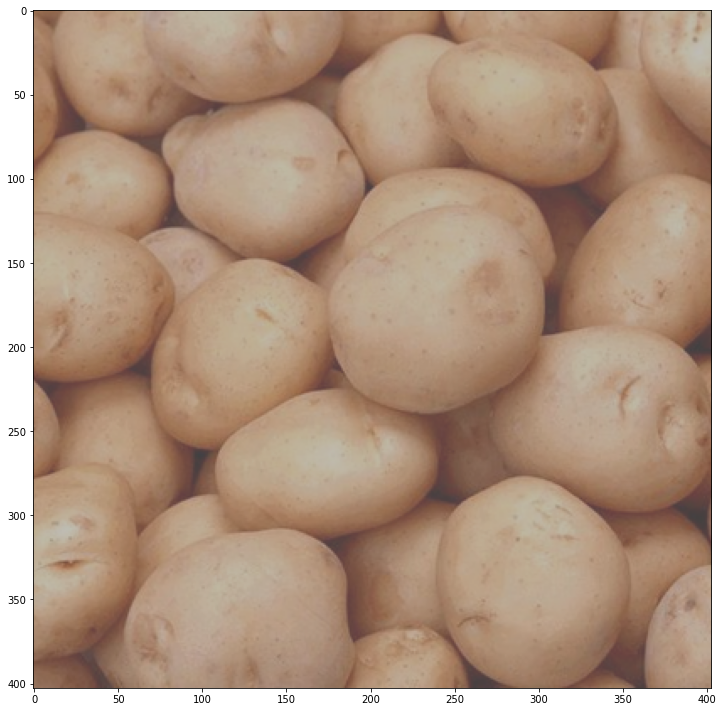

In [ ]:
import matplotlib.pyplot as plt
img = mmcv.imread('/content/drive/MyDrive/mmseg/test/1.png')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

img_dir = "/content/drive/MyDrive/mmseg/test"
for file in img_dir:
    file = mmcv.imread('/content/drive/MyDrive/mmseg/test/1.png')
    result = inference_segmentor(model, img)
    model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

/content/drive/MyDrive/mmseg/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


<Figure size 576x432 with 0 Axes>

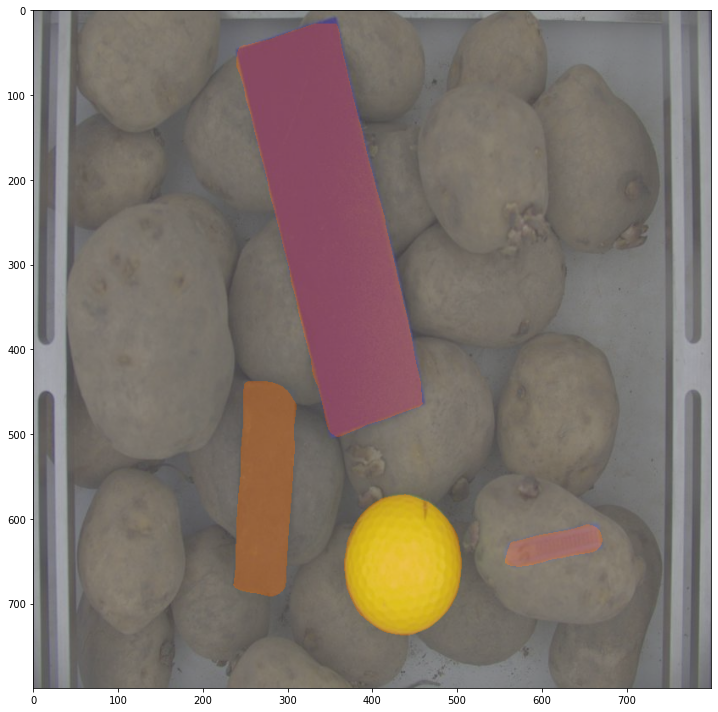

<Figure size 576x432 with 0 Axes>

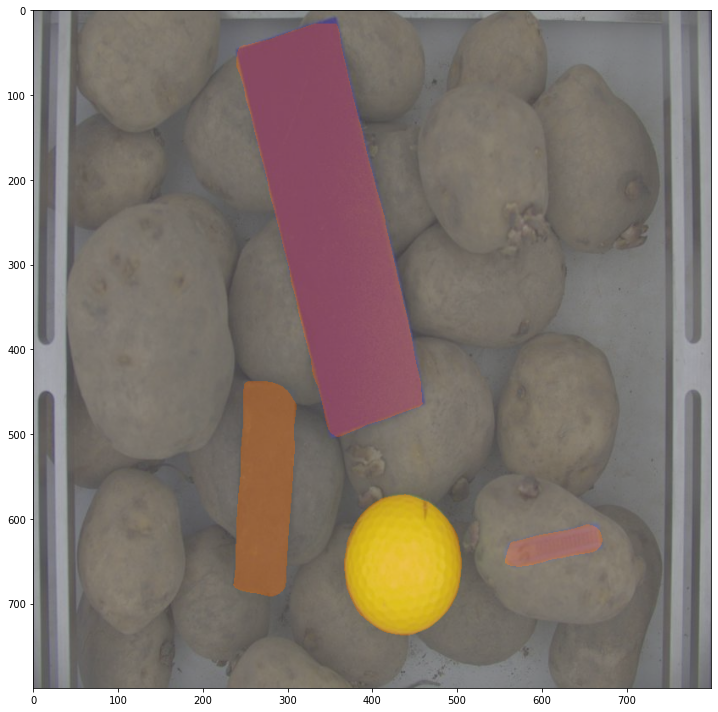

<Figure size 576x432 with 0 Axes>

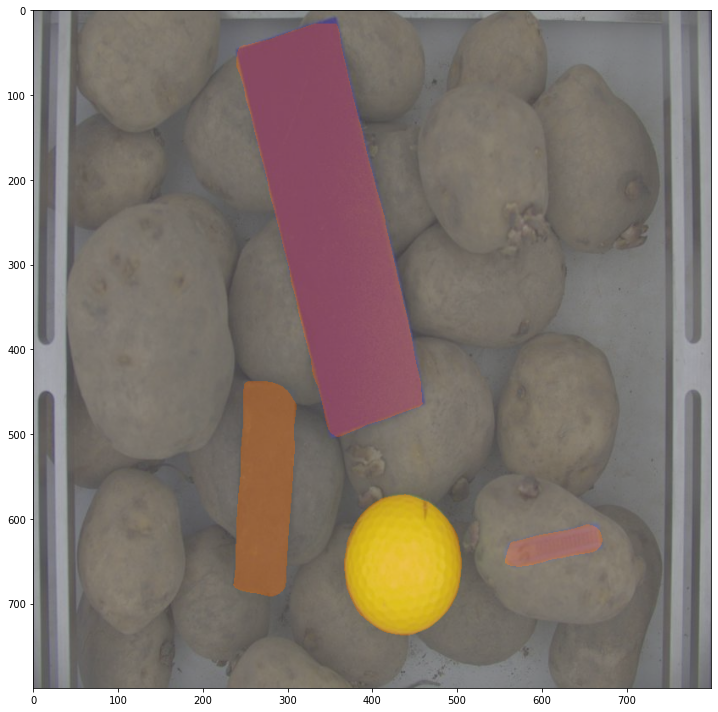

<Figure size 576x432 with 0 Axes>

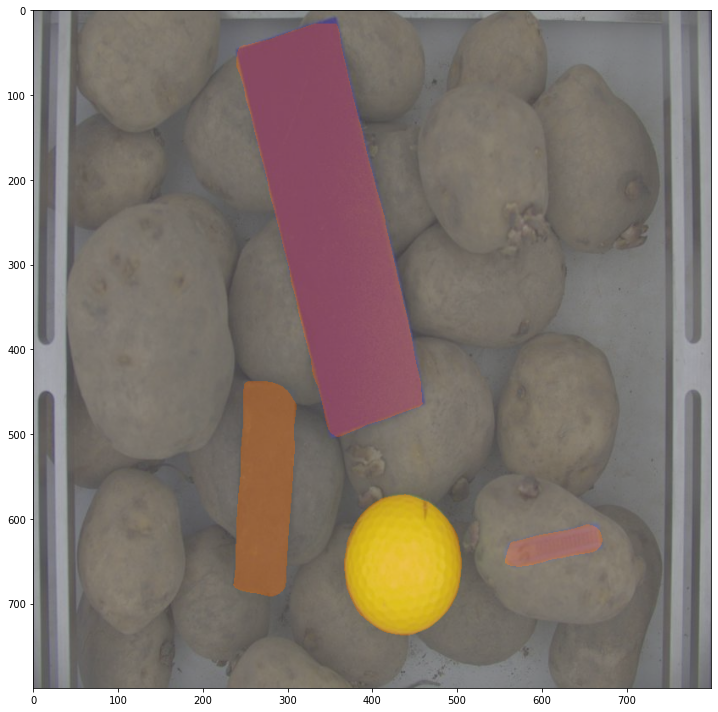

<Figure size 576x432 with 0 Axes>

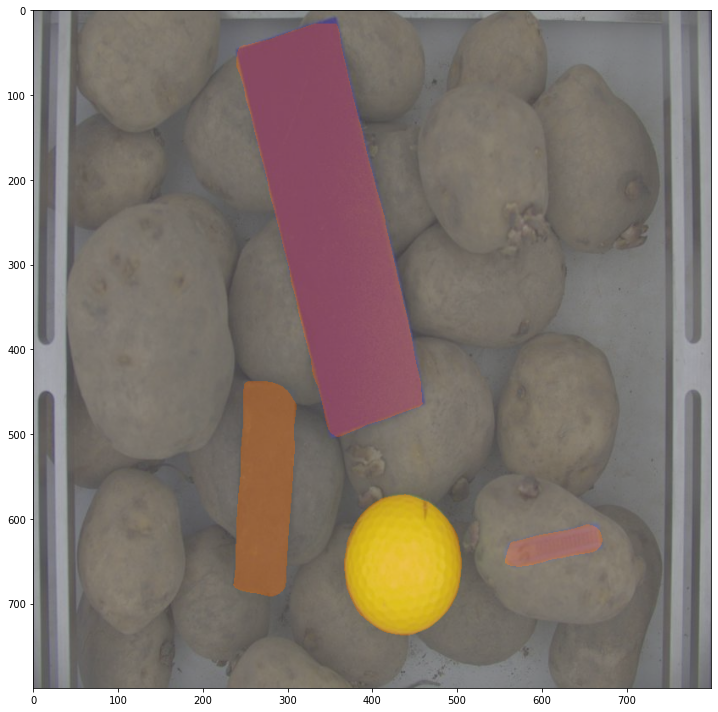

<Figure size 576x432 with 0 Axes>

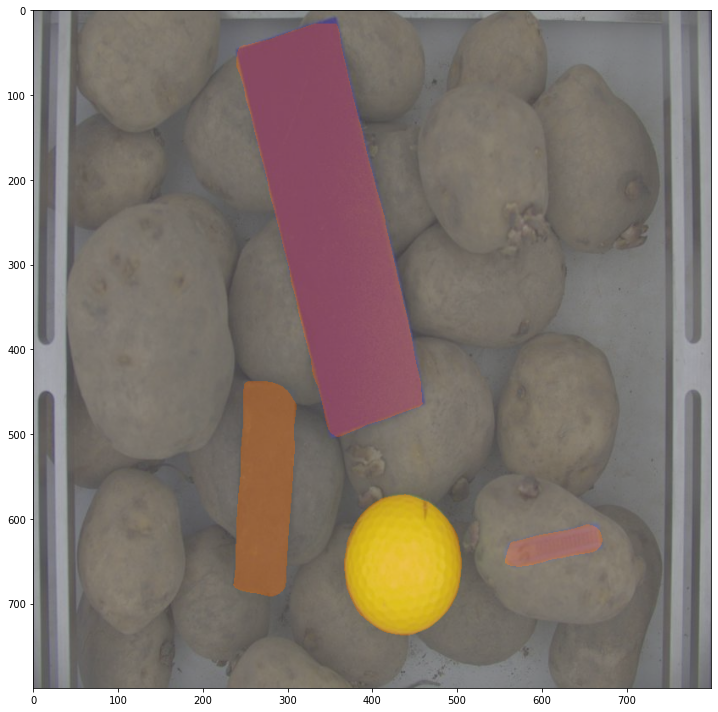

<Figure size 576x432 with 0 Axes>

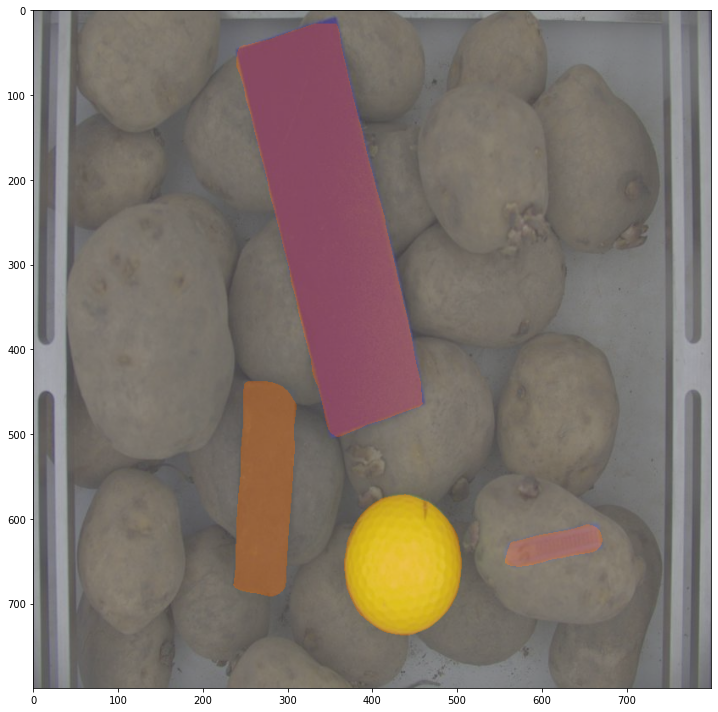

<Figure size 576x432 with 0 Axes>

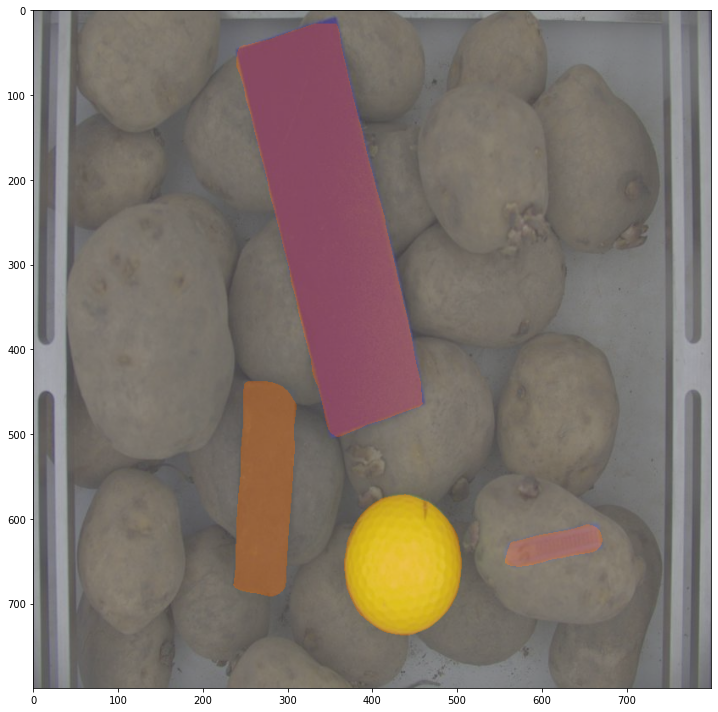

<Figure size 576x432 with 0 Axes>

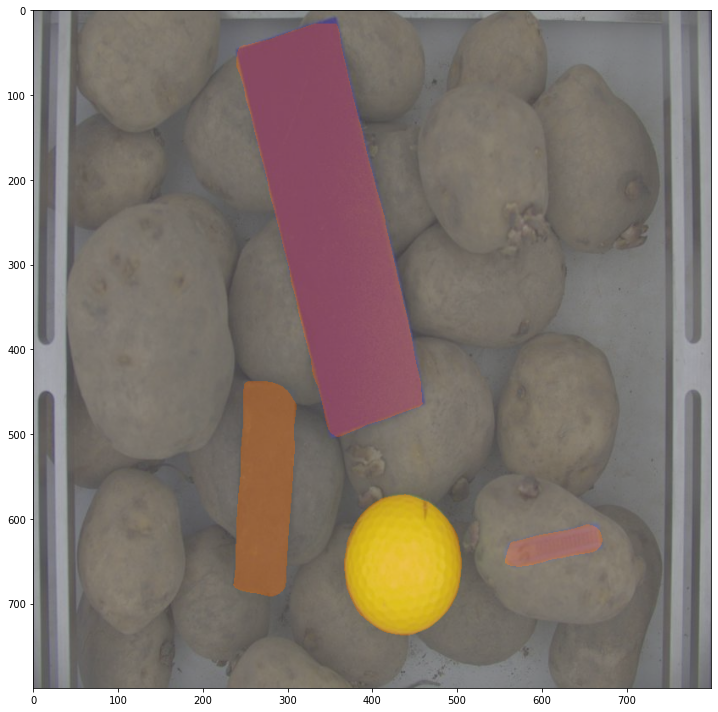

<Figure size 576x432 with 0 Axes>

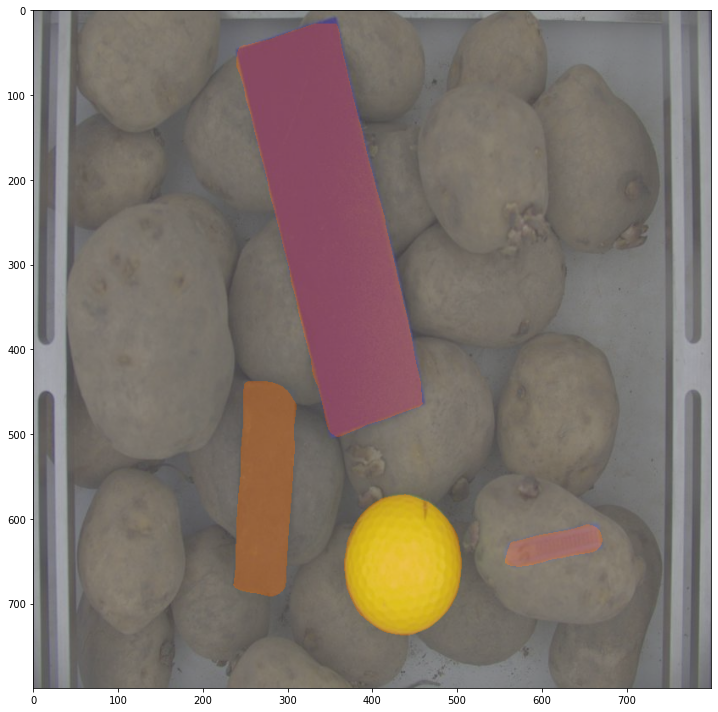

<Figure size 576x432 with 0 Axes>

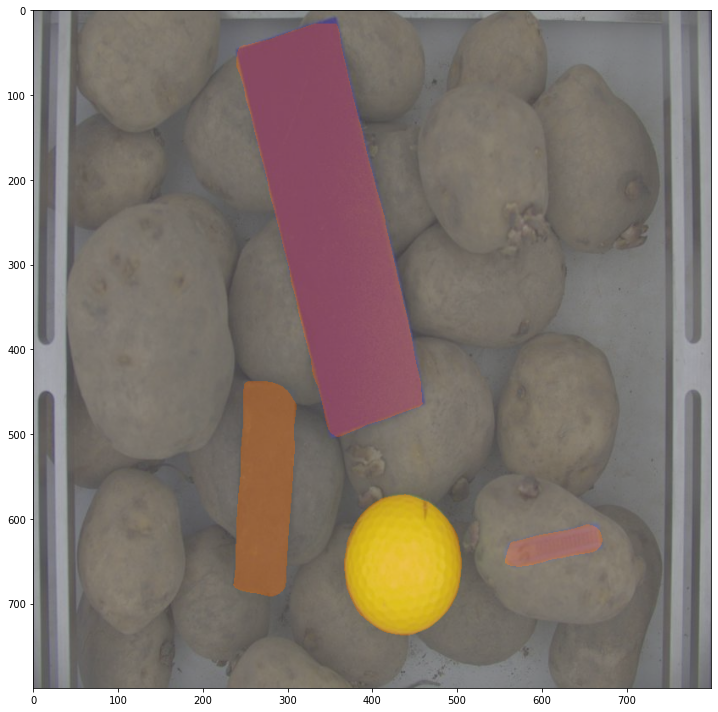

<Figure size 576x432 with 0 Axes>

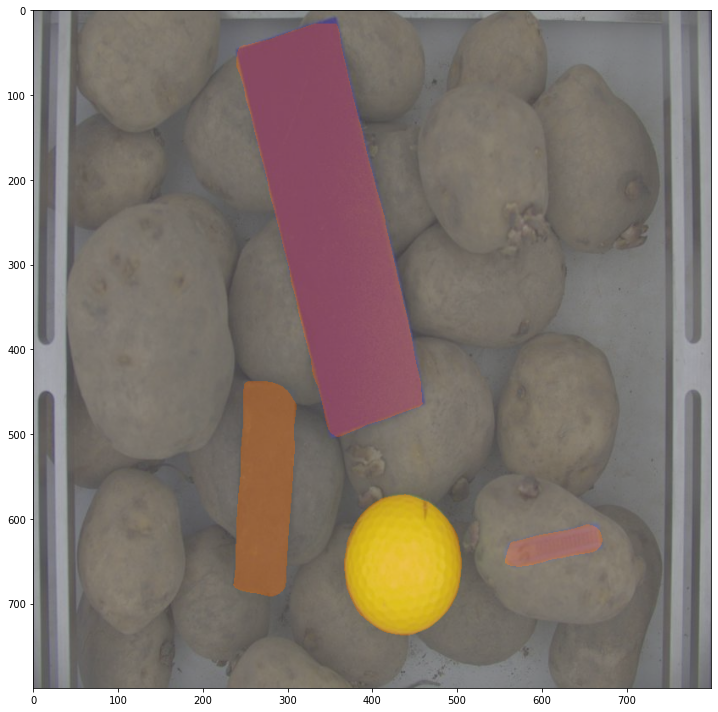

<Figure size 576x432 with 0 Axes>

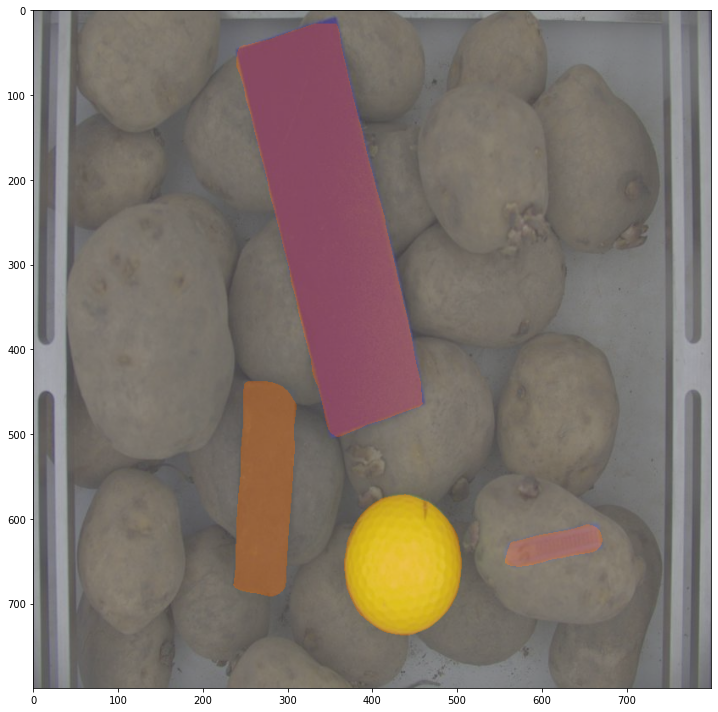

<Figure size 576x432 with 0 Axes>

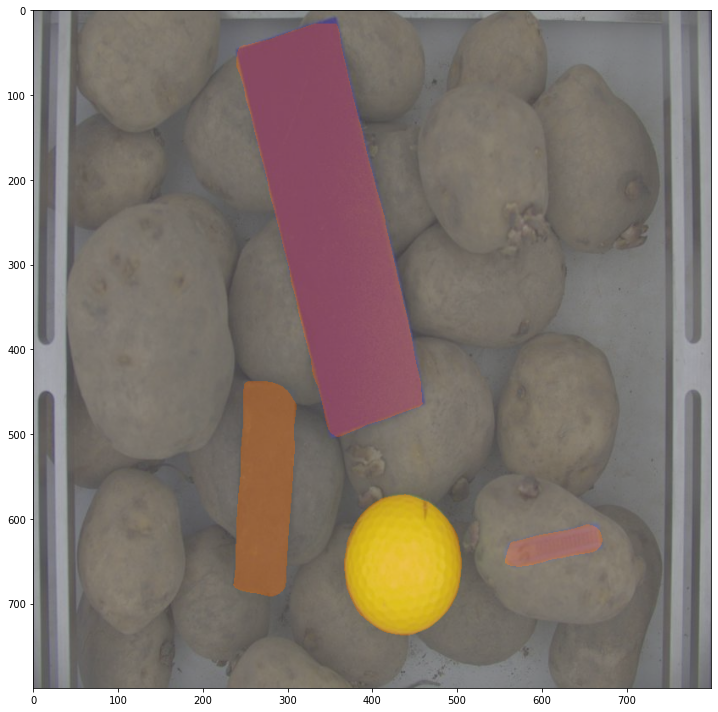

<Figure size 576x432 with 0 Axes>

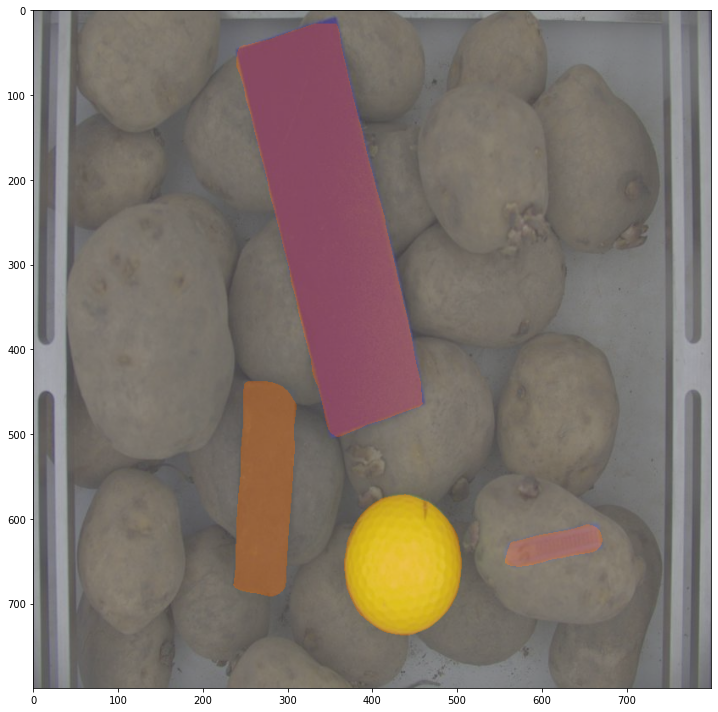

<Figure size 576x432 with 0 Axes>

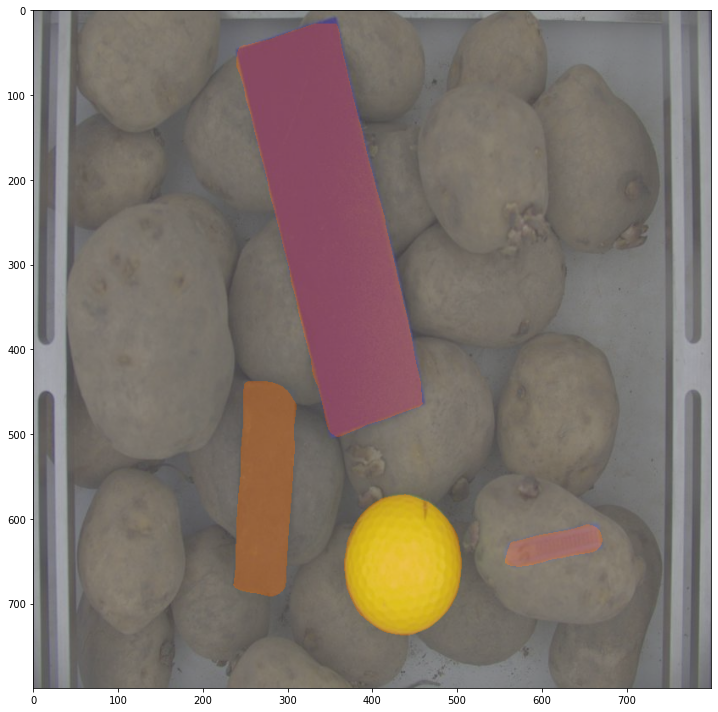

<Figure size 576x432 with 0 Axes>

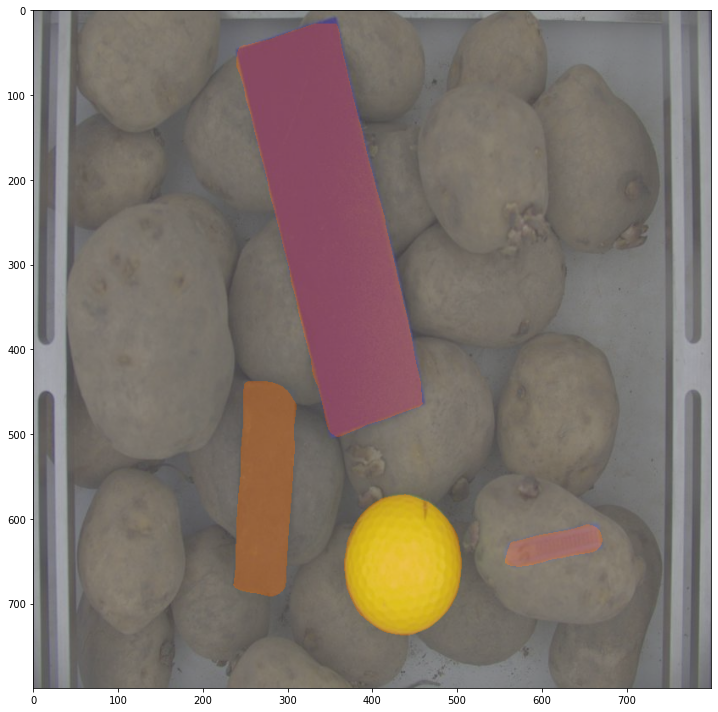

<Figure size 576x432 with 0 Axes>

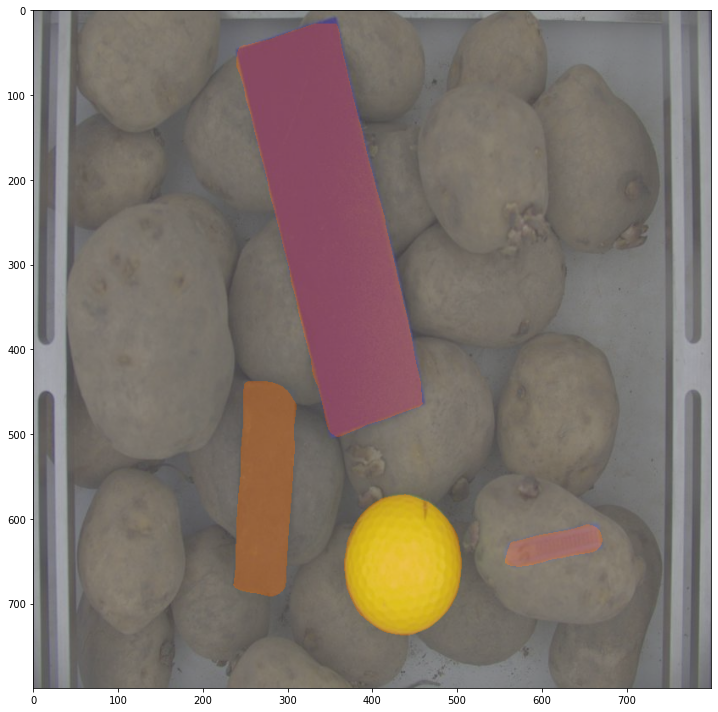

<Figure size 576x432 with 0 Axes>

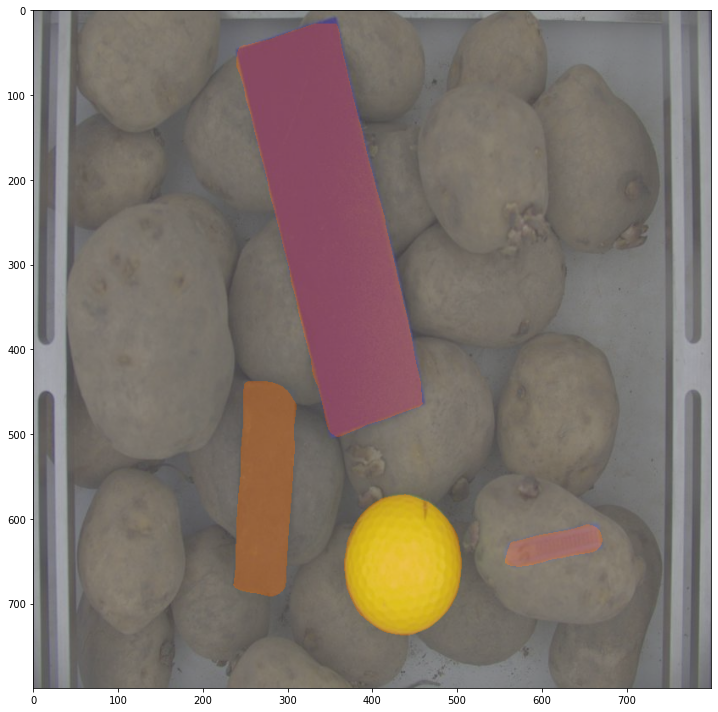

<Figure size 576x432 with 0 Axes>

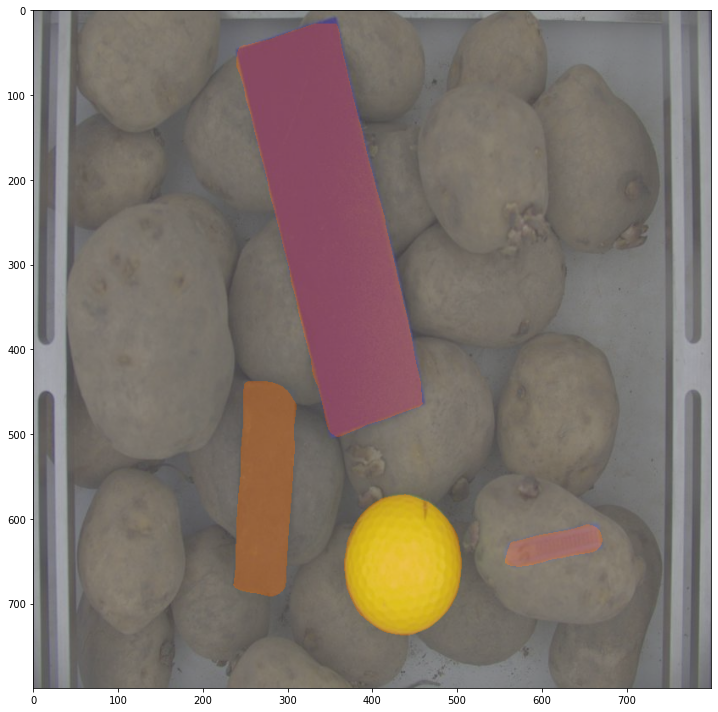

<Figure size 576x432 with 0 Axes>

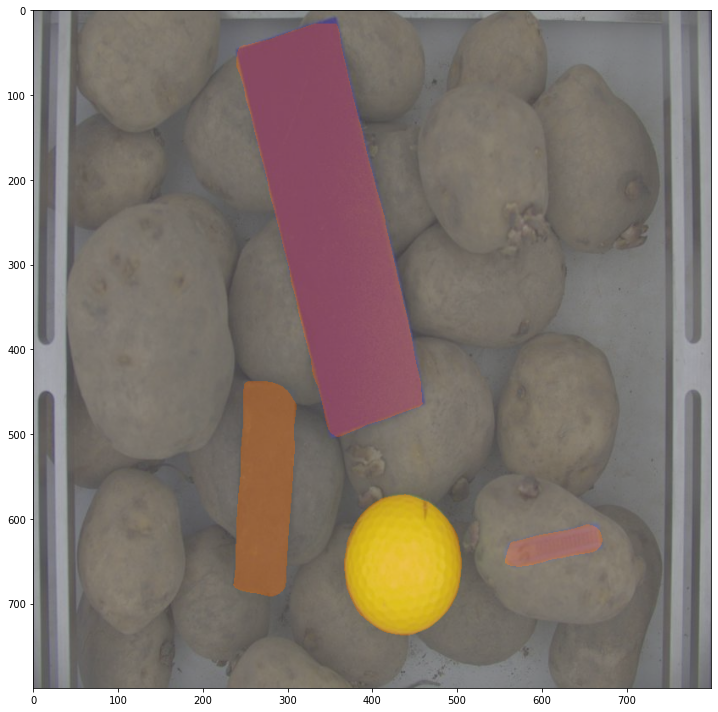

<Figure size 576x432 with 0 Axes>

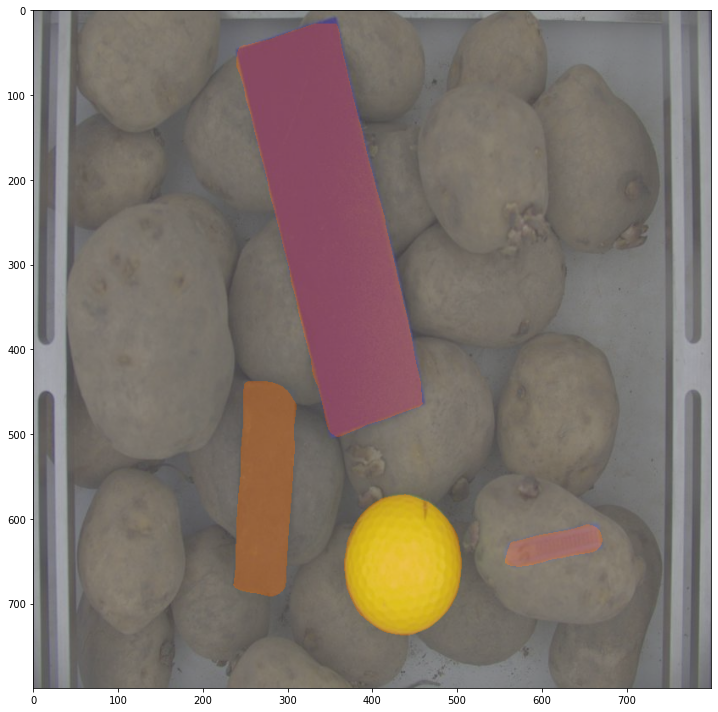

<Figure size 576x432 with 0 Axes>

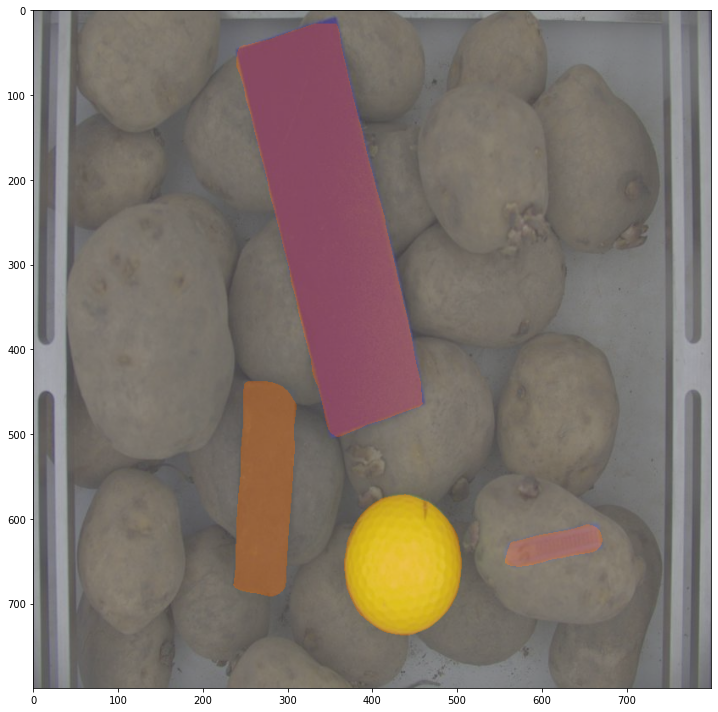

<Figure size 576x432 with 0 Axes>

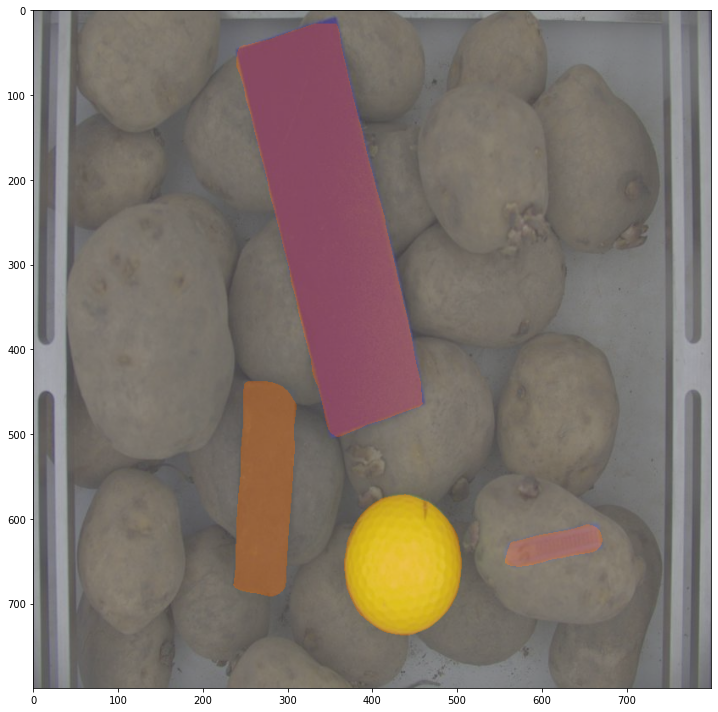

<Figure size 576x432 with 0 Axes>

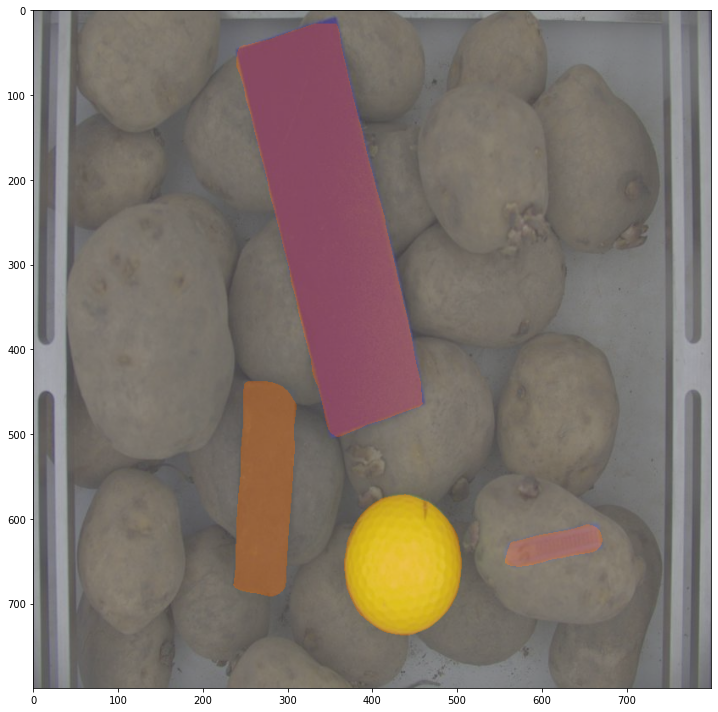

In [ ]:

import glob
for filename in (os.listdir(img_dir)):
  filename = mmcv.imread(osp.join(img_dir, filename))
  model.cfg = cfg
  result = inference_segmentor(model, img)
  plt.figure(figsize=(8, 6))
  show_result_pyplot(model, img, result, palette)


In [ ]:
img = mmcv.imread('/content/drive/MyDrive/mmseg/test')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

IsADirectoryError: ignored

In [ ]:
cfg.checkpoint_config

{'by_epoch': False,
 'interval': 200,
 'meta': {'CLASSES': ('error', 'background'),
  'PALETTE': [[128, 128, 128], [241, 134, 51]]}}

In [ ]:
from mmseg.apis import inference_segmentor, init_segmentor
import mmcv
import os

checkpoint_file = '/content/drive/MyDrive/mmseg/mmsegmentation/work_dirs/tutorial/latest.pth'

# build the model from a config file and a checkpoint file
model = init_segmentor(cfg, checkpoint_file, device='cuda:0')

img_dir = "/content/drive/MyDrive/mmseg/test"
files = mmcv.scandir(img_dir)
for file in files:
    img = os.path.join(img_dir,file)
    # test a single image and show the results
    result = inference_segmentor(model, img)

/content/drive/MyDrive/mmseg/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/mmseg/mmsegmentation/work_dirs/tutorial/latest.pth


KeyError: ignored

In [ ]:
dir(model)

['CLASSES',
 'T_destination',
 '__abstractmethods__',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_apply',
 '_auxiliary_head_forward_train',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_decode_head_forward_test',
 '_decode_head_forward_train',
 '_dump_init_info',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_auxiliary_head',
 '_init_decode_head',
 '_is_full_backward_hook',
 '_is_init',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_s